# Loading All The Libraries

In [58]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px #Interactive plot
import warnings
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

#All Models Library
from sklearn.datasets import make_regression
from sklearn.metrics import r2_score, mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import SVR
from keras.models import Sequential
from keras.layers import LSTM, Dense

# Loading Wholesale Meat Dataset

In [59]:
meat_data = pd.read_excel(r"C:\Users\Bharath\OneDrive\Desktop\Disseration\Important data\Wholesale Price Cleaned_Data.xlsx")
# Extract Year and Month from 'Period'
meat_data['Year'] = pd.to_datetime(meat_data['Period']).dt.year
meat_data['Month'] = pd.to_datetime(meat_data['Period']).dt.month
#Set period column to index
meat_data['Period'] = pd.to_datetime(meat_data['Period'])
meat_data = meat_data.set_index('Period')
# Combine Year and Month into a single column
meat_data['YearMonth'] = meat_data['Year'].astype(str) + '-' + meat_data['Month'].astype(str).str.zfill(2)
print(meat_data.shape)

(8176, 6)


In [3]:
# Checking the first 10 rows of the dataset
meat_data.head(10)

,Meat Type,Meat Sub-Type,Price Dollars/cwt/doz,Year,Month,YearMonth
Period,,,,,,
2000-01-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,114.74,2000,1,2000-01
2000-02-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,112.59,2000,2,2000-02
2000-03-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,118.42,2000,3,2000-03
2000-04-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,123.45,2000,4,2000-04
2000-05-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,124.88,2000,5,2000-05
2000-06-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,123.30,2000,6,2000-06
2000-07-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,115.85,2000,7,2000-07
2000-08-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,111.20,2000,8,2000-08
2000-09-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,108.68,2000,9,2000-09


In [4]:
# Checking the last 10 rows of the dataset
meat_data.tail(10)

,Meat Type,Meat Sub-Type,Price Dollars/cwt/doz,Year,Month,YearMonth
Period,,,,,,
2023-07-01,"Eggs, Grade A, large",New York,123.00,2023,7,2023-07
2023-08-01,"Eggs, Grade A, large",New York,142.20,2023,8,2023-08
2023-09-01,"Eggs, Grade A, large",New York,142.05,2023,9,2023-09
2023-10-01,"Eggs, Grade A, large",New York,128.90,2023,10,2023-10
2023-11-01,"Eggs, Grade A, large",New York,213.20,2023,11,2023-11
2023-12-01,"Eggs, Grade A, large",New York,204.40,2023,12,2023-12
2024-01-01,"Eggs, Grade A, large",New York,225.00,2024,1,2024-01
2024-02-01,"Eggs, Grade A, large",New York,312.75,2024,2,2024-02
2024-03-01,"Eggs, Grade A, large",New York,238.14,2024,3,2024-03


# Data Cleaning

In [5]:
#Dataset descriptions
meat_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 8176 entries, 2000-01-01 to 2024-04-01
Data columns (total 6 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Meat Type              8176 non-null   object 
 1   Meat  Sub-Type         8176 non-null   object 
 2   Price Dollars/cwt/doz  8176 non-null   float64
 3   Year                   8176 non-null   int32  
 4   Month                  8176 non-null   int32  
 5   YearMonth              8176 non-null   object 
dtypes: float64(1), int32(2), object(3)
memory usage: 383.2+ KB


In [6]:
#Checking the unique meat type
meat_data['Meat Type'].unique()

array(['Beef, Central U.S.', 'Pork, Central U.S.', 'Lamb, East Coast',
       'Broilers', 'Turkeys', 'Eggs, Grade A, large'], dtype=object)

In [7]:
#Checking the unique meat sub-type
meat_data['Meat  Sub-Type'].unique()

array(['Boxed beef cutout   /  choice 1-3 (600-900) lsb',
       'Boxed beef cutout   /  select 1-3 (600-900) lsb',
       'Boneless beef, 90 percent, fresh',
       'Imported boneless beef, 90 percent, frozen',
       'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
       'Bellies, 12-14 lb, skin on', 'Hams, 23-27 lb, trimmed selected',
       'Trimmings, 72% combo', '55-65 lb, Choice', 'National composite',
       '12-city composite¹', 'Georgia dock²',
       'Northeast parts³  / Breast, boneless',
       'Northeast parts³  / Breast, ribs on',
       'Northeast parts³  /Legs, whole',
       'Northeast parts³  /Leg quarters',
       'National parts / Breast, boneless',
       'National parts / Breast, ribs on', 'National parts / Legs, whole',
       'National parts / Leg quarters', 'Hens, 8-16 lb', 'Toms, 16-24 lb',
       'Breast, 4-8 lb', 'Drumsticks', 'Wings, full cut',
       'Combined regional', 'New York'], dtype=object)

In [4]:
#Checking for duplicated values
meat_data.duplicated().sum()


0

In [5]:
#Checking for null values
meat_data.isnull().sum()

Meat Type                0
Meat  Sub-Type           0
Price Dollars/cwt/doz    0
Year                     0
Month                    0
YearMonth                0
dtype: int64

In [6]:
# The number of zero values for the "Price Dollars/cwt/doz" column for each meat subtype.
zero_price_counts = meat_data[meat_data['Price Dollars/cwt/doz'] == 0].groupby('Meat  Sub-Type').size()
print(zero_price_counts)

Meat  Sub-Type
12-city composite¹                      136
55-65 lb, Choice                         90
Bellies, 12-14 lb, skin on               47
Boneless beef, 90 percent, fresh          2
Breast, 4-8 lb                            2
Georgia dock²                            96
Hams, 23-27 lb, trimmed selected          1
National composite                      156
National parts / Breast, boneless       272
National parts / Breast, ribs on        272
National parts / Leg quarters           272
National parts / Legs, whole            272
Northeast parts³  / Breast, boneless     20
Northeast parts³  / Breast, ribs on      20
Northeast parts³  /Leg quarters          20
Northeast parts³  /Legs, whole           20
dtype: int64


In [7]:
# list of meat subtypes that have no zero values for the "Price Dollars/cwt/doz" column
zero_value_check = meat_data.groupby('Meat  Sub-Type')['Price Dollars/cwt/doz'].apply(lambda x: (x == 0).any())

# Filter to get subtypes where there are no zero values
no_zero_subtypes = zero_value_check[zero_value_check == False].index
print("Meat Sub-Types with no zero values:")
print(no_zero_subtypes)

Meat Sub-Types with no zero values:
Index(['Boxed beef cutout   /  choice 1-3 (600-900) lsb',
       'Boxed beef cutout   /  select 1-3 (600-900) lsb', 'Combined regional',
       'Drumsticks', 'Hens, 8-16 lb',
       'Imported boneless beef, 90 percent, frozen',
       'Loins, 1/4", trimmed vacuum-packed', 'New York',
       'Pork cutout composite', 'Toms, 16-24 lb', 'Trimmings, 72% combo',
       'Wings, full cut'],
      dtype='object', name='Meat  Sub-Type')


# Exploratry Data Analysis (EDA)

### Analysing the columns that has no zero values for each meat sub-type price

In [60]:
# Identify subtypes with no zero values
no_zero_subtypes = meat_data.groupby('Meat  Sub-Type')['Price Dollars/cwt/doz'].apply(lambda x: (x == 0).any() == False)

# Filter the DataFrame to only include these subtypes
df_no_zero = meat_data[meat_data['Meat  Sub-Type'].isin(no_zero_subtypes[no_zero_subtypes].index)]


In [61]:
# List of specific meat sub-types to include
selected_meat_types = [ 'Boxed beef cutout   /  select 1-3 (600-900) lsb',
                       'Imported boneless beef, 90 percent, frozen',
                       'Pork cutout composite',
                       'Loins, 1/4", trimmed vacuum-packed',
                        'Drumsticks', 'Wings, full cut']

# Filter the dataframe for the selected meat sub-types
filtered_df = df_no_zero[df_no_zero['Meat  Sub-Type'].isin(selected_meat_types)]

# Calculate descriptive statistics for the selected meat sub-types
descriptive_stats = filtered_df.groupby('Meat  Sub-Type')['Price Dollars/cwt/doz'].describe()
print(descriptive_stats)

# Save the descriptive statistics as an Excel file
descriptive_stats.to_excel('descriptive_stats.xlsx')

                                                 count        mean        std  \
Meat  Sub-Type                                                                  
Boxed beef cutout   /  select 1-3 (600-900) lsb  292.0  178.545080  52.682498   
Drumsticks                                       292.0   61.159654  24.621266   
Imported boneless beef, 90 percent, frozen       292.0  183.182420  58.111138   
Loins, 1/4", trimmed vacuum-packed               292.0  108.389056  17.403415   
Pork cutout composite                            292.0   78.517615  16.567845   
Wings, full cut                                  292.0   55.071507  25.546061   

                                                    min       25%      50%  \
Meat  Sub-Type                                                               
Boxed beef cutout   /  select 1-3 (600-900) lsb  101.46  134.3375  176.180   
Drumsticks                                        17.99   42.9025   59.995   
Imported boneless beef, 90 percent, fro

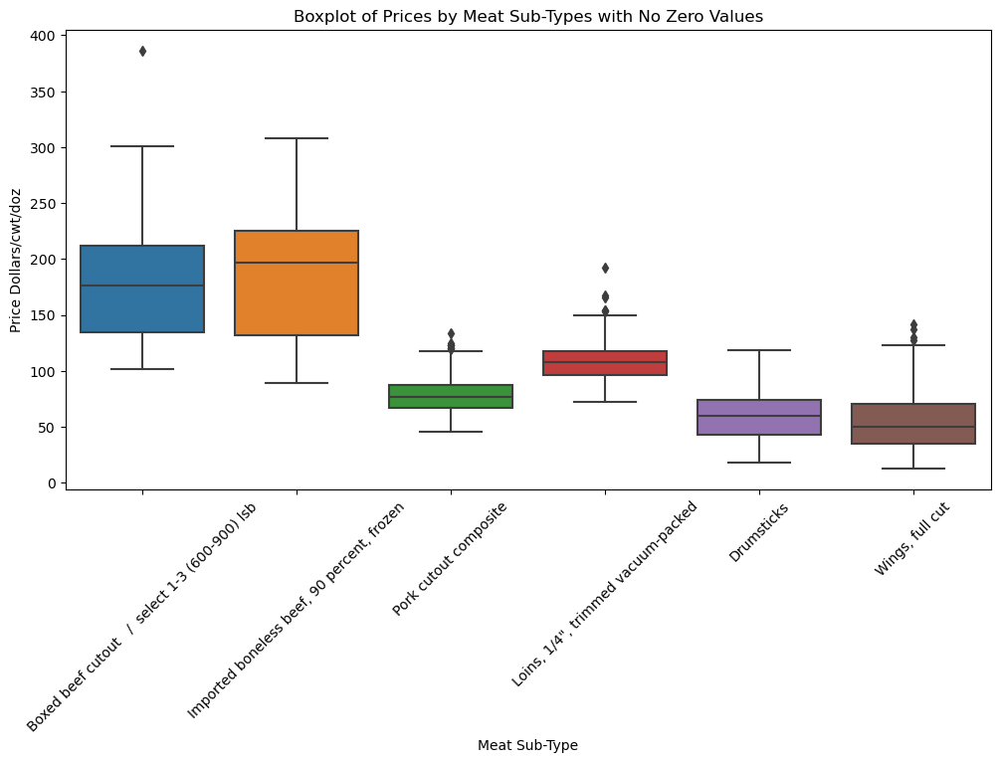

In [62]:
# Boxplot for price distribution
plt.figure(figsize=(12, 6))
sns.boxplot(data=filtered_df, x='Meat  Sub-Type', y='Price Dollars/cwt/doz')
plt.title('Boxplot of Prices by Meat Sub-Types with No Zero Values')
plt.xlabel('Meat Sub-Type')
plt.ylabel('Price Dollars/cwt/doz')
plt.xticks(rotation=45)
plt.show()
#Boxplots visually display the distribution of data and highlight the median, quartiles, and outliers, allowing for an easy comparison between different categories.

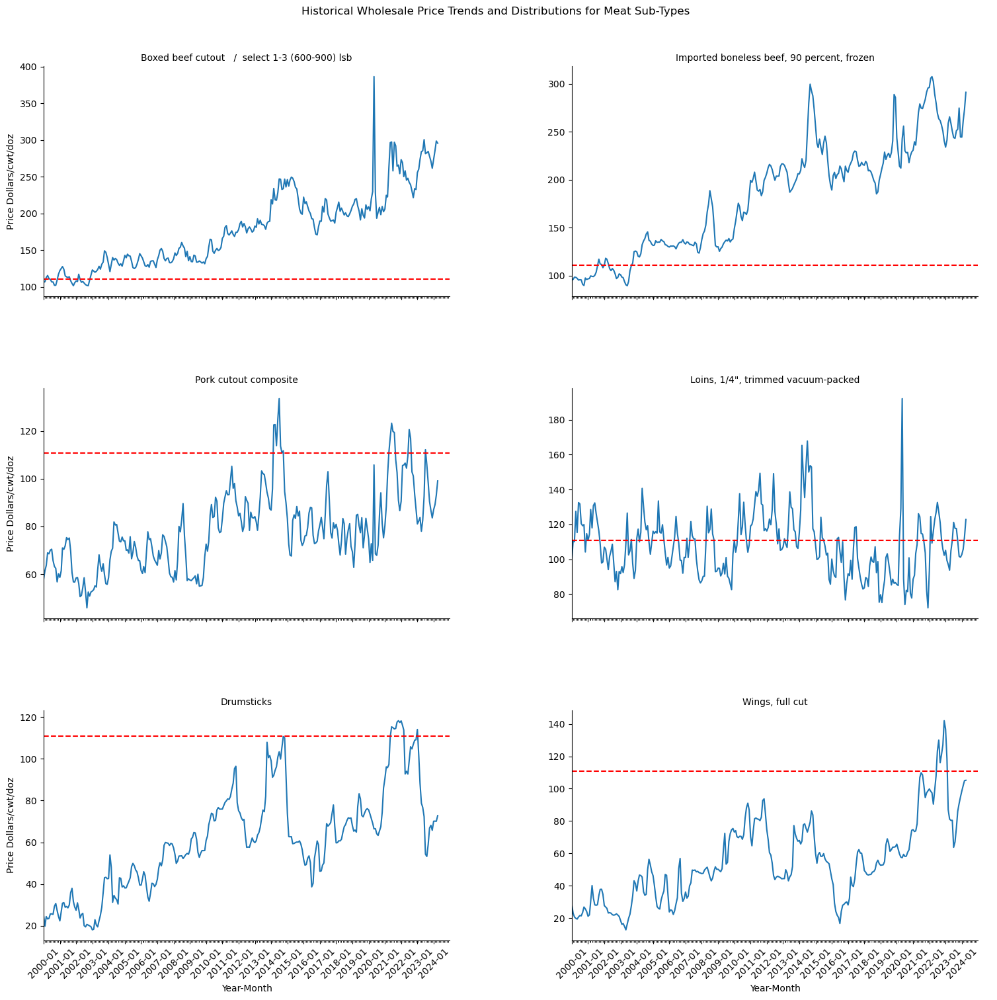

In [68]:
# Checking Price Trend for each meat sub type

filtered_df['YearMonth'] = pd.to_datetime(filtered_df['YearMonth'], format='%Y-%m')

# Adjust the figure size for better readability
g = sns.FacetGrid(filtered_df, col="Meat  Sub-Type", col_wrap=2, height=5, aspect=1.5, sharey=False)

# Plot the line plots for each meat sub-type
g.map(sns.lineplot, "YearMonth", "Price Dollars/cwt/doz")

# Add a horizontal line for the overall mean price
mean_price = filtered_df['Price Dollars/cwt/doz'].mean()
g.map(plt.axhline, y=mean_price, ls="--", c="red")

# Format the x-axis for better date visibility
for ax in g.axes.flat:
    # Set major ticks to every year
    ax.xaxis.set_major_locator(mdates.YearLocator())
    # Set minor ticks to every month
    ax.xaxis.set_minor_locator(mdates.MonthLocator())
    # Format the date to show Year-Month
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    ax.tick_params(axis='x', rotation=45)

    # Set the x-axis limits to ensure it covers from 2000 to 2024
    ax.set_xlim(pd.Timestamp('2000-01-01'), pd.Timestamp('2024-12-31'))

# Add titles and labels
g.set_titles("{col_name}")
g.set_axis_labels("Year-Month", "Price Dollars/cwt/doz")
g.add_legend()

# Adjust the layout for better spacing and title visibility
plt.subplots_adjust(top=0.92, hspace=0.4, wspace=0.3)
g.fig.suptitle('Historical Wholesale Price Trends and Distributions for Meat Sub-Types')

# Show the plot
plt.show()

# Save the figure as a high-resolution PNG
g.savefig('meat_price_trends_facetgrid.png', dpi=300, bbox_inches='tight')

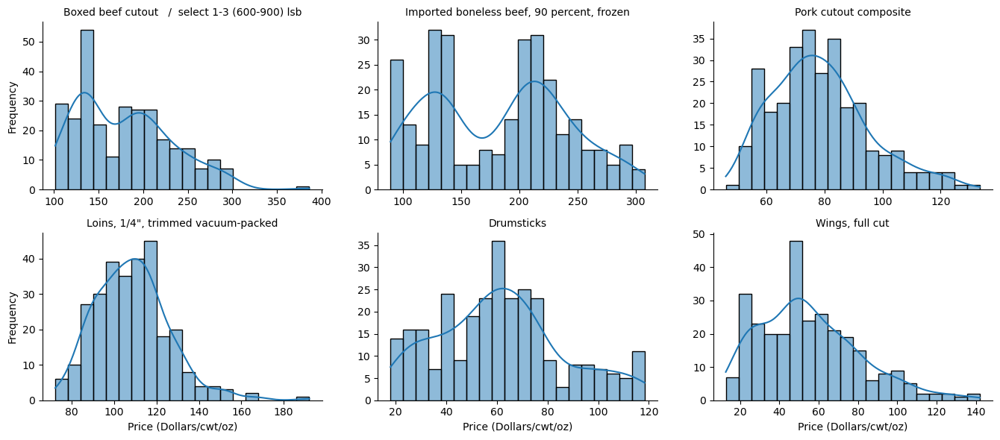

In [70]:
# Using Facet Grid Plot Checking Historgam for each meat sub type

# Set up the FacetGrid with Seaborn
g = sns.FacetGrid(filtered_df, col='Meat  Sub-Type', col_wrap=3, height=3, aspect=1.5, sharex=False, sharey=False)

# Map the histplot function to the FacetGrid
g.map(sns.histplot, 'Price Dollars/cwt/doz', kde=True, bins=20)

# Set titles and labels for the entire plot
g.set_titles(col_template="{col_name}")
g.set_axis_labels('Price (Dollars/cwt/oz)', 'Frequency')

# Show the plot
plt.show()

# Save the figure as a high-resolution PNG
g.savefig('Histrogram_facetgrid.png', dpi=300, bbox_inches='tight')


In [72]:
selected_meat_subtypes = [
    'Drumsticks', 
    'Imported boneless beef, 90 percent, frozen',
    'Loins, 1/4", trimmed vacuum-packed', 
    'Pork cutout composite', 
    'Wings, full cut',
    'Boxed beef cutout   /  select 1-3 (600-900) lsb'
]

# Filter the data to include only the selected meat sub-types
filtered_df = df_no_zero[df_no_zero['Meat  Sub-Type'].isin(selected_meat_subtypes)]

# Convert 'YearMonth' to datetime format if necessary
filtered_df['YearMonth'] = pd.to_datetime(filtered_df['YearMonth'], format='%Y-%m')

# Check the filtered data
print(filtered_df.head())


                     Meat Type  \
Period                           
2000-01-01  Beef, Central U.S.   
2000-02-01  Beef, Central U.S.   
2000-03-01  Beef, Central U.S.   
2000-04-01  Beef, Central U.S.   
2000-05-01  Beef, Central U.S.   

                                             Meat  Sub-Type  \
Period                                                        
2000-01-01  Boxed beef cutout   /  select 1-3 (600-900) lsb   
2000-02-01  Boxed beef cutout   /  select 1-3 (600-900) lsb   
2000-03-01  Boxed beef cutout   /  select 1-3 (600-900) lsb   
2000-04-01  Boxed beef cutout   /  select 1-3 (600-900) lsb   
2000-05-01  Boxed beef cutout   /  select 1-3 (600-900) lsb   

            Price Dollars/cwt/doz  Year  Month  YearMonth  
Period                                                     
2000-01-01                 106.09  2000      1 2000-01-01  
2000-02-01                 106.88  2000      2 2000-02-01  
2000-03-01                 112.56  2000      3 2000-03-01  
2000-04-01         

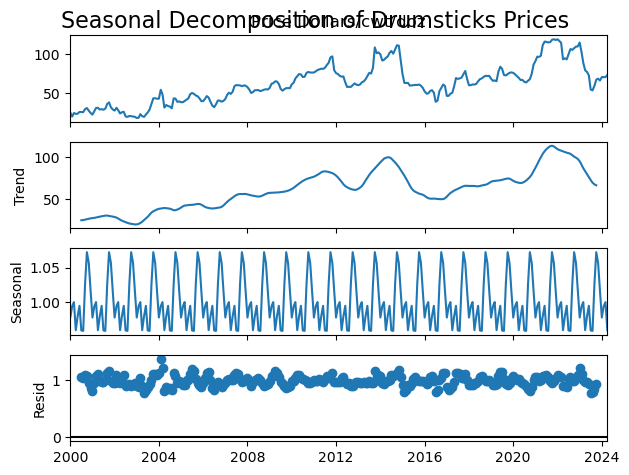

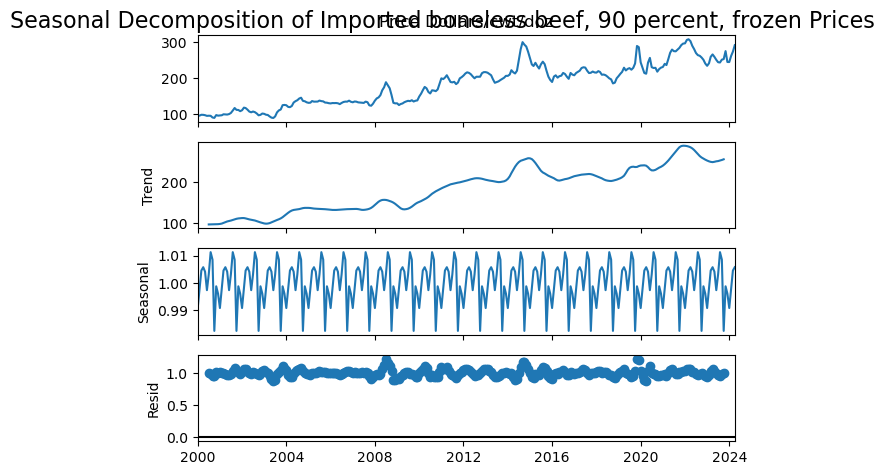

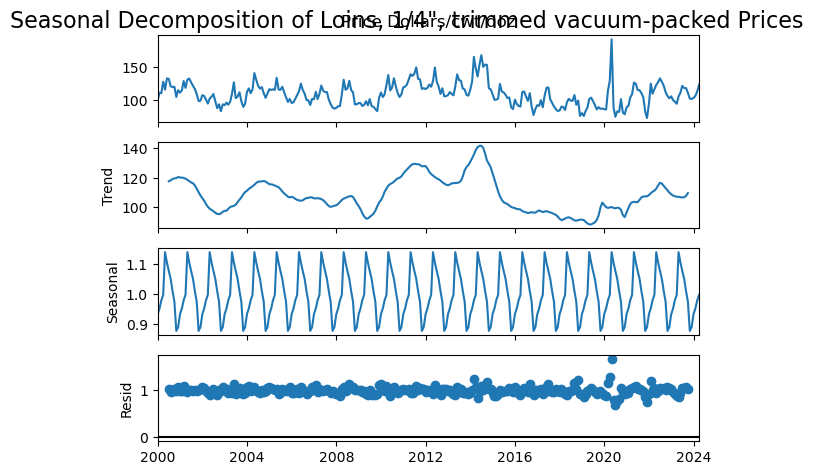

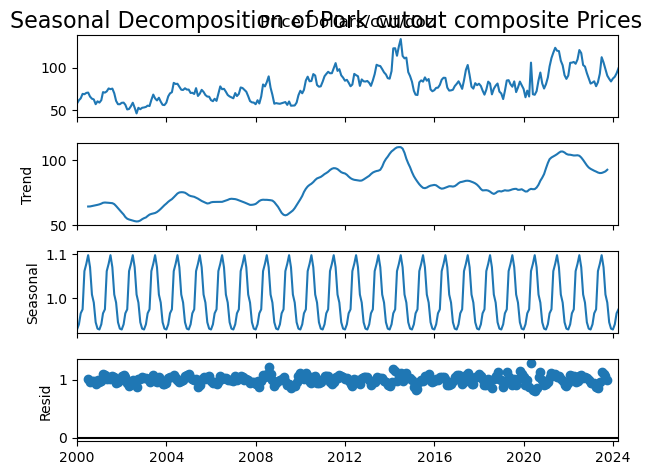

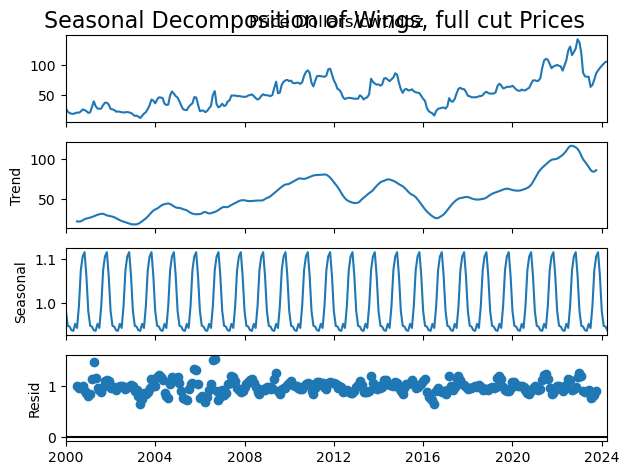

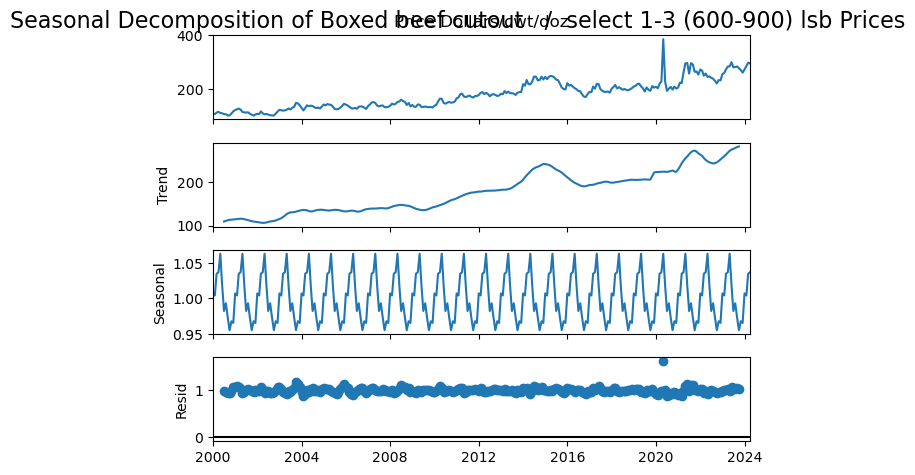

In [31]:
# Decompose the time series for each selected meat sub-type
for subtype in selected_meat_subtypes:
    subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
    
    # Seasonal decomposition
    decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)
    
    # Plot the decomposed components
    decomposition.plot(30, 20)
    plt.suptitle(f'Seasonal Decomposition of {subtype} Prices', fontsize=16)
    plt.show()


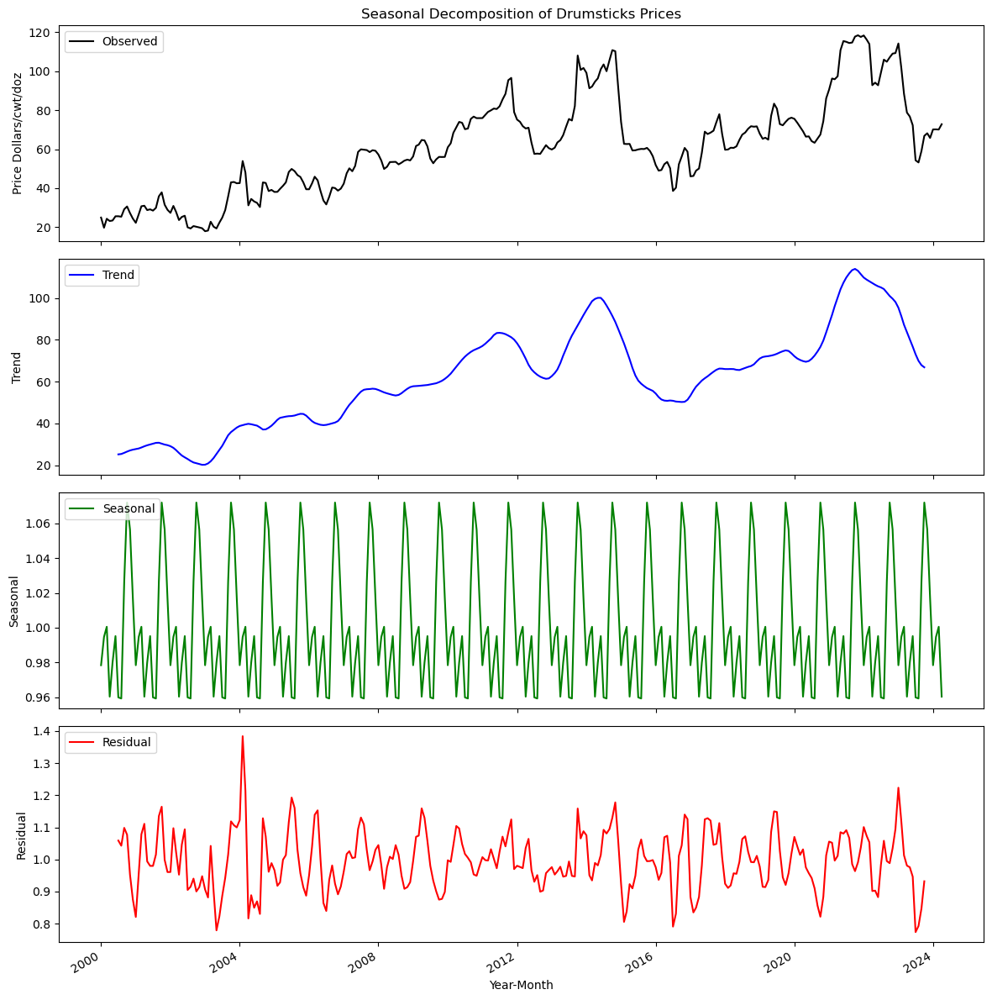

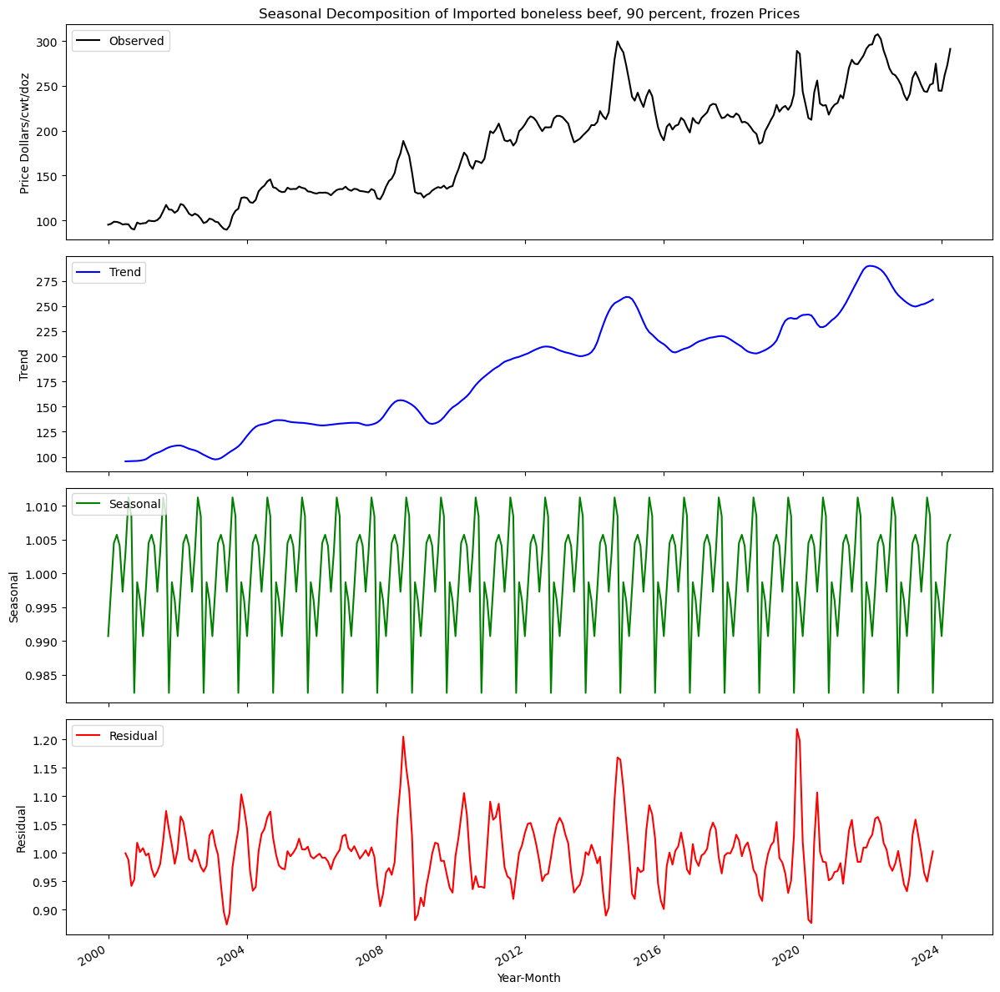

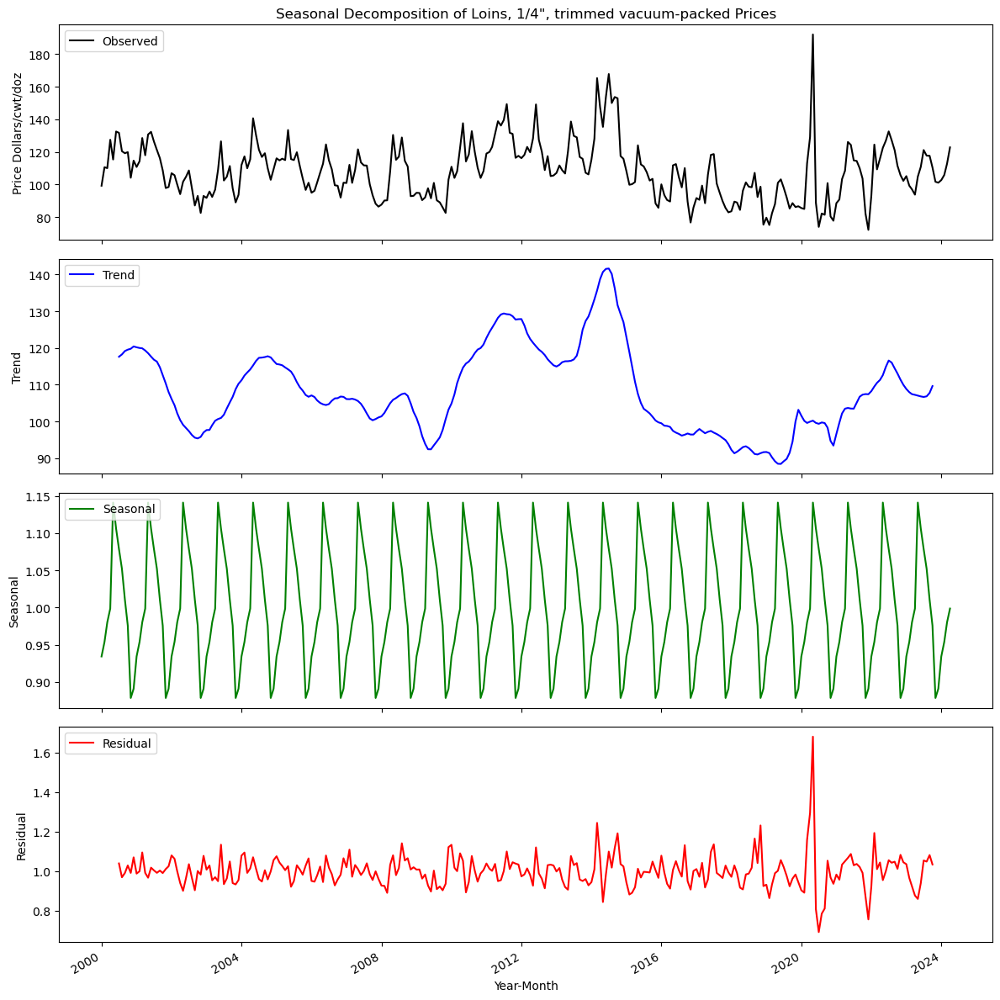

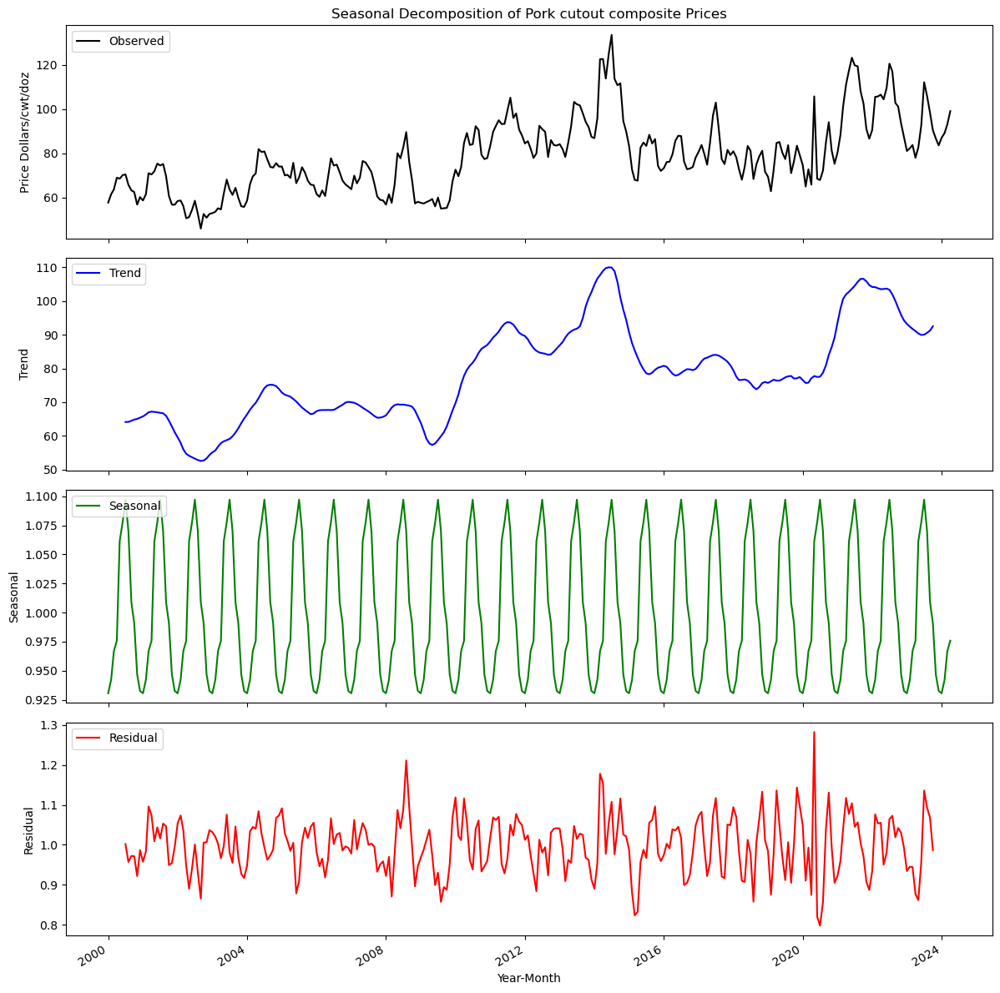

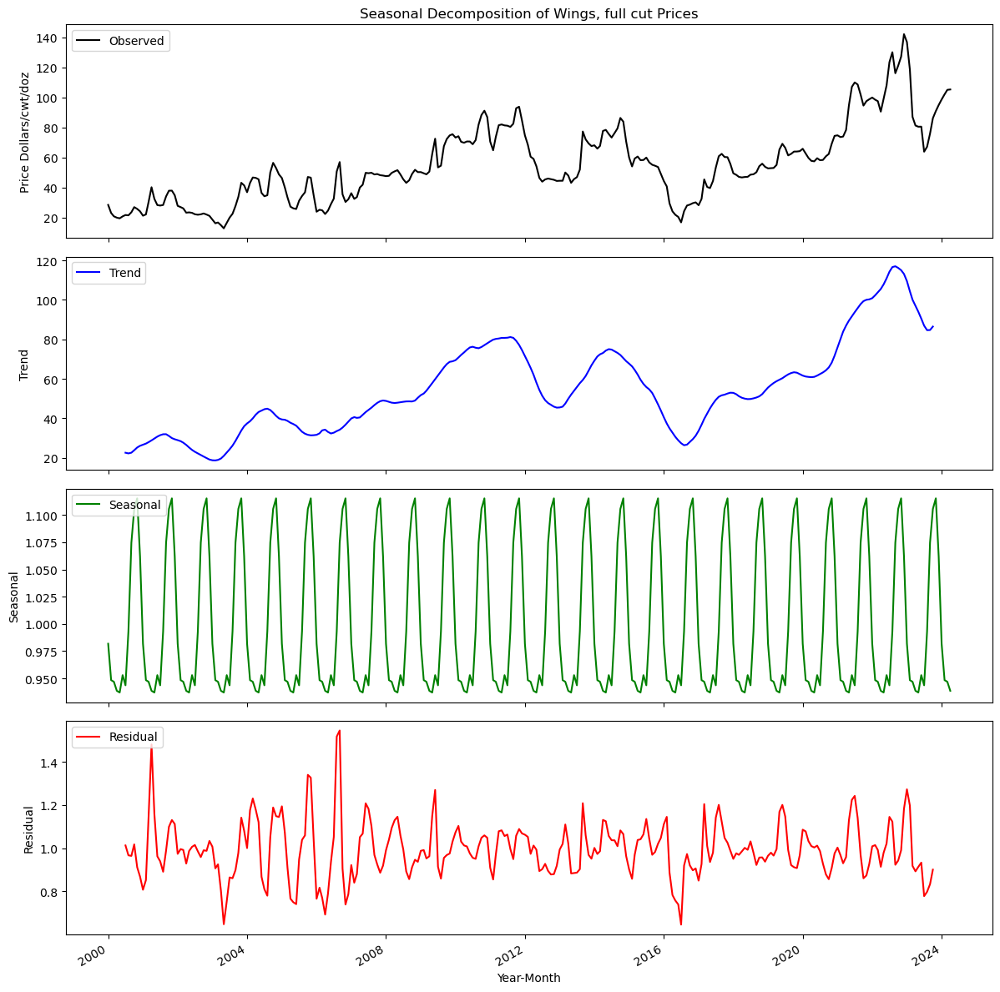

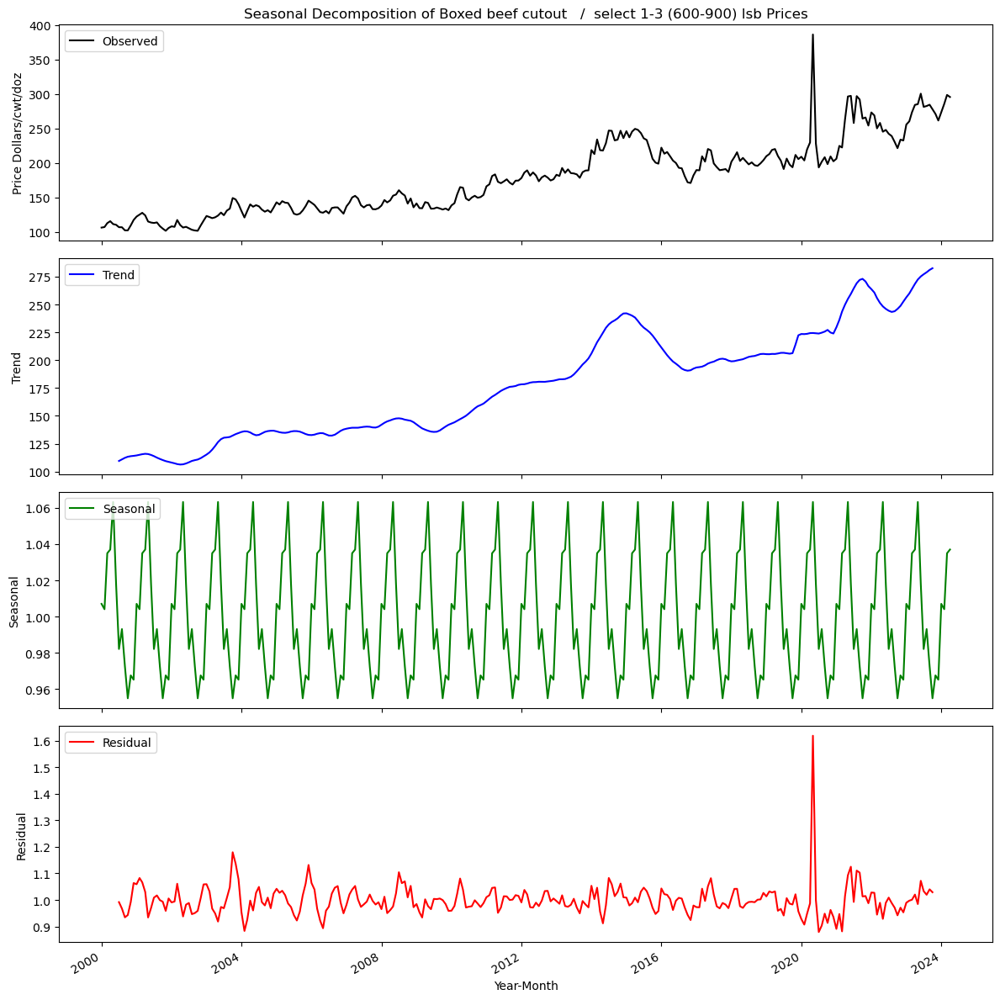

In [76]:
# Decompose the time series for each selected meat sub-type
for subtype in selected_meat_subtypes:
    subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
    
    # Ensure the index is in datetime format for better plotting
    subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')
    
    # Seasonal decomposition
    decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)
    
    # Plot the decomposed components
    fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)
    
    # Plot the observed data
    axes[0].plot(subtype_data, label='Observed', color='black')
    axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
    axes[0].legend(loc='upper left')
    axes[0].set_ylabel('Price Dollars/cwt/doz')
    fig.savefig('Seasonal_Decompostion_first 1.png', dpi=300, bbox_inches='tight')
    
    # Plot the trend component
    axes[1].plot(decomposition.trend, label='Trend', color='blue')
    axes[1].legend(loc='upper left')
    axes[1].set_ylabel('Trend')
    fig.savefig('Seasonal_Decompostion_first 2.png', dpi=300, bbox_inches='tight')
    # Plot the seasonal component
    axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
    axes[2].legend(loc='upper left')
    axes[2].set_ylabel('Seasonal')
    fig.savefig('Seasonal_Decompostion_first.png', dpi=300, bbox_inches='tight')
    
    # Plot the residual component
    axes[3].plot(decomposition.resid, label='Residual', color='red')
    axes[3].legend(loc='upper left')
    axes[3].set_ylabel('Residual')
    axes[3].set_xlabel('Year-Month')
    fig.savefig('Seasonal_Decompostion_first.png', dpi=300, bbox_inches='tight')

    # Improve x-axis date formatting
    plt.gcf().autofmt_xdate()  # Auto-format date labels
    
    plt.tight_layout()
    plt.show()

## Checking Seasonal Decompostion Plot For Each Meat Type Invidually

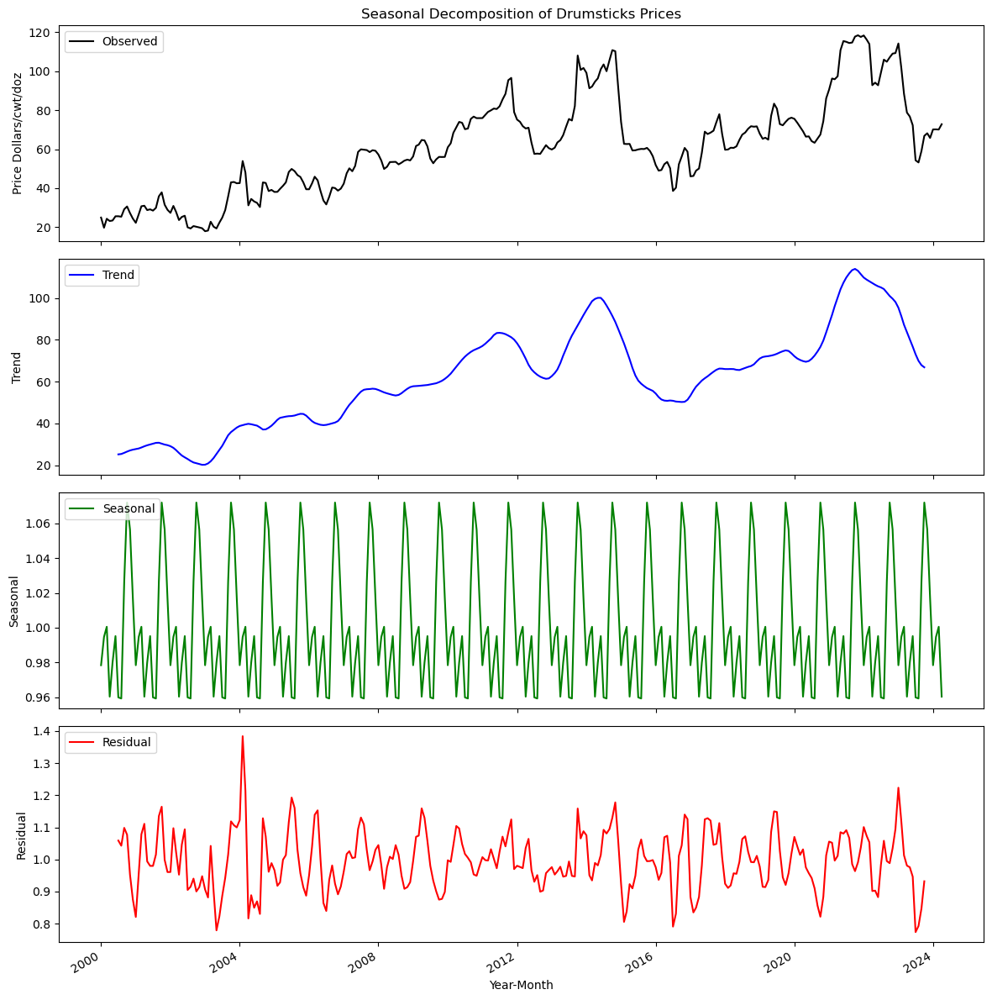

<module 'matplotlib.pyplot' from 'D:\\Bharath_Anconda\\Lib\\site-packages\\matplotlib\\pyplot.py'>

In [106]:
subtype = 'Drumsticks'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Drumsticks_1.png')
plt.show()
plt


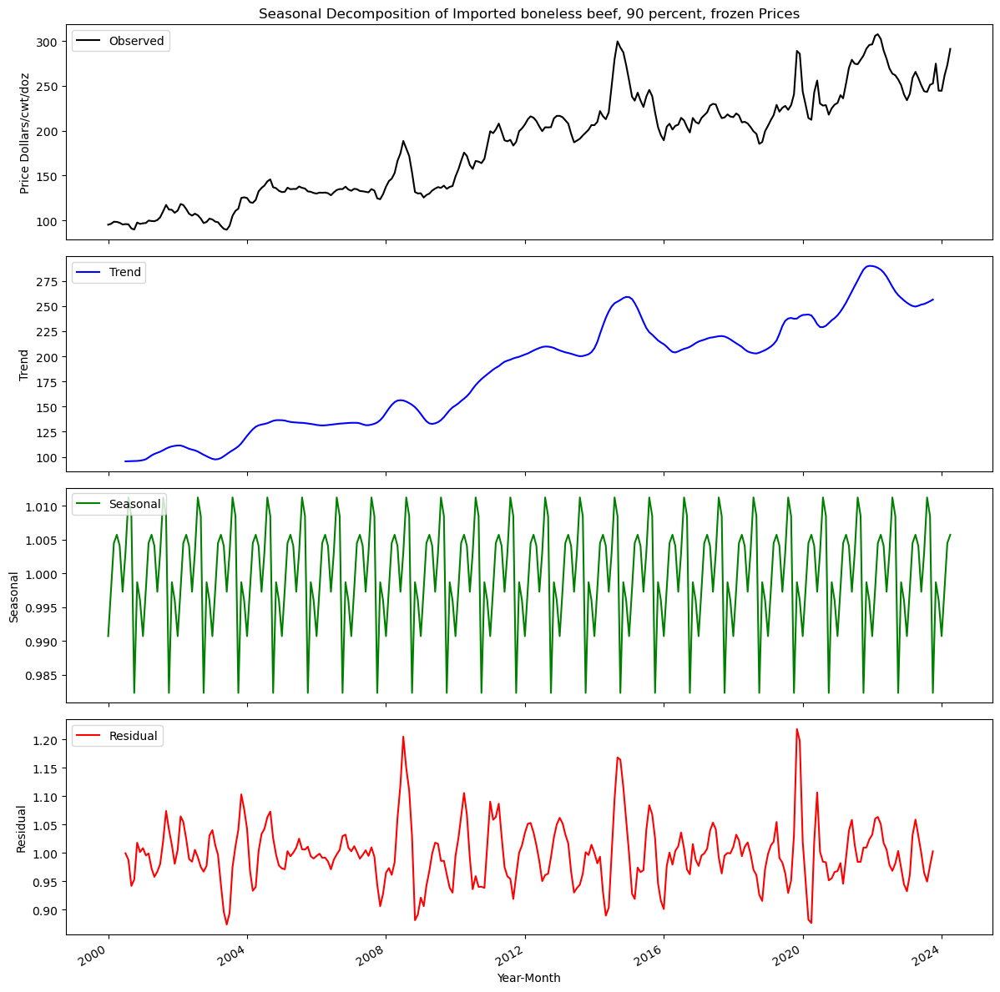

In [107]:
subtype = 'Imported boneless beef, 90 percent, frozen'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Imported_boneless_beef_90_percent_frozen_1.png')
plt.show()
plt.close(fig)


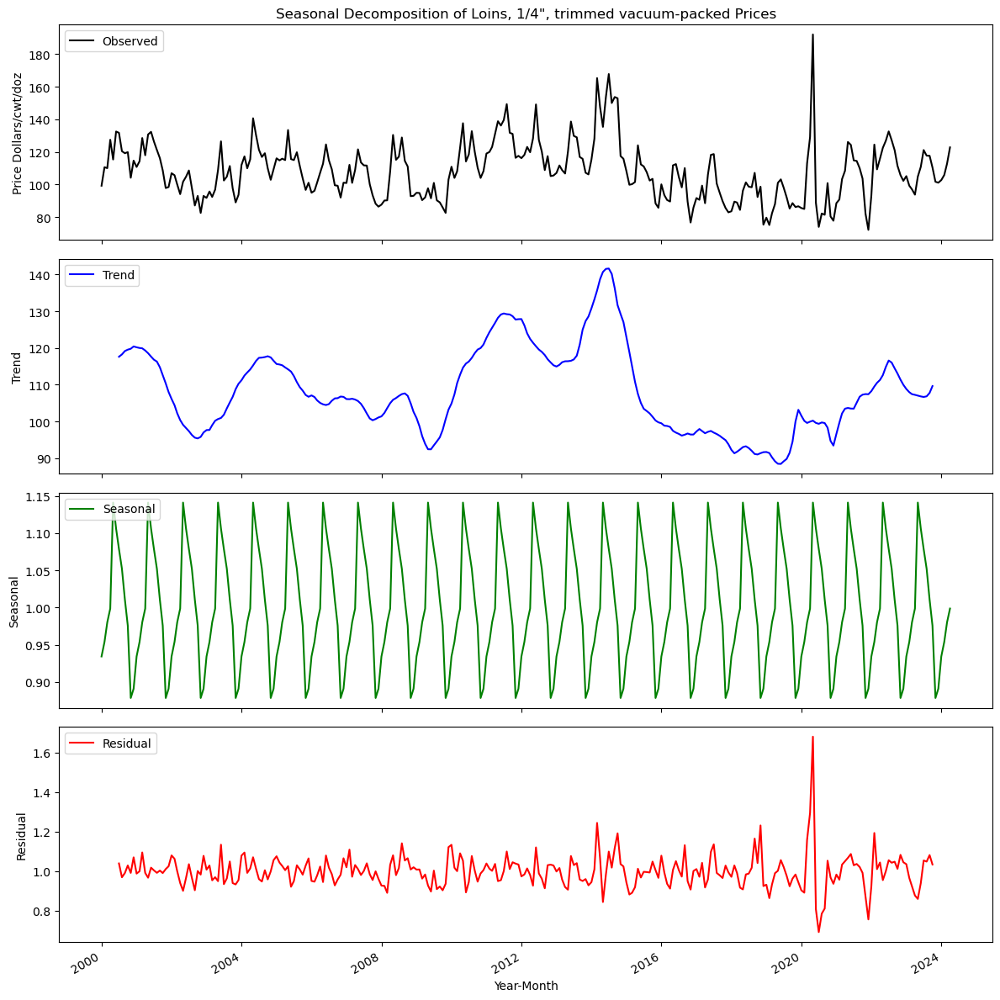

In [108]:
subtype = 'Loins, 1/4", trimmed vacuum-packed'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Loins_14_trimmed_vacuum_packed_1.png')
plt.show()
plt.close(fig)


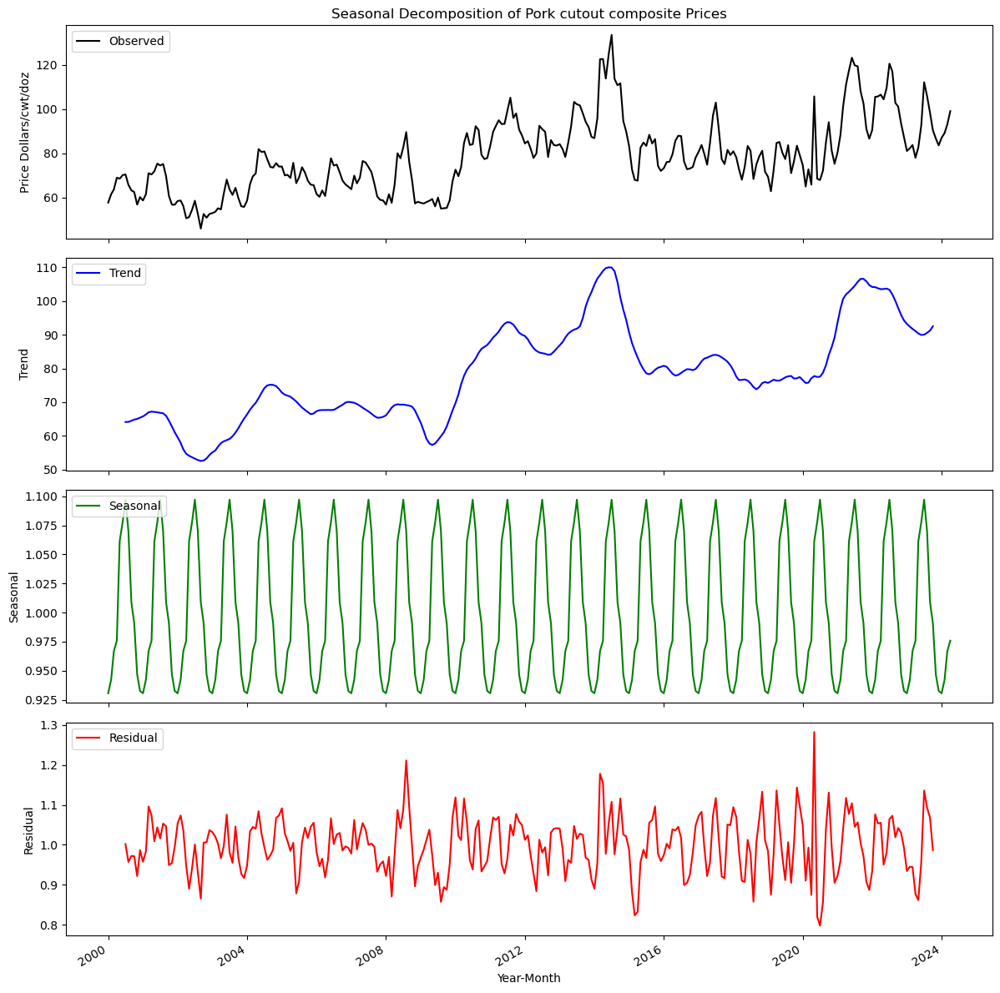

In [109]:
subtype = 'Pork cutout composite'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Pork_cutout_composite_1.png')
plt.show()
plt.close(fig)



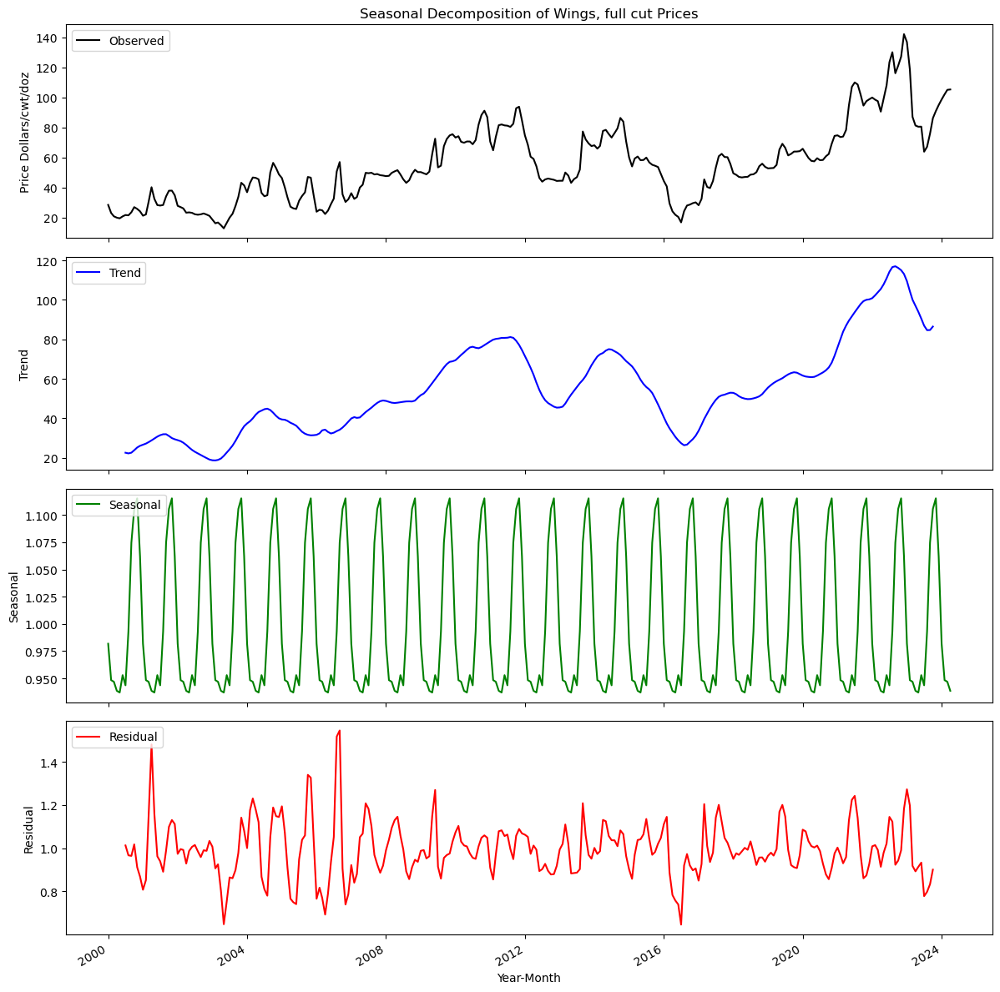

In [110]:
subtype = 'Wings, full cut'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Wings_full_cut_1.png')
plt.show()
plt.close(fig)


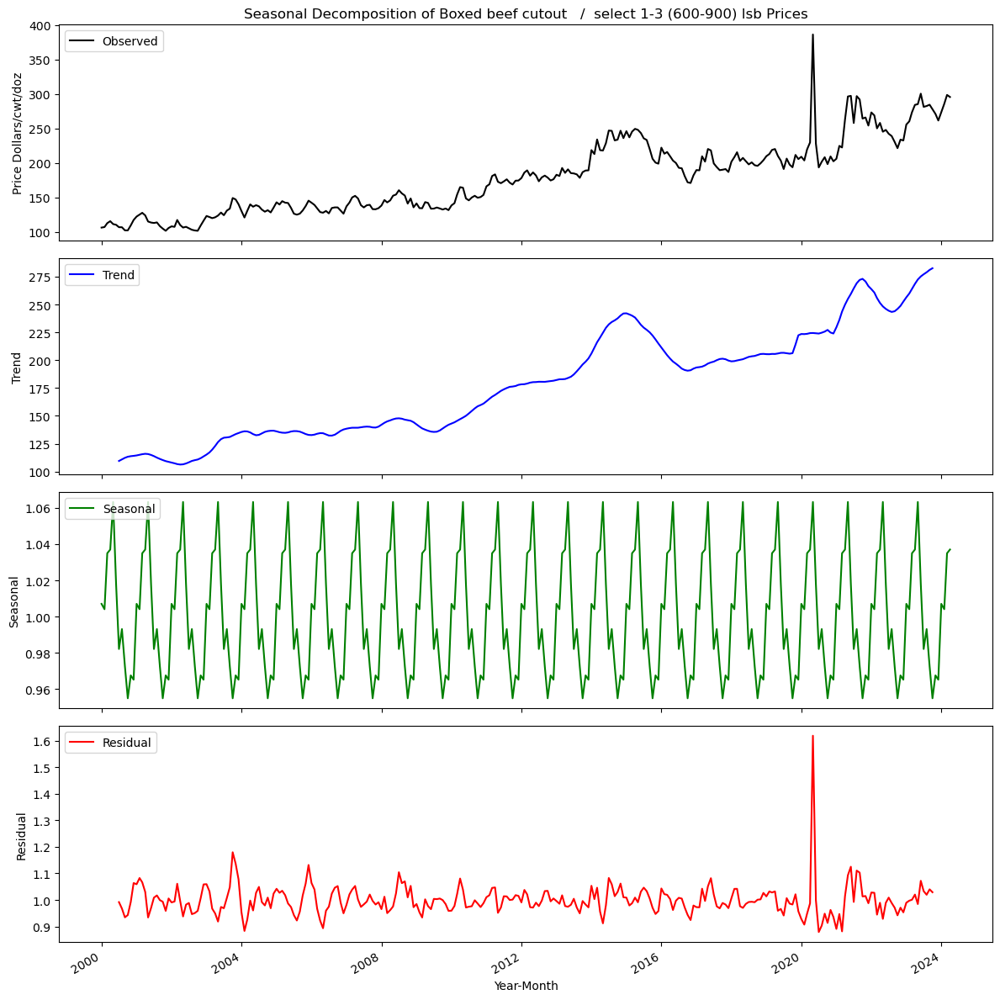

In [111]:
subtype = 'Boxed beef cutout   /  select 1-3 (600-900) lsb'
subtype_data = filtered_df[filtered_df['Meat  Sub-Type'] == subtype].set_index('YearMonth')['Price Dollars/cwt/doz']
subtype_data.index = pd.to_datetime(subtype_data.index, format='%Y-%m')

# Seasonal decomposition
decomposition = sm.tsa.seasonal_decompose(subtype_data, model='multiplicative', period=12)

# Plot and save
fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12), sharex=True)

axes[0].plot(subtype_data, label='Observed', color='black')
axes[0].set_title(f'Seasonal Decomposition of {subtype} Prices')
axes[0].legend(loc='upper left')
axes[0].set_ylabel('Price Dollars/cwt/doz')

axes[1].plot(decomposition.trend, label='Trend', color='blue')
axes[1].legend(loc='upper left')
axes[1].set_ylabel('Trend')

axes[2].plot(decomposition.seasonal, label='Seasonal', color='green')
axes[2].legend(loc='upper left')
axes[2].set_ylabel('Seasonal')

axes[3].plot(decomposition.resid, label='Residual', color='red')
axes[3].legend(loc='upper left')
axes[3].set_ylabel('Residual')
axes[3].set_xlabel('Year-Month')

plt.gcf().autofmt_xdate()
plt.tight_layout()

fig.savefig('Seasonal_Decomposition_Boxed_beef_cutout_select_1.png')
plt.show()
plt.close(fig)



# Importing All The External Factors That Influenced The Meat Sub-Type

In [87]:
# Load weather data
weather_data = pd.read_csv('US Weather Data.csv')
weather_data['DATE'] = pd.to_datetime(weather_data['DATE'], format='%d-%m-%Y')
weather_data['YEAR'] = weather_data['DATE'].dt.year
weather_data['MONTH'] = weather_data['DATE'].dt.month
weather_data['TAVG'] = (weather_data['TMAX'] + weather_data['TMIN']) / 2
weather_data['RESAMPLE_DATE'] = weather_data['DATE'].dt.to_period('M').dt.to_timestamp()
monthly_weather = weather_data.set_index('RESAMPLE_DATE').resample('M').agg({
    'PRCP': 'mean',
    'SNOW': 'mean',
    'TMAX': 'max',
    'TMIN': 'min',
    'TAVG': 'mean'
})
monthly_weather.reset_index(inplace=True)
monthly_weather['Year'] = monthly_weather['RESAMPLE_DATE'].dt.year
monthly_weather['Month'] = monthly_weather['RESAMPLE_DATE'].dt.month
monthly_weather['YearMonth'] = monthly_weather['Year'].astype(str) + '-' + monthly_weather['Month'].astype(str).str.zfill(2)
print(monthly_weather.head())
print(monthly_weather.shape)

  RESAMPLE_DATE      PRCP      SNOW  TMAX  TMIN       TAVG  Year  Month  \
0    2000-01-31  0.143600  0.133333  70.0   4.0  29.566667  2000      1   
1    2000-02-29  0.278621  0.000000  74.0  15.0  41.327586  2000      2   
2    2000-03-31  0.074516  0.000000  78.0  20.0  46.839286  2000      3   
3    2000-04-30  0.074286  0.000000  77.0  28.0  52.326923  2000      4   
4    2000-05-31  0.103333  0.000000  89.0  42.0  67.293103  2000      5   

  YearMonth  
0   2000-01  
1   2000-02  
2   2000-03  
3   2000-04  
4   2000-05  
(295, 9)


In [88]:
# Load disaster data
disaster_df = pd.read_csv('DisasterDeclarationsSummaries.csv', usecols=[
    'declarationDate', 'incidentType', 'incidentBeginDate', 'incidentEndDate'
])
disaster_df['declarationDate'] = pd.to_datetime(disaster_df['declarationDate'], format='%d-%m-%Y')
disaster_df['incidentBeginDate'] = pd.to_datetime(disaster_df['incidentBeginDate'], format='%d-%m-%Y')
disaster_df['incidentEndDate'] = pd.to_datetime(disaster_df['incidentEndDate'], format='%d-%m-%Y')
disaster_df = disaster_df[(disaster_df['declarationDate'] >= '2000-01-01') & (disaster_df['declarationDate'] <= '2024-12-31')]
disaster_df['Month'] = disaster_df['declarationDate'].dt.to_period('M')
disaster_features = disaster_df.groupby('Month').agg({
    'incidentType': 'count',
    'incidentBeginDate': 'min',
    'incidentEndDate': 'max'
}).reset_index()
disaster_features.columns = ['Month', 'DisasterCount', 'DisasterStartDate', 'DisasterEndDate']
disaster_features['Year'] = disaster_features['Month'].dt.year
disaster_features['Month'] = disaster_features['Month'].dt.month
disaster_features['YearMonth'] = disaster_features['Year'].astype(str) + '-' + disaster_features['Month'].astype(str).str.zfill(2)
print(disaster_features.head())
print(disaster_features.shape)

   Month  DisasterCount DisasterStartDate DisasterEndDate  Year YearMonth
0      1            137        1999-08-06      2000-02-01  2000   2000-01
1      2            183        1999-12-21      2000-03-02  2000   2000-02
2      3             11        2000-02-18      2000-03-23  2000   2000-03
3      4             28        2000-01-25      2000-04-30  2000   2000-04
4      5             93        2000-04-18      2000-07-31  2000   2000-05
(291, 6)


In [89]:
# Load inflation rate data
inflation_df = pd.read_csv('Inflation Rate.csv')
inflation_df=inflation_df[inflation_df['Period']!='S01']
inflation_df=inflation_df[inflation_df['Period']!='S02']
inflation_df['Date'] = pd.to_datetime(inflation_df['Year'].astype(str) + inflation_df['Period'].str[1:].str.zfill(2), format='%Y%m')
inflation_df['Year'] = inflation_df['Date'].dt.year
inflation_df['Month'] = inflation_df['Date'].dt.month

inflation_df = inflation_df.rename(columns={'Value': 'CPI'})
inflation_df['YearMonth'] = inflation_df['Year'].astype(str) + '-' + inflation_df['Month'].astype(str).str.zfill(2)
print(inflation_df.head(20))
print(inflation_df.shape)

      Series ID  Year Period    CPI       Date  Month YearMonth
0   CUUR0000SA0  2000    M01  168.8 2000-01-01      1   2000-01
1   CUUR0000SA0  2000    M02  169.8 2000-02-01      2   2000-02
2   CUUR0000SA0  2000    M03  171.2 2000-03-01      3   2000-03
3   CUUR0000SA0  2000    M04  171.3 2000-04-01      4   2000-04
4   CUUR0000SA0  2000    M05  171.5 2000-05-01      5   2000-05
5   CUUR0000SA0  2000    M06  172.4 2000-06-01      6   2000-06
6   CUUR0000SA0  2000    M07  172.8 2000-07-01      7   2000-07
7   CUUR0000SA0  2000    M08  172.8 2000-08-01      8   2000-08
8   CUUR0000SA0  2000    M09  173.7 2000-09-01      9   2000-09
9   CUUR0000SA0  2000    M10  174.0 2000-10-01     10   2000-10
10  CUUR0000SA0  2000    M11  174.1 2000-11-01     11   2000-11
11  CUUR0000SA0  2000    M12  174.0 2000-12-01     12   2000-12
14  CUUR0000SA0  2001    M01  175.1 2001-01-01      1   2001-01
15  CUUR0000SA0  2001    M02  175.8 2001-02-01      2   2001-02
16  CUUR0000SA0  2001    M03  176.2 2001

In [90]:
# Load unemployment rate data
Unemployment_df = pd.read_csv('Unemployment Rate.csv')
Unemployment_df=Unemployment_df[Unemployment_df['Period']!='S01']
Unemployment_df=Unemployment_df[Unemployment_df['Period']!='S02']
Unemployment_df['Date'] = pd.to_datetime(Unemployment_df['Year'].astype(str) + Unemployment_df['Period'].str[1:].str.zfill(2), format='%Y%m')
Unemployment_df['Year'] = Unemployment_df['Date'].dt.year
Unemployment_df['Month'] = Unemployment_df['Date'].dt.month
Unemployment_df = Unemployment_df.rename(columns={'Value': 'Unemployment Rate'})
Unemployment_df['YearMonth'] = Unemployment_df['Year'].astype(str) + '-' + Unemployment_df['Month'].astype(str).str.zfill(2)
print(Unemployment_df.head())
print(Unemployment_df.shape)

     Series ID  Year Period  Unemployment Rate       Date  Month YearMonth
0  LNS14000000  2000    M01                4.0 2000-01-01      1   2000-01
1  LNS14000000  2000    M02                4.1 2000-02-01      2   2000-02
2  LNS14000000  2000    M03                4.0 2000-03-01      3   2000-03
3  LNS14000000  2000    M04                3.8 2000-04-01      4   2000-04
4  LNS14000000  2000    M05                4.0 2000-05-01      5   2000-05
(294, 7)


In [91]:
# Load GDP data
GDP_df =  pd.read_excel(r"C:\Users\Bharath\OneDrive\Desktop\Disseration\External Feature Dataset\GDP US.xlsx")
GDP_df['Date'] = pd.to_datetime(GDP_df['Date'])  # Ensure Date column is in datetime format
GDP_df['Year'] = GDP_df['Date'].dt.year
GDP_df['Month'] = GDP_df['Date'].dt.month
GDP_df = GDP_df.rename(columns={'Monthly Real GDP Index': 'GDP Value'})
GDP_df['YearMonth'] = GDP_df['Year'].astype(str) + '-' + GDP_df['Month'].astype(str).str.zfill(2)
print(GDP_df.head())
print(GDP_df.shape)

        Date     GDP Value  Year  Month YearMonth
0 2000-01-01  13812.379328  2000      1   2000-01
1 2000-02-01  13871.521334  2000      2   2000-02
2 2000-03-01  13951.023825  2000      3   2000-03
3 2000-04-01  14133.222640  2000      4   2000-04
4 2000-05-01  14113.438997  2000      5   2000-05
(293, 5)


In [92]:
# Load Corn Price Data
Corn_Price =  pd.read_excel(r"C:\Users\Bharath\OneDrive\Desktop\Disseration\External Feature Dataset\feed price us....xlsx")
month_map = {
    'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04',
    'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08',
    'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'
}

Corn_Price['Month'] = Corn_Price['Month'].replace(month_map)
Corn_Price['YearMonth'] = Corn_Price['Year'].astype(str) + '-' + Corn_Price['Month']
Corn_Price = Corn_Price.rename(columns={'Price': 'Corn Price'})
final_df = Corn_Price[['Year', 'Month', 'YearMonth', 'Corn Price']]
final_df = final_df.sort_values(['Year', 'Month'])
# Display the first few rows
print(final_df.head())
print(final_df.shape)

   Year Month YearMonth  Corn Price
0  2000    01   2000-01        1.91
1  2000    02   2000-02        1.98
2  2000    03   2000-03        2.03
3  2000    04   2000-04        2.03
4  2000    05   2000-05        2.11
(292, 4)


In [93]:
# Load the Sorghum_Price data

Sorghum_Price =  pd.read_excel(r"C:\Users\Bharath\OneDrive\Desktop\Disseration\External Feature Dataset\Sorghum Feed Grains.xlsx")
month_map = {
    'Jan': '01', 'Feb': '02', 'Mar': '03', 'Apr': '04',
    'May': '05', 'Jun': '06', 'Jul': '07', 'Aug': '08',
    'Sep': '09', 'Oct': '10', 'Nov': '11', 'Dec': '12'
}

Sorghum_Price['Month'] = Sorghum_Price['Month'].replace(month_map)
Sorghum_Price['YearMonth'] = Sorghum_Price['Year'].astype(str) + '-' + Sorghum_Price['Month']
Sorghum_Price = Sorghum_Price.rename(columns={'Price': 'Sorghum Price'})
Sorghum_Price_Finial = Sorghum_Price[['Year', 'Month', 'YearMonth', 'Sorghum Price']]
Sorghum_Price_Finial = Sorghum_Price_Finial.sort_values(['Year', 'Month'])

# Display the first few rows
print(Sorghum_Price_Finial.head())
print(Sorghum_Price_Finial.shape)

   Year Month YearMonth  Sorghum Price
0  2000    01   2000-01           1.60
1  2000    02   2000-02           1.71
2  2000    03   2000-03           1.80
3  2000    04   2000-04           1.81
4  2000    05   2000-05           1.86
(292, 4)


# Merging All The Dataset To Wholesale Meat Dataset

In [94]:
# Merge all datasets on 'YearMonth'
merged_data = pd.merge(meat_data, monthly_weather[[ 'YearMonth','PRCP', 'SNOW', 'TAVG',]], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, disaster_features[[ 'YearMonth','DisasterCount']], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, inflation_df[['YearMonth', 'CPI']], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, Unemployment_df[['YearMonth', 'Unemployment Rate']], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, GDP_df[['YearMonth', 'GDP Value']], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, final_df[['YearMonth', 'Corn Price']], on='YearMonth', how='left')
merged_data = pd.merge(merged_data, Sorghum_Price_Finial[['YearMonth', 'Sorghum Price']], on='YearMonth', how='left')
merged_data.head(100)

,Meat Type,Meat Sub-Type,Price Dollars/cwt/doz,Year,Month,YearMonth,PRCP,SNOW,TAVG,DisasterCount,CPI,Unemployment Rate,GDP Value,Corn Price,Sorghum Price
0,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,114.74,2000,1,2000-01,0.143600,0.133333,29.566667,137.0,168.800,4.0,13812.379328,1.91,1.60
1,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,112.59,2000,2,2000-02,0.278621,0.000000,41.327586,183.0,169.800,4.1,13871.521334,1.98,1.71
2,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,118.42,2000,3,2000-03,0.074516,0.000000,46.839286,11.0,171.200,4.0,13951.023825,2.03,1.80
3,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,123.45,2000,4,2000-04,0.074286,0.000000,52.326923,28.0,171.300,3.8,14133.222640,2.03,1.81
4,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,124.88,2000,5,2000-05,0.103333,0.000000,67.293103,93.0,171.500,4.0,14113.438997,2.11,1.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,148.25,2007,12,2007-12,0.265161,0.096774,36.064516,389.0,210.036,5.0,16970.447290,3.77,3.88
96,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,146.41,2008,1,2008-01,NaN,NaN,NaN,60.0,211.080,5.0,16990.492230,3.98,4.14
97,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,149.63,2008,2,2008-02,0.189310,0.103448,31.551724,133.0,211.693,4.9,16753.953650,4.54,4.68
98,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,144.42,2008,3,2008-03,0.442581,0.096774,42.516129,416.0,213.528,5.1,16786.533476,4.70,5.06


In [17]:
#Checking the shape of Merged dataset
print(merged_data.shape)

(8176, 15)


In [95]:
#Dataset descriptions
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8176 entries, 0 to 8175
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Meat Type              8176 non-null   object 
 1   Meat  Sub-Type         8176 non-null   object 
 2   Price Dollars/cwt/doz  8176 non-null   float64
 3   Year                   8176 non-null   int32  
 4   Month                  8176 non-null   int32  
 5   YearMonth              8176 non-null   object 
 6   PRCP                   7700 non-null   float64
 7   SNOW                   4508 non-null   float64
 8   TAVG                   7700 non-null   float64
 9   DisasterCount          8064 non-null   float64
 10  CPI                    8176 non-null   float64
 11  Unemployment Rate      8176 non-null   float64
 12  GDP Value              8176 non-null   float64
 13  Corn Price             8176 non-null   float64
 14  Sorghum Price          8176 non-null   float64
dtypes: f

In [96]:
#Checking Duplicates in Merged dataset
merged_data.duplicated().sum()

0

In [97]:
#Checking Null Values in Merged dataset
merged_data.isnull().sum()

Meat Type                   0
Meat  Sub-Type              0
Price Dollars/cwt/doz       0
Year                        0
Month                       0
YearMonth                   0
PRCP                      476
SNOW                     3668
TAVG                      476
DisasterCount             112
CPI                         0
Unemployment Rate           0
GDP Value                   0
Corn Price                  0
Sorghum Price               0
dtype: int64

In [98]:
# Filling all the NAN values
merged_data['PRCP'].fillna(method='ffill', inplace=True)
merged_data['SNOW'].fillna(method='ffill', inplace=True)
merged_data['TAVG'].fillna(method='ffill', inplace=True)
# Fill missing DisasterCount values with zero
merged_data['DisasterCount'] = merged_data['DisasterCount'].fillna(0)

In [99]:
#Again Checking Null Values in Merged dataset
merged_data.isnull().sum()

Meat Type                0
Meat  Sub-Type           0
Price Dollars/cwt/doz    0
Year                     0
Month                    0
YearMonth                0
PRCP                     0
SNOW                     0
TAVG                     0
DisasterCount            0
CPI                      0
Unemployment Rate        0
GDP Value                0
Corn Price               0
Sorghum Price            0
dtype: int64

In [ ]:
merged_data.to_csv('merged_data.csv', index=False)

In [21]:
merged_data.to_excel('merged_data.xlsx', index=False)

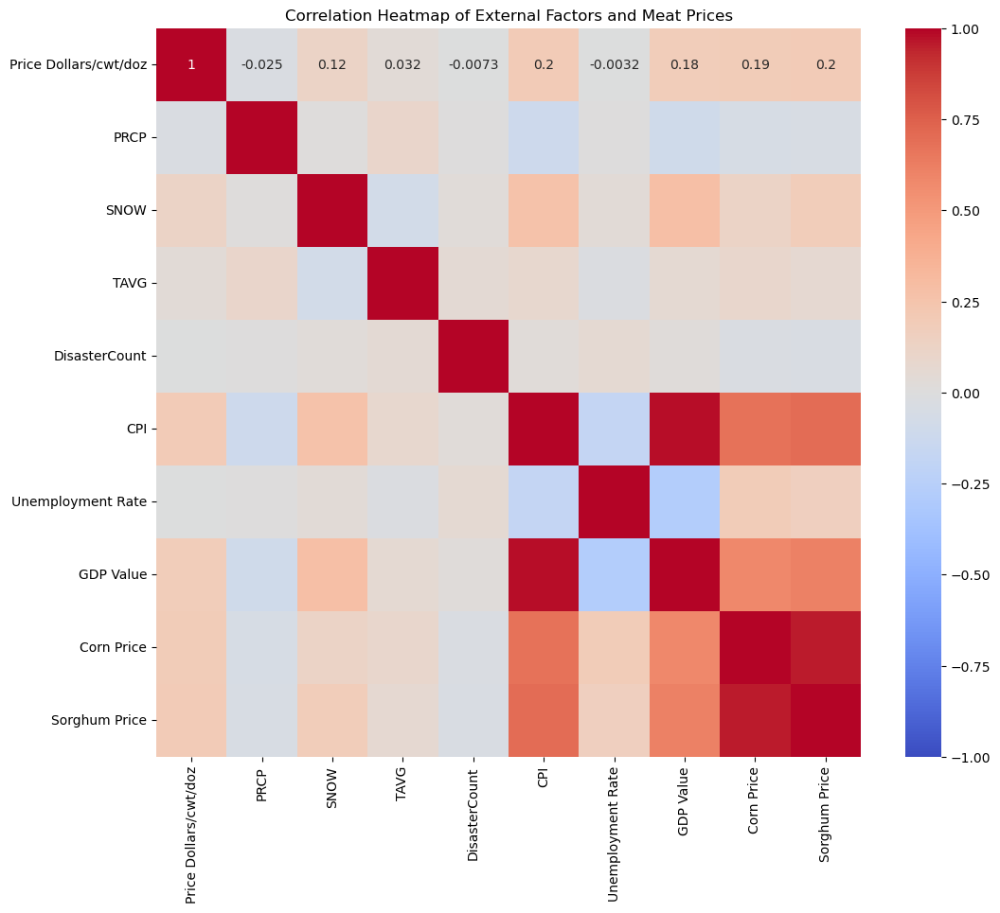

In [112]:
# correlation matrix
corr_matrix = merged_data[['Price Dollars/cwt/doz'] + external_factors].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title('Correlation Heatmap of External Factors and Meat Prices')
plt.show()


In [146]:
# Compute correlation matrix
correlation_matrix = merged_data[['Price Dollars/cwt/doz'] + external_features].corr()

# Extract relevant correlations
correlation_table = correlation_matrix[['Price Dollars/cwt/doz']].drop('Price Dollars/cwt/doz')
correlation_table.columns = ['Correlation with Meat Price']

# Display table
print(correlation_table)


                   Correlation with Meat Price
PRCP                                 -0.025299
SNOW                                  0.117349
TAVG                                  0.032022
DisasterCount                        -0.007289
CPI                                   0.197597
Unemployment Rate                    -0.003220
GDP Value                             0.181384
Corn Price                            0.194342
Sorghum Price                         0.197497


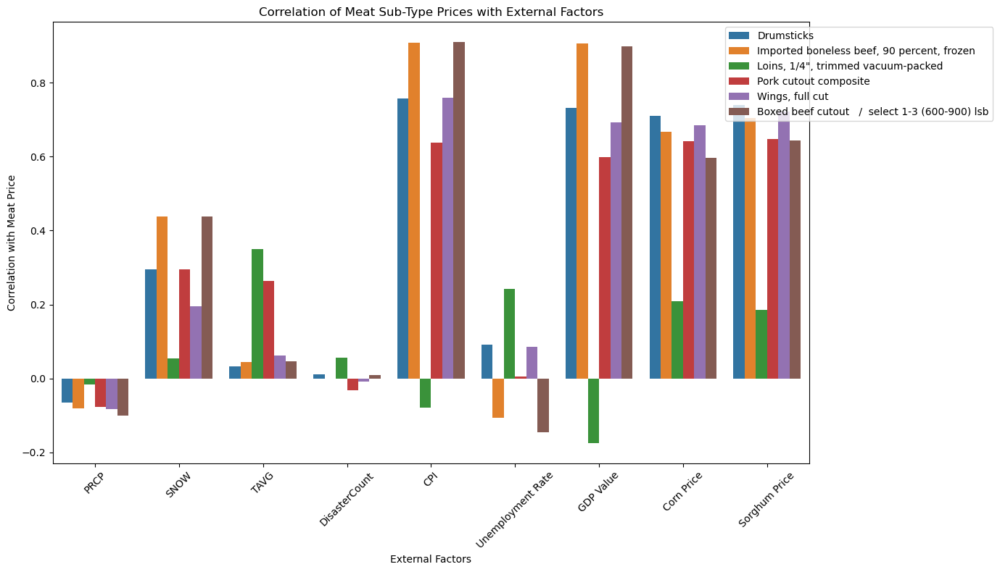

In [79]:
# checking correlation plot using each meat type with external feature with bar plot
meat_subtypes = [
    'Drumsticks', 
    'Imported boneless beef, 90 percent, frozen',
    'Loins, 1/4", trimmed vacuum-packed', 
    'Pork cutout composite', 
    'Wings, full cut',
    'Boxed beef cutout   /  select 1-3 (600-900) lsb'
]

# List of external factors
external_factors = ['PRCP', 'SNOW', 'TAVG', 'DisasterCount', 'CPI', 'Unemployment Rate', 'GDP Value', 'Corn Price', 'Sorghum Price']

# Initialize an empty list to store correlation data
correlation_data = []

# Calculate the correlation for each meat sub-type with each external factor
for meat in meat_subtypes:
    filtered_df = merged_data[merged_data['Meat  Sub-Type'] == meat]
    for factor in external_factors:
        correlation = filtered_df['Price Dollars/cwt/doz'].corr(filtered_df[factor])
        correlation_data.append({'Meat Sub-Type': meat, 'External Factor': factor, 'Correlation': correlation})

# Convert the list of dictionaries to a DataFrame
correlation_df = pd.DataFrame(correlation_data)

# Create a bar plot to show the correlations
plt.figure(figsize=(14, 8))
sns.barplot(data=correlation_df, x='External Factor', y='Correlation', hue='Meat Sub-Type')
plt.title('Correlation of Meat Sub-Type Prices with External Factors')
plt.xlabel('External Factors')
plt.ylabel('Correlation with Meat Price')
plt.xticks(rotation=45)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1))
plt.tight_layout()
plt.show()


In [100]:
#Checking the correlation plot for each meat types through loop 
meat_cuts = [
    'Drumsticks', 
    'Imported boneless beef, 90 percent, frozen',
    'Loins, 1/4", trimmed vacuum-packed', 
    'Pork cutout composite', 
    'Wings, full cut',
    'Boxed beef cutout   /  select 1-3 (600-900) lsb']
external_factors = ['PRCP', 'SNOW', 'TAVG', 'DisasterCount', 'CPI', 'Unemployment Rate', 'GDP Value', 'Corn Price', 'Sorghum Price']

# Initialize an empty list to store the results
correlation_results = []

# Loop through each meat cut
for meat in meat_cuts:
    meat_df = merged_data[merged_data['Meat  Sub-Type'] == meat]  # Filter data for the specific meat cut
    
    # Calculate correlation for each external factor
    correlations = {}
    for factor in external_factors:
        correlation = meat_df['Price Dollars/cwt/doz'].corr(meat_df[factor])
        correlations[factor] = correlation
    
    # Find the top correlated factor
    top_factor = max(correlations, key=correlations.get)
    top_correlation = correlations[top_factor]
    
    # Store the results
    correlation_results.append([meat, top_factor, top_correlation])

# Convert the results into a DataFrame
summary_table = pd.DataFrame(correlation_results, columns=['Meat Cut', 'Top Correlated External Factor', 'Correlation Coefficient'])
print(summary_table)


                                          Meat Cut  \
0                                       Drumsticks   
1       Imported boneless beef, 90 percent, frozen   
2               Loins, 1/4", trimmed vacuum-packed   
3                            Pork cutout composite   
4                                  Wings, full cut   
5  Boxed beef cutout   /  select 1-3 (600-900) lsb   

  Top Correlated External Factor  Correlation Coefficient  
0                            CPI                 0.756604  
1                            CPI                 0.907120  
2                           TAVG                 0.350424  
3                  Sorghum Price                 0.648474  
4                            CPI                 0.759416  
5                            CPI                 0.909789  


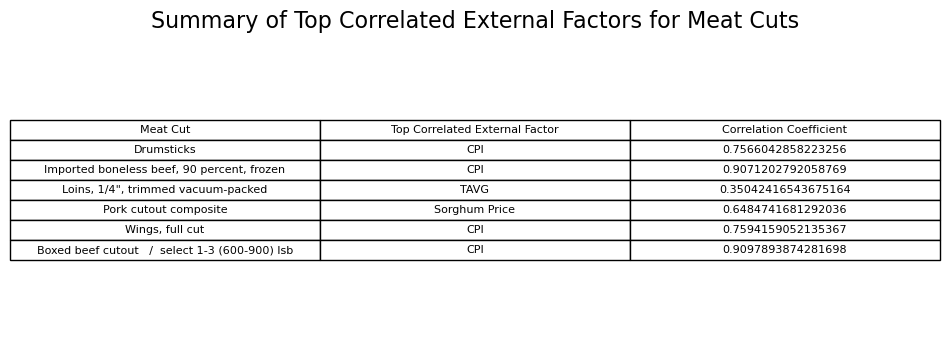

In [101]:
# Display the summary table for top corrleation using external feature
fig, ax = plt.subplots(figsize=(10, 4)) 

# Remove the axes for a clean look
ax.axis('tight')
ax.axis('off')

# Create the table
table = ax.table(cellText=summary_table.values,
                 colLabels=summary_table.columns,
                 cellLoc='center',
                 loc='center')

# Adjust the font size of the table
table.set_fontsize(14)
table.scale(1.2, 1.2)

plt.title("Summary of Top Correlated External Factors for Meat Cuts", fontsize=16)
plt.show()


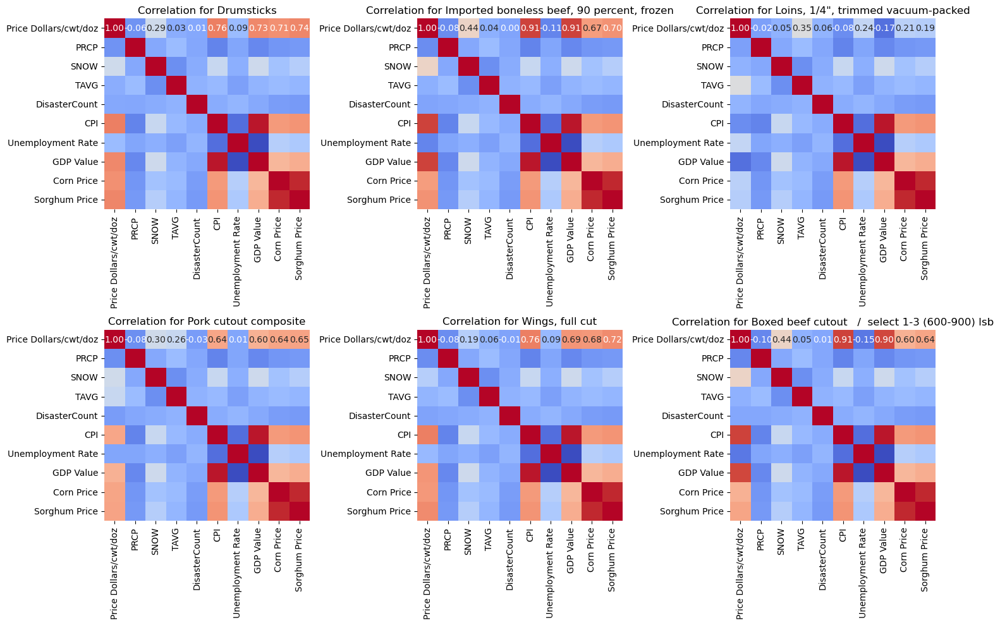

<Figure size 640x480 with 0 Axes>

In [104]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the size of the grid
n_cols = 3  # Number of columns for the facet plot
n_rows = int(len(selected_meat_subtypes) / n_cols) + (len(selected_meat_subtypes) % n_cols > 0)

# Set up the matplotlib figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 10))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Generate correlation heatmap for each selected meat sub-type
for idx, meat_subtype in enumerate(selected_meat_subtypes):
    # Filter data for the current meat sub-type
    subset = filtered_data[filtered_data['Meat  Sub-Type'] == meat_subtype]
    # Compute correlation matrix
    corr = subset[['Price Dollars/cwt/doz', 'PRCP', 'SNOW', 'TAVG', 'DisasterCount', 'CPI', 
                   'Unemployment Rate', 'GDP Value', 'Corn Price', 'Sorghum Price']].corr()
    
    # Plot the heatmap in the corresponding subplot
    sns.heatmap(corr, annot=True, cmap='coolwarm', fmt='.2f', ax=axes[idx], cbar=False)
    axes[idx].set_title(f'Correlation for {meat_subtype}')

# Hide any unused subplots
for ax in axes[len(selected_meat_subtypes):]:
    ax.axis('off')

plt.tight_layout()
plt.show()

# Save the plot as a high-resolution PNG file
plt.savefig('Correlation_Heatmaps.png', dpi=300, bbox_inches='tight')


# Model Building

### Preprocessing

In [23]:
# Taking only the meat sub type and price column
subtype_data = meat_data[meat_data['Meat  Sub-Type'] == 'Boxed beef cutout   /  select 1-3 (600-900) lsb']
price_array = subtype_data['Price Dollars/cwt/doz']
# Print the shape of the new dataframe
print(price_array.shape)

# Display the first few rows of the new dataframe
print(price_array.head())

(292,)
Period
2000-01-01    106.09
2000-02-01    106.88
2000-03-01    112.56
2000-04-01    115.40
2000-05-01    111.19
Name: Price Dollars/cwt/doz, dtype: float64


In [24]:
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Boxed beef cutout   /  choice 1-3 (600-900) lsb']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

In [25]:
#Creating seperate y_train and y_test for plotiing graph
y_train_plot = price_array[:-5]
y_test_plot = price_array[-5:]

In [26]:
#Creating unique_subtype list  
unique_subtype = meat_data['Meat  Sub-Type'].unique()

In [27]:
unique_subtype

array(['Boxed beef cutout   /  choice 1-3 (600-900) lsb',
       'Boxed beef cutout   /  select 1-3 (600-900) lsb',
       'Boneless beef, 90 percent, fresh',
       'Imported boneless beef, 90 percent, frozen',
       'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
       'Bellies, 12-14 lb, skin on', 'Hams, 23-27 lb, trimmed selected',
       'Trimmings, 72% combo', '55-65 lb, Choice', 'National composite',
       '12-city composite¹', 'Georgia dock²',
       'Northeast parts³  / Breast, boneless',
       'Northeast parts³  / Breast, ribs on',
       'Northeast parts³  /Legs, whole',
       'Northeast parts³  /Leg quarters',
       'National parts / Breast, boneless',
       'National parts / Breast, ribs on', 'National parts / Legs, whole',
       'National parts / Leg quarters', 'Hens, 8-16 lb', 'Toms, 16-24 lb',
       'Breast, 4-8 lb', 'Drumsticks', 'Wings, full cut',
       'Combined regional', 'New York'], dtype=object)

In [84]:
meat_data_External_Feature = pd.read_csv("merged_data.csv")
meat_data_External_Feature

,Period,Meat Type,Meat Sub-Type,Price Dollars/cwt/doz,Year,Month,YearMonth,PRCP,SNOW,TAVG,DisasterCount,CPI,Unemployment Rate,GDP Value,Corn Price,Sorghum Price
0,2000-01-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,114.74,2000,1,2000-01,0.143600,0.133333,29.566667,137.0,168.800,4.0,13812.379328,1.91,1.60
1,2000-02-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,112.59,2000,2,2000-02,0.278621,0.000000,41.327586,183.0,169.800,4.1,13871.521334,1.98,1.71
2,2000-03-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,118.42,2000,3,2000-03,0.074516,0.000000,46.839286,11.0,171.200,4.0,13951.023825,2.03,1.80
3,2000-04-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,123.45,2000,4,2000-04,0.074286,0.000000,52.326923,28.0,171.300,3.8,14133.222640,2.03,1.81
4,2000-05-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,124.88,2000,5,2000-05,0.103333,0.000000,67.293103,93.0,171.500,4.0,14113.438997,2.11,1.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8171,2023-12-01,"Eggs, Grade A, large",New York,204.40,2023,12,2023-12,0.072000,0.000000,41.057692,14.0,306.746,3.7,22848.178577,4.80,4.87
8172,2024-01-01,"Eggs, Grade A, large",New York,225.00,2024,1,2024-01,0.185484,0.046429,30.344828,23.0,308.417,3.7,22695.431962,4.74,4.89
8173,2024-02-01,"Eggs, Grade A, large",New York,312.75,2024,2,2024-02,0.047500,0.010345,44.740000,33.0,310.326,3.9,22840.712881,4.36,4.74
8174,2024-03-01,"Eggs, Grade A, large",New York,238.14,2024,3,2024-03,0.076333,0.000000,51.240000,24.0,312.332,3.8,22777.018991,4.36,4.74



Analyzing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb


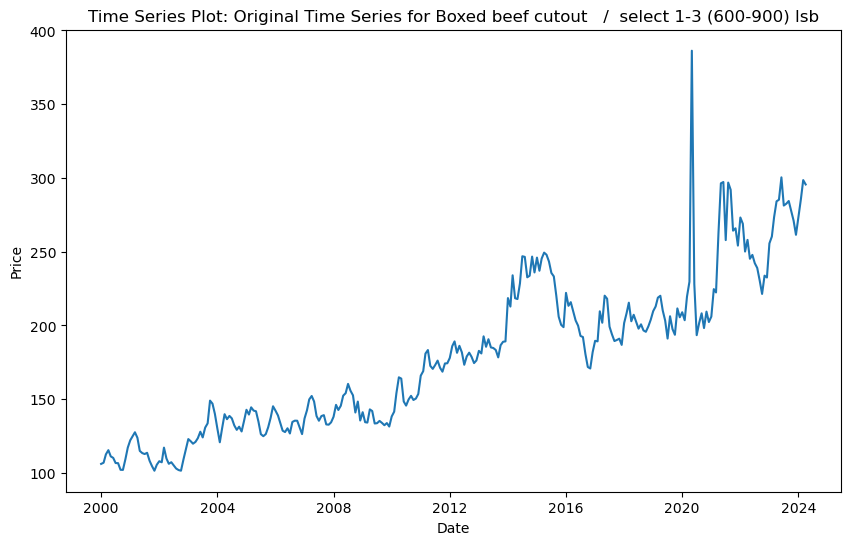

Original Series - ADF Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
ADF Statistic: -0.052024634350545926
p-value: 0.9540123227269353
Critical Values: {'1%': -3.4540935579190495, '5%': -2.8719934111688965, '10%': -2.5723401594120388}
The series is likely non-stationary
Original Series - KPSS Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
KPSS Statistic: 2.4994152704544614
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




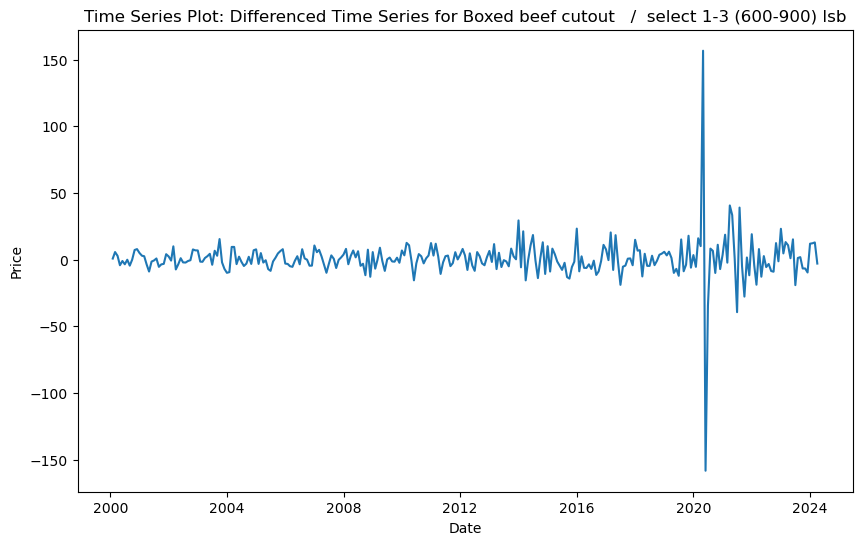

Differenced Series - ADF Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
ADF Statistic: -5.760465966220072
p-value: 5.688089115464951e-07
Critical Values: {'1%': -3.4540935579190495, '5%': -2.8719934111688965, '10%': -2.5723401594120388}
The series is likely stationary
Differenced Series - KPSS Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
KPSS Statistic: 0.0814674619456469
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




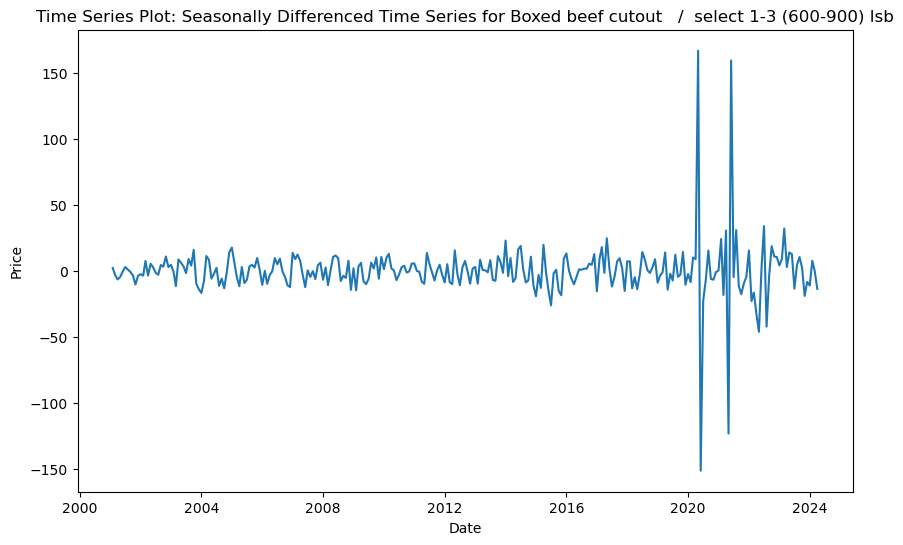

Seasonally Differenced Series - ADF Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
ADF Statistic: -7.741427634768228
p-value: 1.0593820297874954e-11
Critical Values: {'1%': -3.455365238788105, '5%': -2.8725510317187024, '10%': -2.5726375763314966}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
KPSS Statistic: 0.07722643252406591
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




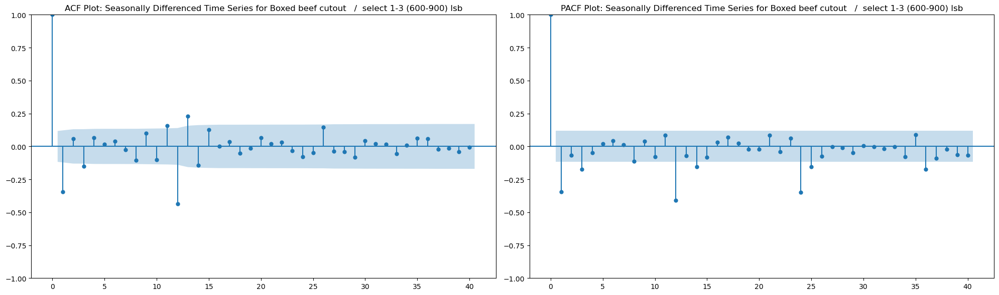

Seasonal Decomposition for Boxed beef cutout   /  select 1-3 (600-900) lsb:


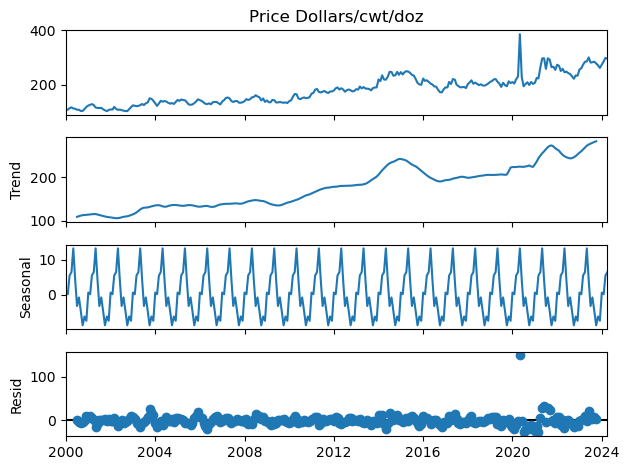


Analyzing subtype: Imported boneless beef, 90 percent, frozen


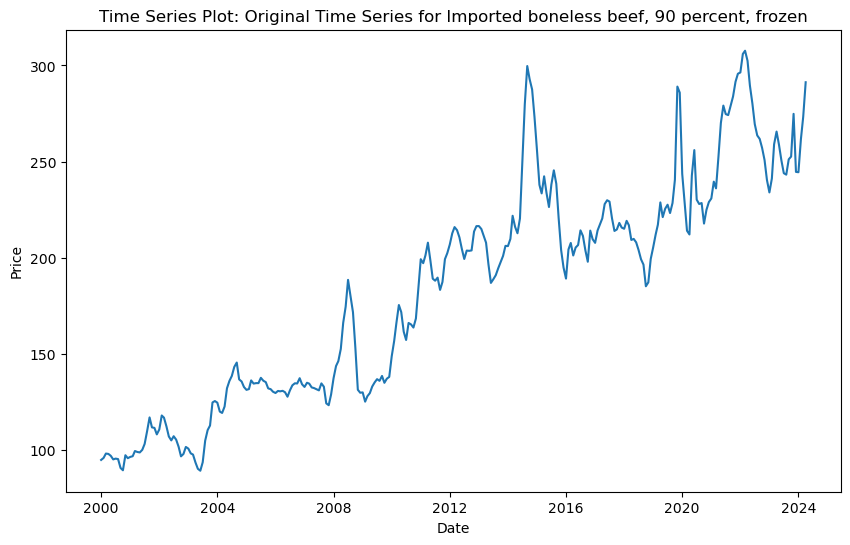

Original Series - ADF Test for Imported boneless beef, 90 percent, frozen:
ADF Statistic: -0.8568905691683729
p-value: 0.8018374213962431
Critical Values: {'1%': -3.4542672521624214, '5%': -2.87206958769775, '10%': -2.5723807881747534}
The series is likely non-stationary
Original Series - KPSS Test for Imported boneless beef, 90 percent, frozen:
KPSS Statistic: 2.517663772442862
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




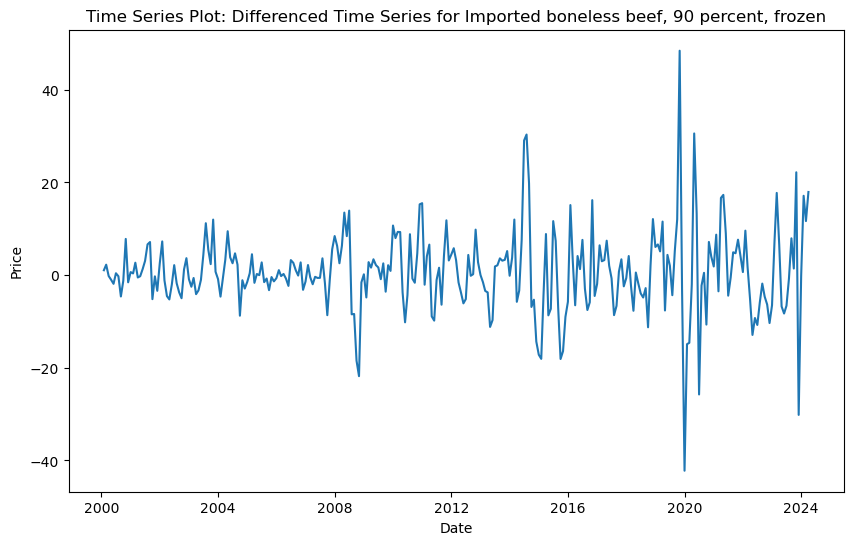

Differenced Series - ADF Test for Imported boneless beef, 90 percent, frozen:
ADF Statistic: -6.418495183707324
p-value: 1.81606721525519e-08
Critical Values: {'1%': -3.4544435065994437, '5%': -2.8721468827772774, '10%': -2.572422013959188}
The series is likely stationary
Differenced Series - KPSS Test for Imported boneless beef, 90 percent, frozen:
KPSS Statistic: 0.018555501829041296
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




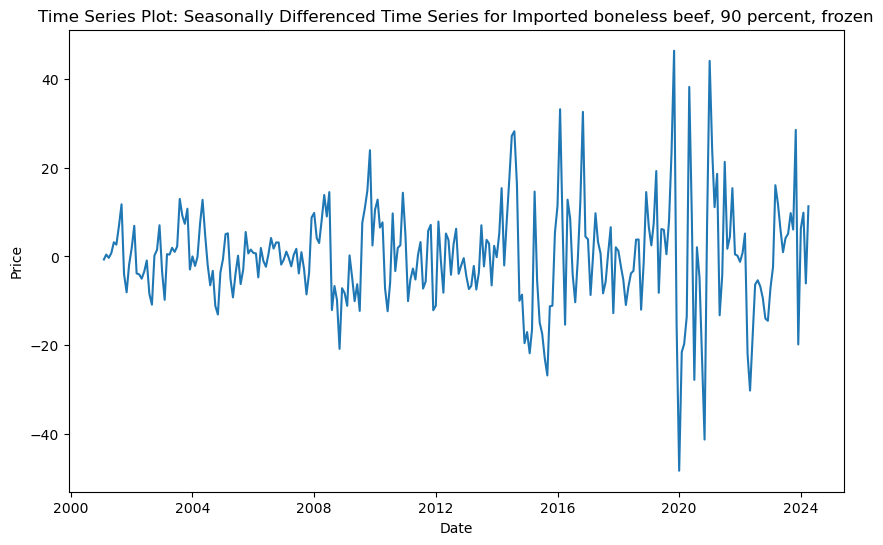

Seasonally Differenced Series - ADF Test for Imported boneless beef, 90 percent, frozen:
ADF Statistic: -7.814153167933841
p-value: 6.941880820224067e-12
Critical Values: {'1%': -3.4554613060274972, '5%': -2.8725931472675046, '10%': -2.5726600403359887}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Imported boneless beef, 90 percent, frozen:
KPSS Statistic: 0.016003072162719043
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




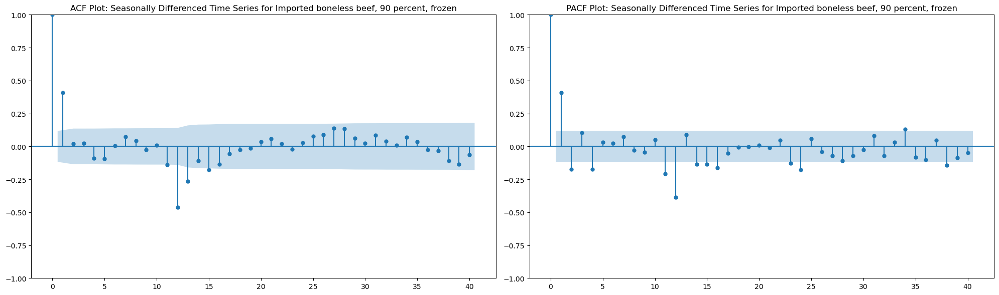

Seasonal Decomposition for Imported boneless beef, 90 percent, frozen:


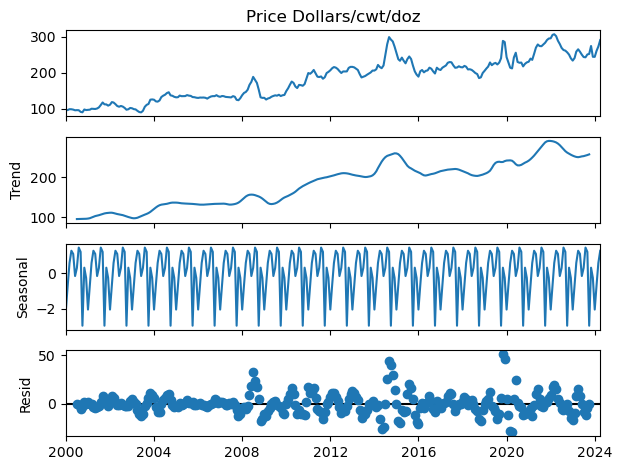


Analyzing subtype: Pork cutout composite


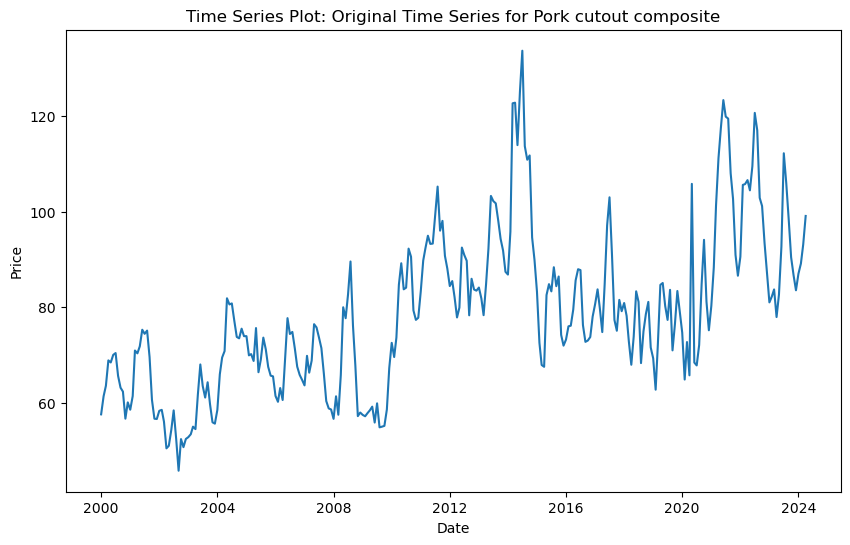

Original Series - ADF Test for Pork cutout composite:
ADF Statistic: -1.8338128508259237
p-value: 0.36380841375334017
Critical Values: {'1%': -3.4537536300652, '5%': -2.8718443180148836, '10%': -2.572260641818822}
The series is likely non-stationary
Original Series - KPSS Test for Pork cutout composite:
KPSS Statistic: 1.4869339363405076
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




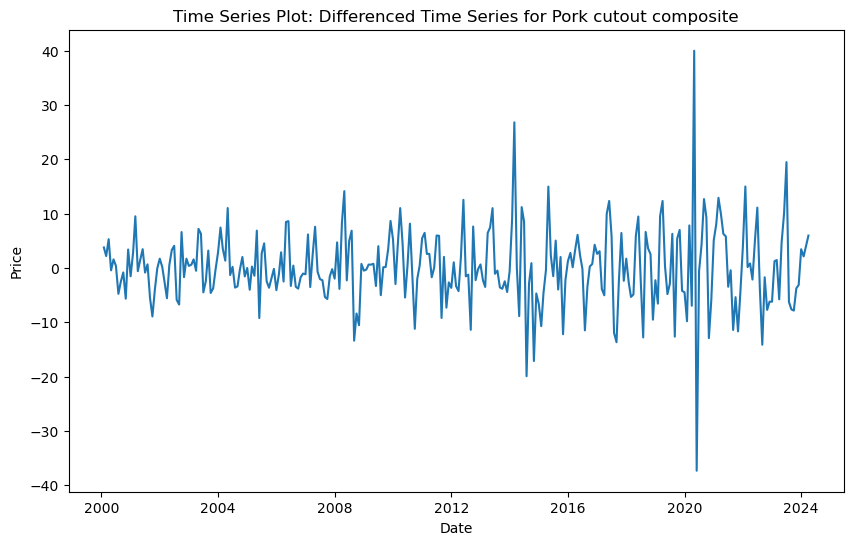

Differenced Series - ADF Test for Pork cutout composite:
ADF Statistic: -8.998314945670478
p-value: 6.601696067784447e-15
Critical Values: {'1%': -3.4537536300652, '5%': -2.8718443180148836, '10%': -2.572260641818822}
The series is likely stationary
Differenced Series - KPSS Test for Pork cutout composite:
KPSS Statistic: 0.02417295687162041
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




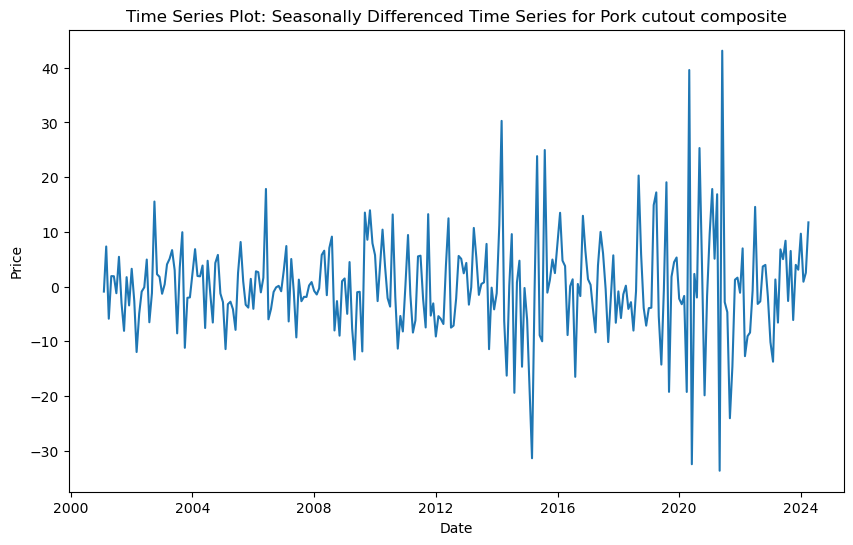

Seasonally Differenced Series - ADF Test for Pork cutout composite:
ADF Statistic: -4.940473593946296
p-value: 2.9070662559039586e-05
Critical Values: {'1%': -3.455558114028747, '5%': -2.872635586277424, '10%': -2.572682677000175}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Pork cutout composite:
KPSS Statistic: 0.029336098094628577
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




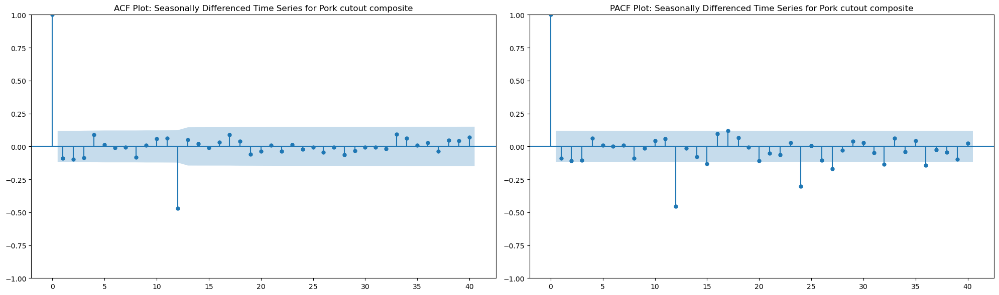

Seasonal Decomposition for Pork cutout composite:


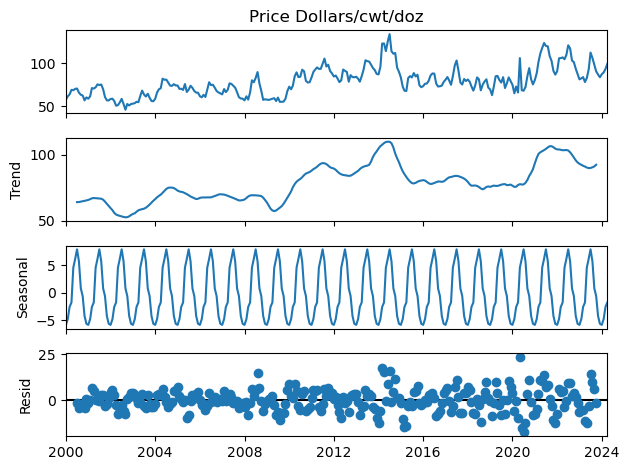


Analyzing subtype: Loins, 1/4", trimmed vacuum-packed


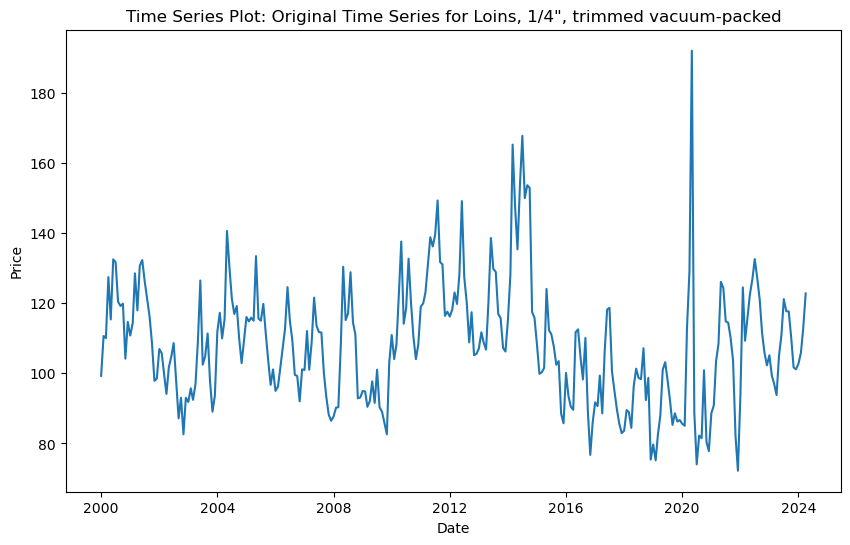

Original Series - ADF Test for Loins, 1/4", trimmed vacuum-packed:
ADF Statistic: -2.613303105770854
p-value: 0.09027883850511526
Critical Values: {'1%': -3.4540076534999957, '5%': -2.8719557347997178, '10%': -2.5723200648758366}
The series is likely non-stationary
Original Series - KPSS Test for Loins, 1/4", trimmed vacuum-packed:
KPSS Statistic: 0.2593647084710997
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




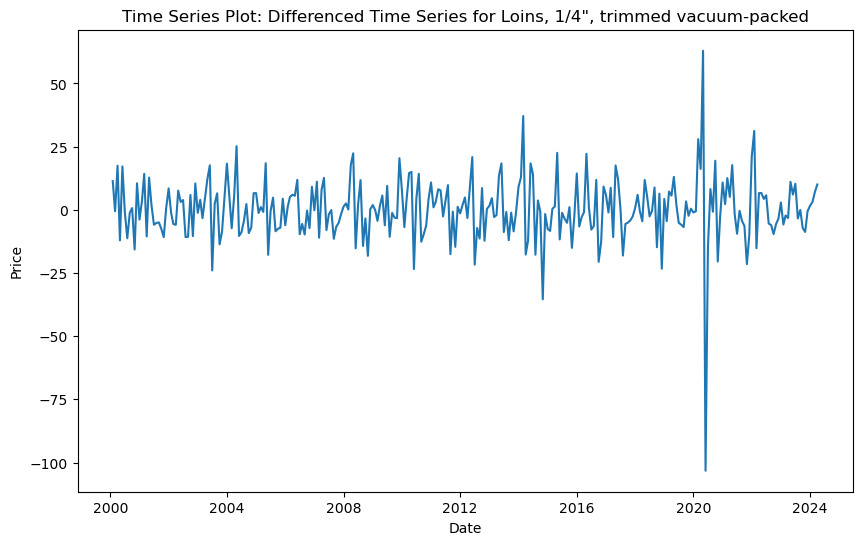

Differenced Series - ADF Test for Loins, 1/4", trimmed vacuum-packed:
ADF Statistic: -7.02121034346408
p-value: 6.53612803190265e-10
Critical Values: {'1%': -3.4540076534999957, '5%': -2.8719557347997178, '10%': -2.5723200648758366}
The series is likely stationary
Differenced Series - KPSS Test for Loins, 1/4", trimmed vacuum-packed:
KPSS Statistic: 0.03950144794909262
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




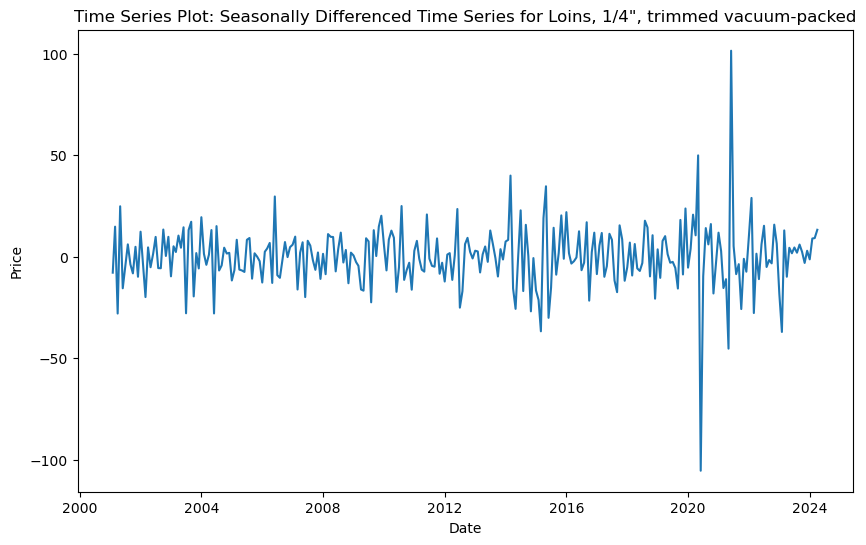

Seasonally Differenced Series - ADF Test for Loins, 1/4", trimmed vacuum-packed:
ADF Statistic: -7.4653045030280625
p-value: 5.223539194118422e-11
Critical Values: {'1%': -3.455365238788105, '5%': -2.8725510317187024, '10%': -2.5726375763314966}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Loins, 1/4", trimmed vacuum-packed:
KPSS Statistic: 0.07950112109670213
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




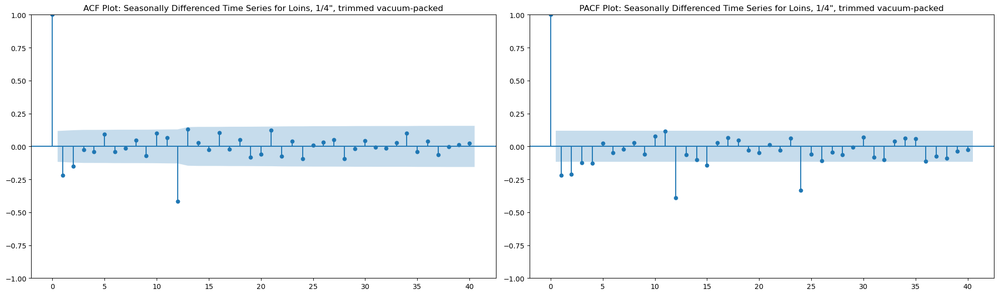

Seasonal Decomposition for Loins, 1/4", trimmed vacuum-packed:


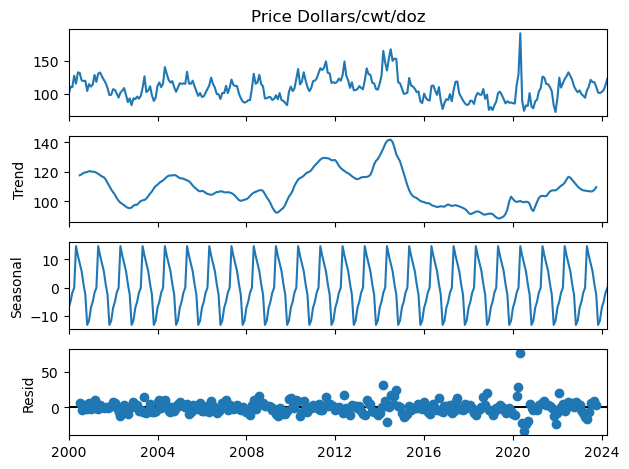


Analyzing subtype: Combined regional


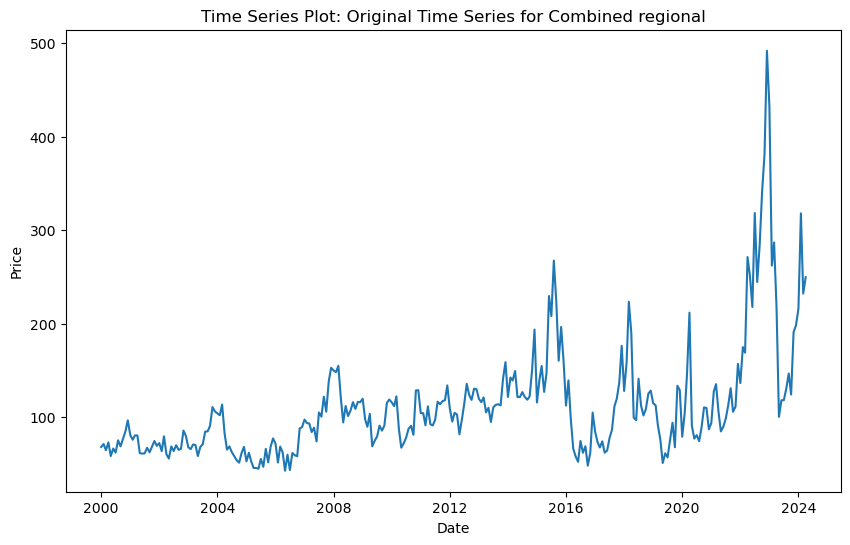

Original Series - ADF Test for Combined regional:
ADF Statistic: -2.225789792743219
p-value: 0.1970187375565985
Critical Values: {'1%': -3.4538376962008495, '5%': -2.8718811911083093, '10%': -2.5722803076202174}
The series is likely non-stationary
Original Series - KPSS Test for Combined regional:
KPSS Statistic: 1.198258076741051
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




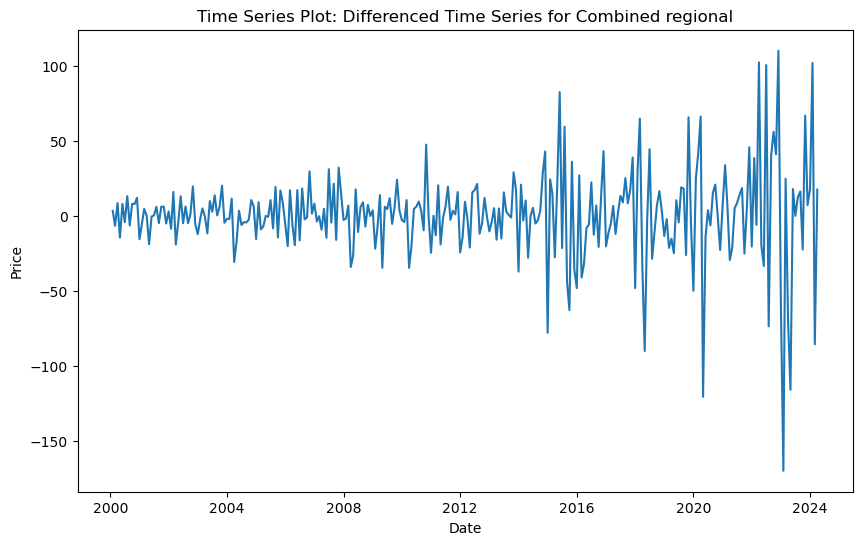

Differenced Series - ADF Test for Combined regional:
ADF Statistic: -7.473172375662376
p-value: 4.992525853742378e-11
Critical Values: {'1%': -3.4538376962008495, '5%': -2.8718811911083093, '10%': -2.5722803076202174}
The series is likely stationary
Differenced Series - KPSS Test for Combined regional:
KPSS Statistic: 0.02715643382452887
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




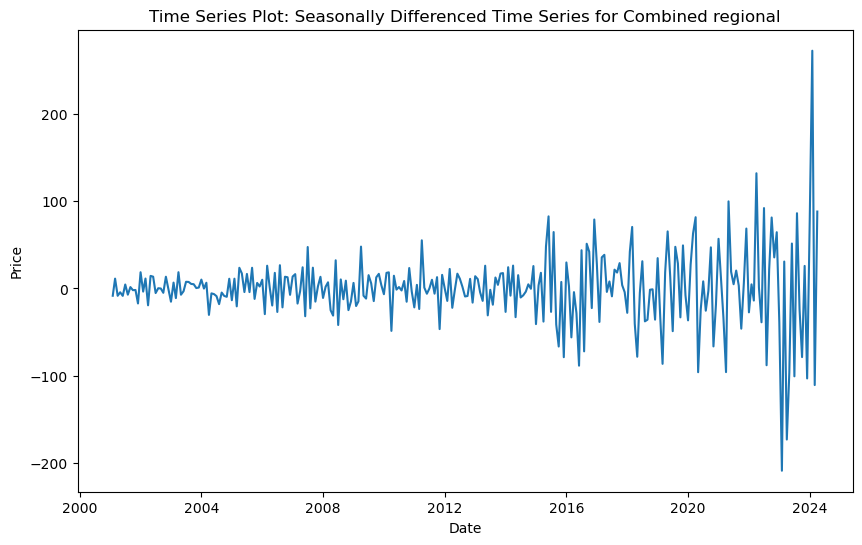

Seasonally Differenced Series - ADF Test for Combined regional:
ADF Statistic: -5.725202894256032
p-value: 6.796439531284226e-07
Critical Values: {'1%': -3.455365238788105, '5%': -2.8725510317187024, '10%': -2.5726375763314966}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Combined regional:
KPSS Statistic: 0.014413408741381929
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




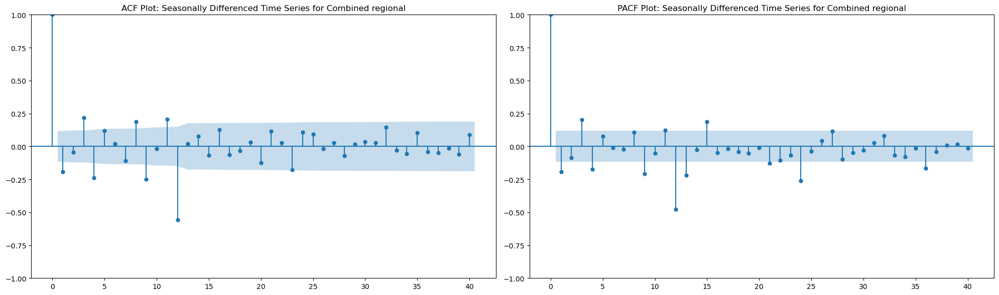

Seasonal Decomposition for Combined regional:


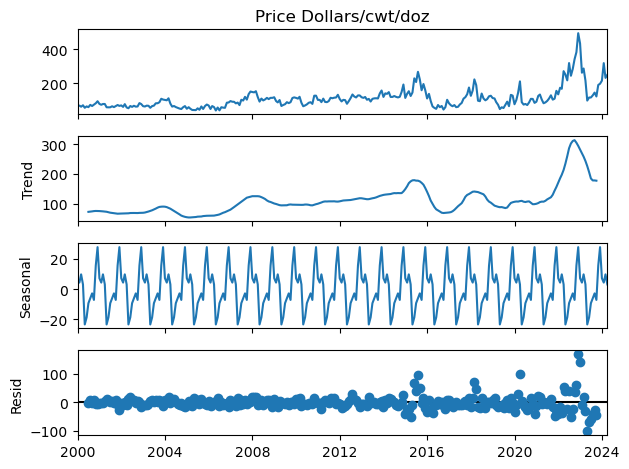


Analyzing subtype: New York


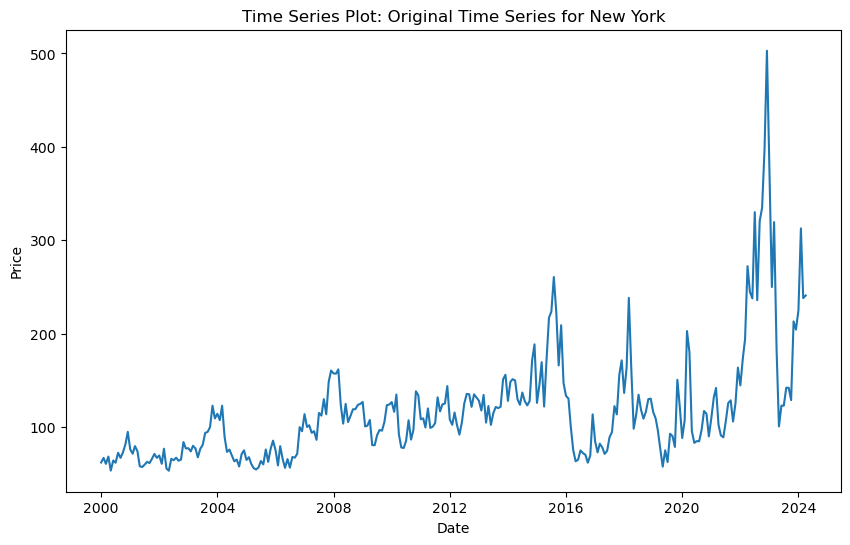

Original Series - ADF Test for New York:
ADF Statistic: -2.251963609527147
p-value: 0.1879287279779615
Critical Values: {'1%': -3.4538376962008495, '5%': -2.8718811911083093, '10%': -2.5722803076202174}
The series is likely non-stationary
Original Series - KPSS Test for New York:
KPSS Statistic: 1.2331134973169569
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




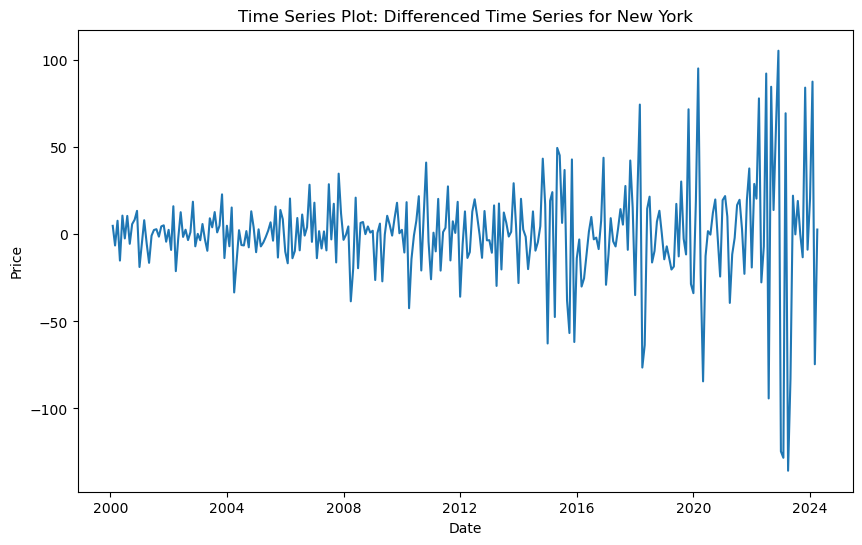

Differenced Series - ADF Test for New York:
ADF Statistic: -7.533103249124468
p-value: 3.535751496019225e-11
Critical Values: {'1%': -3.4538376962008495, '5%': -2.8718811911083093, '10%': -2.5722803076202174}
The series is likely stationary
Differenced Series - KPSS Test for New York:
KPSS Statistic: 0.0222206261419998
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




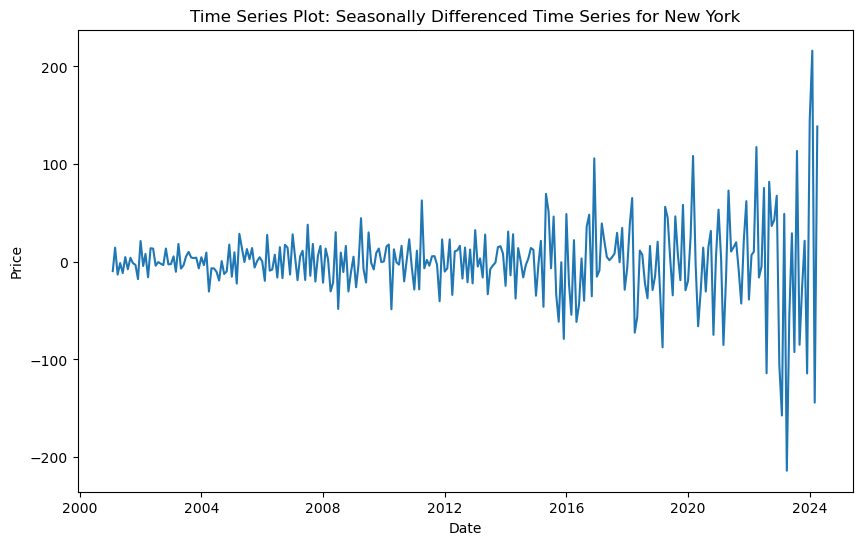

Seasonally Differenced Series - ADF Test for New York:
ADF Statistic: -5.823328499784223
p-value: 4.1339526301542204e-07
Critical Values: {'1%': -3.455365238788105, '5%': -2.8725510317187024, '10%': -2.5726375763314966}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for New York:
KPSS Statistic: 0.016589718528280825
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




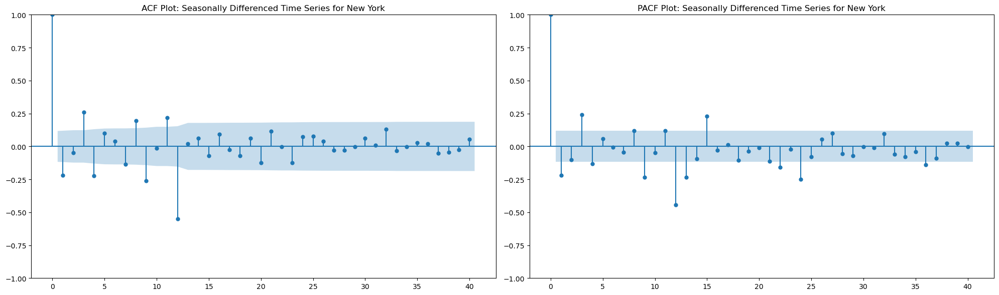

Seasonal Decomposition for New York:


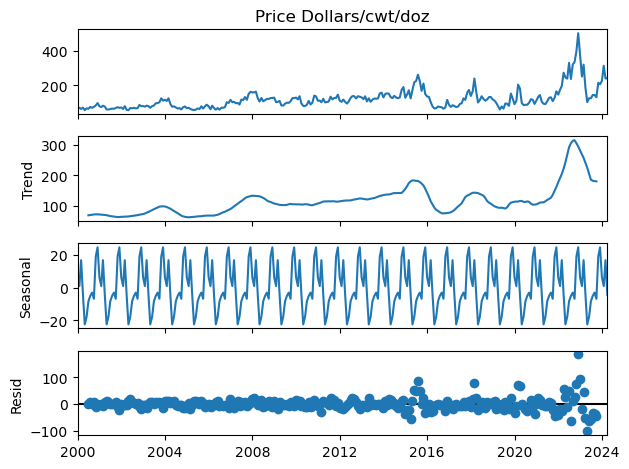


Analyzing subtype: Drumsticks


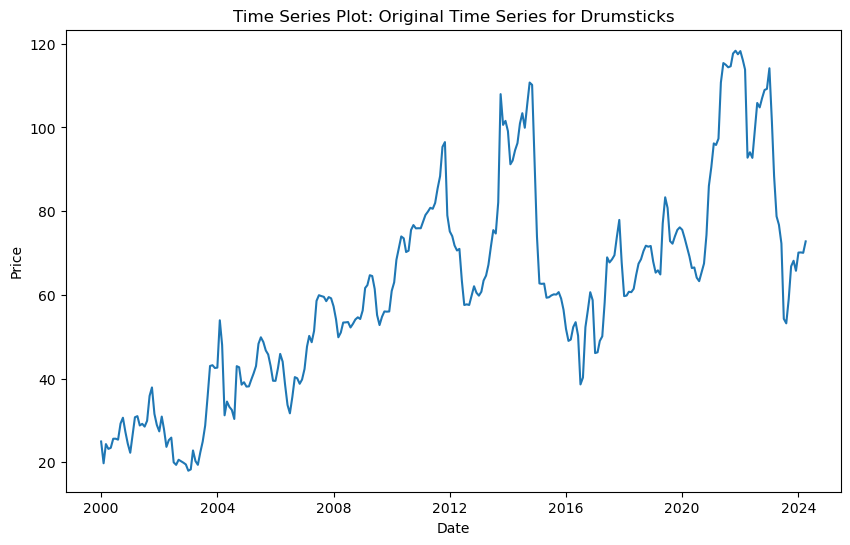

Original Series - ADF Test for Drumsticks:
ADF Statistic: -2.2619652407663753
p-value: 0.1845284135340124
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely non-stationary
Original Series - KPSS Test for Drumsticks:
KPSS Statistic: 1.7848676617547328
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




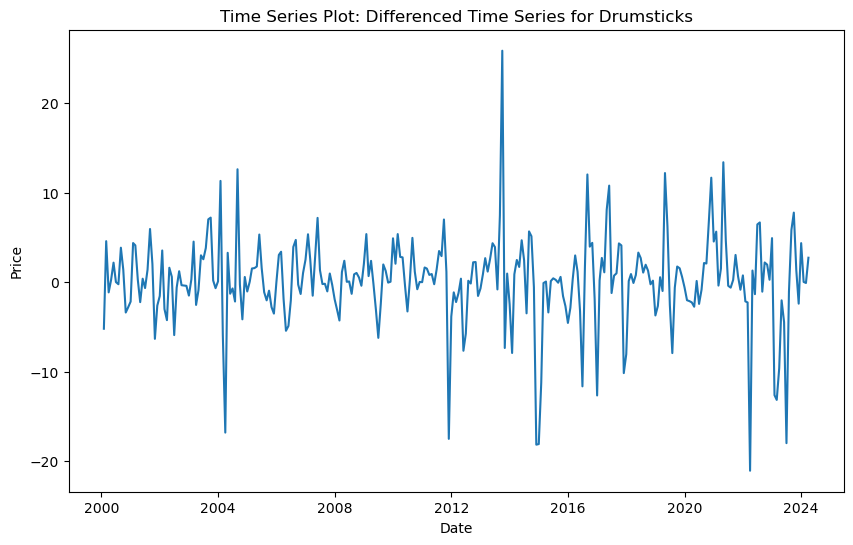

Differenced Series - ADF Test for Drumsticks:
ADF Statistic: -11.736899833765
p-value: 1.30123068612892e-21
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely stationary
Differenced Series - KPSS Test for Drumsticks:
KPSS Statistic: 0.04580301863710624
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




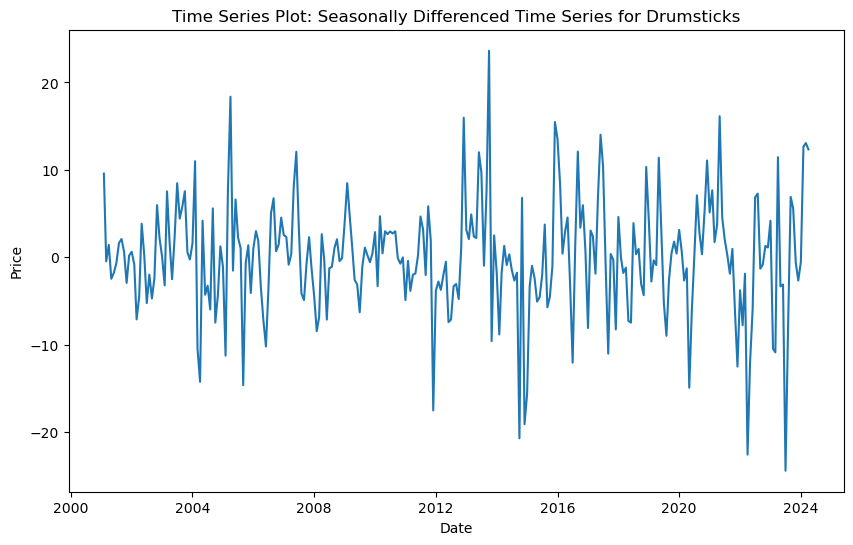

Seasonally Differenced Series - ADF Test for Drumsticks:
ADF Statistic: -6.3826618956861525
p-value: 2.2027351801925834e-08
Critical Values: {'1%': -3.455175292841607, '5%': -2.8724677563219485, '10%': -2.57259315846006}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Drumsticks:
KPSS Statistic: 0.020773760135721155
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




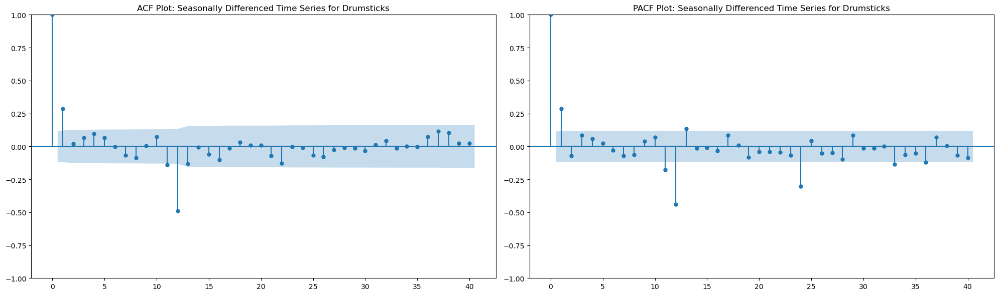

Seasonal Decomposition for Drumsticks:


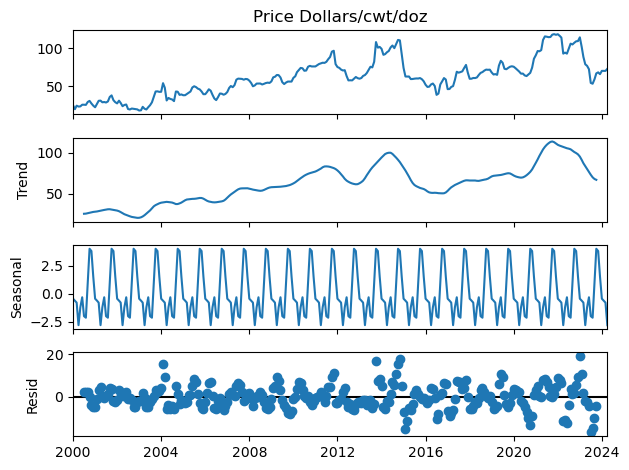


Analyzing subtype: Wings, full cut


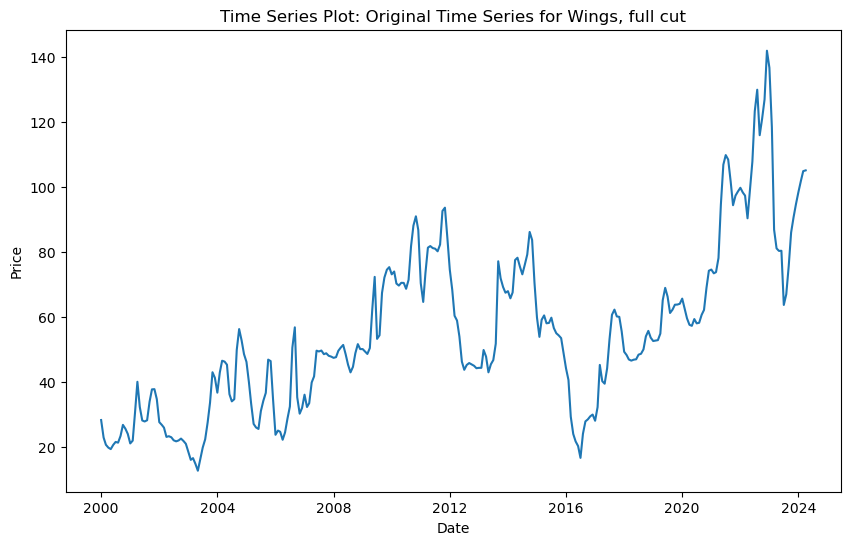

Original Series - ADF Test for Wings, full cut:
ADF Statistic: -2.0047835975331685
p-value: 0.2844796053026153
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely non-stationary
Original Series - KPSS Test for Wings, full cut:
KPSS Statistic: 1.4806018060926955
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




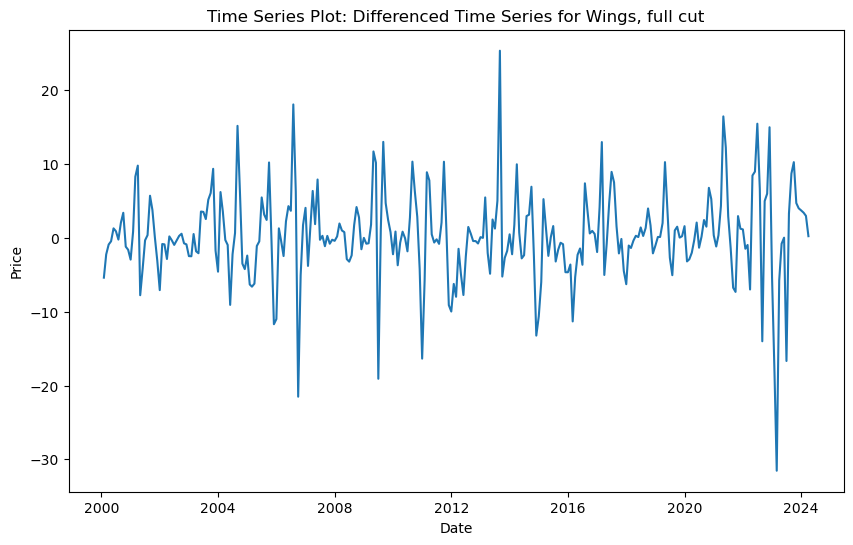

Differenced Series - ADF Test for Wings, full cut:
ADF Statistic: -12.836244889905517
p-value: 5.7325545004216324e-24
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely stationary
Differenced Series - KPSS Test for Wings, full cut:
KPSS Statistic: 0.03852808721700129
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




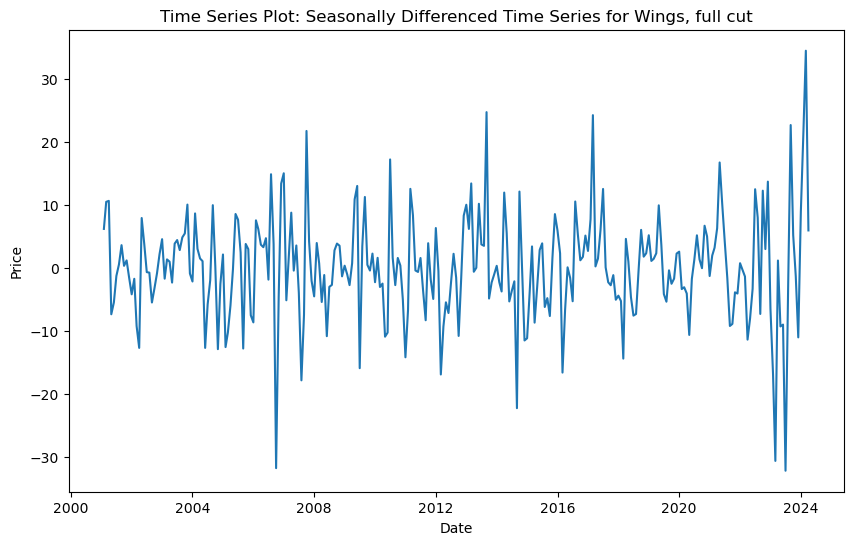

Seasonally Differenced Series - ADF Test for Wings, full cut:
ADF Statistic: -6.185018464191662
p-value: 6.320044514575921e-08
Critical Values: {'1%': -3.4552699038400827, '5%': -2.8725092359464526, '10%': -2.5726152830188678}
The series is likely stationary
Seasonally Differenced Series - KPSS Test for Wings, full cut:
KPSS Statistic: 0.021223123622459806
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary


C:\Users\Bharath\AppData\Local\Temp\ipykernel_6724\929606410.py:33: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.




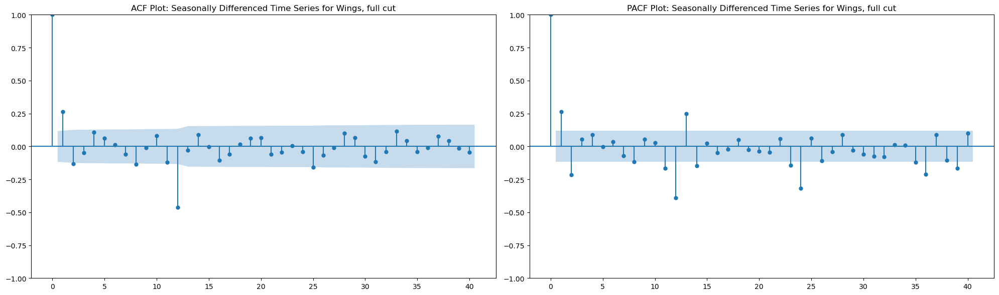

Seasonal Decomposition for Wings, full cut:


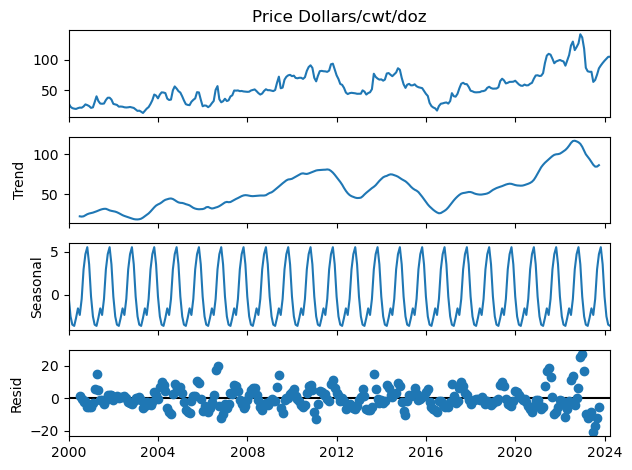

In [73]:
#All FOR SARIMA MODEL PROCESS

#Seasonlity Check 
#Differencing Check
#Acf and Pacf Plot check
# Seasonal Decompostion Check

# List of selected subtypes
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 
    'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 
    'Wings, full cut'
]

# Function to perform ADF test
def adf_test(series):
    result = adfuller(series, autolag='AIC')
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'Critical Values: {result[4]}')
    if result[1] <= 0.05:
        print("The series is likely stationary")
    else:
        print("The series is likely non-stationary")

# Function to perform KPSS test
def kpss_test(series):
    result = kpss(series, regression='c', nlags='auto')
    print(f'KPSS Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    print(f'Critical Values: {result[3]}')
    if result[1] <= 0.05:
        print("The series is likely non-stationary")
    else:
        print("The series is likely stationary")

# Function to plot time series
def plot_series(series, title):
    plt.figure(figsize=(10, 6))
    plt.plot(series)
    plt.title(f'Time Series Plot: {title}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.show()

# Function to plot ACF and PACF
def plot_acf_pacf(series, title):
    plt.figure(figsize=(20, 6))
    
    # Plot ACF
    plt.subplot(1, 2, 1)
    plot_acf(series, ax=plt.gca(), lags=40)
    plt.title(f'ACF Plot: {title}')
    
    # Plot PACF
    plt.subplot(1, 2, 2)
    plot_pacf(series, ax=plt.gca(), lags=40)
    plt.title(f'PACF Plot: {title}')
    
    plt.tight_layout()
    plt.show()

# Function to apply differencing
def difference(series, period=1):
    return series.diff(period).dropna()

# Analyze each meat subtype
for stype in selected_subtypes:
    print(f'\nAnalyzing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_data = meat_data[meat_data['Meat  Sub-Type'] == stype]['Price Dollars/cwt/doz']
    
    # Drop missing values
    subtype_data = subtype_data.dropna()
    
    # Plot the original time series
    plot_series(subtype_data, f'Original Time Series for {stype}')
    
    # Perform ADF and KPSS tests on the original series
    print(f'Original Series - ADF Test for {stype}:')
    adf_test(subtype_data)
    print(f'Original Series - KPSS Test for {stype}:')
    kpss_test(subtype_data)
    
    # Apply first-order differencing
    differenced_series = difference(subtype_data)
    plot_series(differenced_series, f'Differenced Time Series for {stype}')
    
    # Perform ADF and KPSS tests on the differenced series
    print(f'Differenced Series - ADF Test for {stype}:')
    adf_test(differenced_series)
    print(f'Differenced Series - KPSS Test for {stype}:')
    kpss_test(differenced_series)
    
    # If still non-stationary, apply seasonal differencing
    # Adjust period based on seasonality in your data
    season_period = 12  # Example: for monthly data with yearly seasonality
    seasonal_differenced_series = difference(differenced_series, period=season_period)
    plot_series(seasonal_differenced_series, f'Seasonally Differenced Time Series for {stype}')
    
    # Perform ADF and KPSS tests on the seasonally differenced series
    print(f'Seasonally Differenced Series - ADF Test for {stype}:')
    adf_test(seasonal_differenced_series)
    print(f'Seasonally Differenced Series - KPSS Test for {stype}:')
    kpss_test(seasonal_differenced_series)
    
    # Plot ACF and PACF for the seasonally differenced series
    plot_acf_pacf(seasonal_differenced_series, f'Seasonally Differenced Time Series for {stype}')
    
    # Optionally: Decompose the series to visualize trend and seasonality
    print(f'Seasonal Decomposition for {stype}:')
    decomposition = seasonal_decompose(subtype_data, period=season_period)
    decomposition.plot()
    plt.show()


## This SARIMA Process Is Done Step By Step To save the pictures in best quality

In [133]:
# 1.Function to plot and save the original time series
def plot_and_save_series(series, stype):
    plt.figure(figsize=(10, 6))
    plt.plot(series)
    plt.title(f'Original Time Series for {stype}')
    plt.xlabel('Date')
    plt.ylabel('Price')

In [134]:
# 2.Function to perform ADF and KPSS tests
def perform_stationarity_tests(series, stype, series_name):
    print(f"\n{series_name} - ADF Test for {stype}:")
    adf_test(series)
    
    print(f"\n{series_name} - KPSS Test for {stype}:")
    kpss_test(series)


In [135]:
# 3. Function to apply differencing and save the differenced series
def plot_and_save_differenced_series(series, stype, diff_type):
    plt.figure(figsize=(10, 6))
    plt.plot(series)
    plt.title(f'{diff_type} Differenced Time Series for {stype}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    
    # # Save the plot as a PNG file
    # file_name = f"{diff_type}_Differenced_Time_Series_{stype.replace(' ', '_').replace(',', '').replace('/', '_')}.png"
    # plt.savefig(file_name, dpi=300, bbox_inches='tight')
    
    # plt.show()
    # print(f"Saved: {file_name}")


In [136]:
# 4. Again Function to plot and save ACF and PACF
def plot_and_save_acf_pacf(series, stype, diff_type):
    plt.figure(figsize=(20, 6))
    
    # Plot ACF
    plt.subplot(1, 2, 1)
    plot_acf(series, ax=plt.gca(), lags=40)
    plt.title(f'ACF Plot: {diff_type} Time Series for {stype}')
    
    # Plot PACF
    plt.subplot(1, 2, 2)
    plot_pacf(series, ax=plt.gca(), lags=40)
    plt.title(f'PACF Plot: {diff_type} Time Series for {stype}')
    
    plt.tight_layout()

  
    # Sanitize the filename by replacing or removing invalid characters
    sanitized_stype = stype.replace(' ', '_').replace(',', '').replace('/', '_').replace('"', '').replace("'", '')
    file_name = f"ACF_PACF_{diff_type}_Time_Series_{sanitized_stype}.png"
    
    # Save the plot as a high-resolution PNG file
    plt.savefig(file_name)
    plt.show()
    
    print(f"Saved: {file_name}")
    plt.close()


In [137]:
# 5. Function to decompose the series and save the plot
def decompose_and_save(series, stype, period=12):
    decomposition = seasonal_decompose(series, period=period)



Analyzing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb

Original Series - ADF Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
ADF Statistic: -0.052024634350545926
p-value: 0.9540123227269353
Critical Values: {'1%': -3.4540935579190495, '5%': -2.8719934111688965, '10%': -2.5723401594120388}
The series is likely non-stationary

Original Series - KPSS Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
KPSS Statistic: 2.4994152704544614
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary

Differenced Series - ADF Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
ADF Statistic: -5.760465966220072
p-value: 5.688089115464951e-07
Critical Values: {'1%': -3.4540935579190495, '5%': -2.8719934111688965, '10%': -2.5723401594120388}
The series is likely stationary

Differenced Series - KPSS Test for Boxed beef cutout   /  select 1-3 (600-900) lsb:
KPSS Statistic: 0.0814674619456469
p-value: 

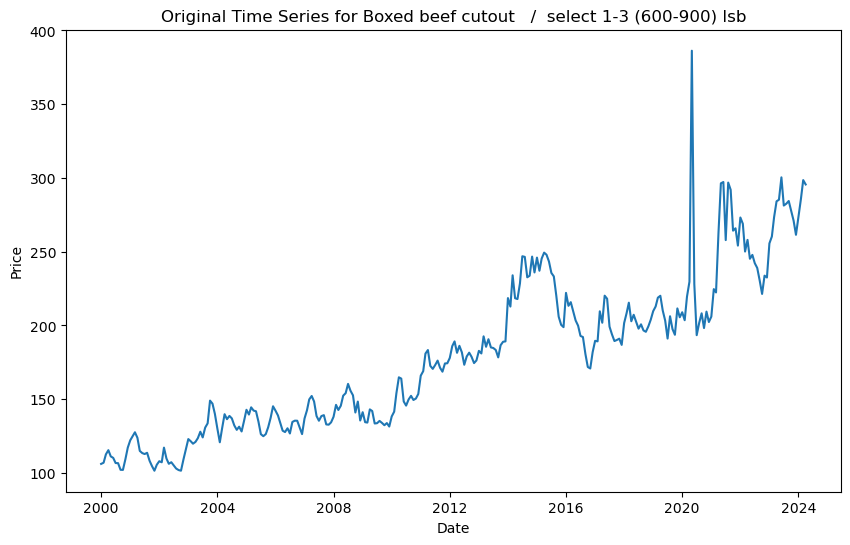

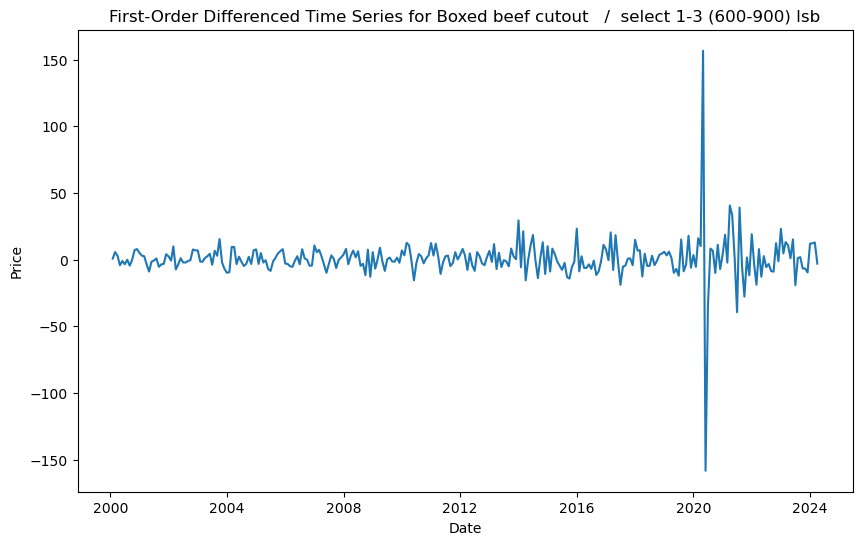

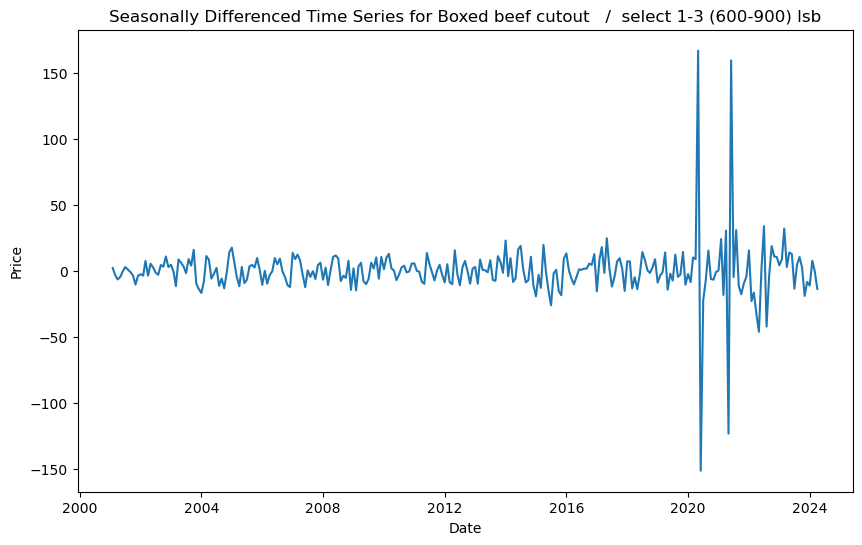

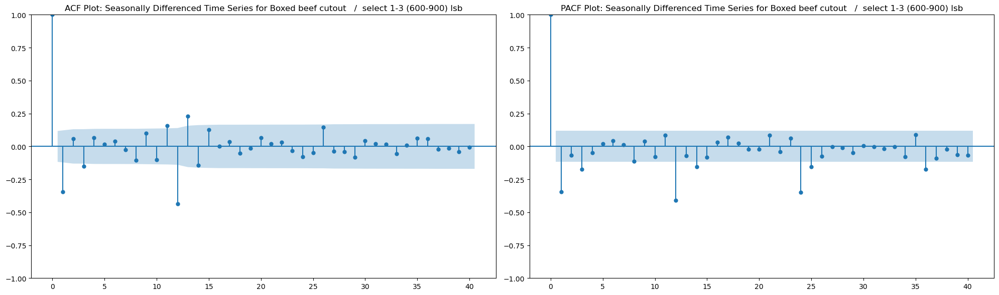

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Boxed_beef_cutout______select_1-3_(600-900)_lsb.png

Analyzing subtype: Imported boneless beef, 90 percent, frozen

Original Series - ADF Test for Imported boneless beef, 90 percent, frozen:
ADF Statistic: -0.8568905691683729
p-value: 0.8018374213962431
Critical Values: {'1%': -3.4542672521624214, '5%': -2.87206958769775, '10%': -2.5723807881747534}
The series is likely non-stationary

Original Series - KPSS Test for Imported boneless beef, 90 percent, frozen:
KPSS Statistic: 2.517663772442862
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary

Differenced Series - ADF Test for Imported boneless beef, 90 percent, frozen:
ADF Statistic: -6.418495183707324
p-value: 1.81606721525519e-08
Critical Values: {'1%': -3.4544435065994437, '5%': -2.8721468827772774, '10%': -2.572422013959188}
The series is likely stationary

Differenced Series - KPSS Test for Imported boneless

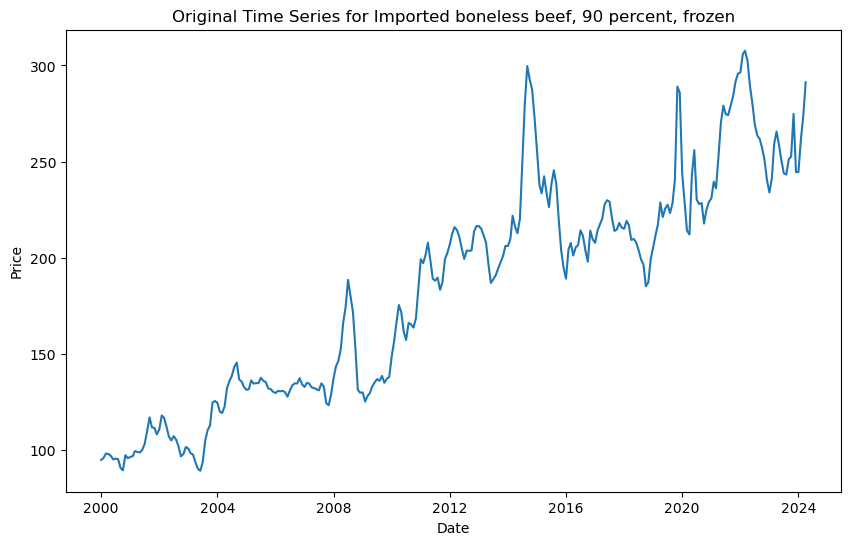

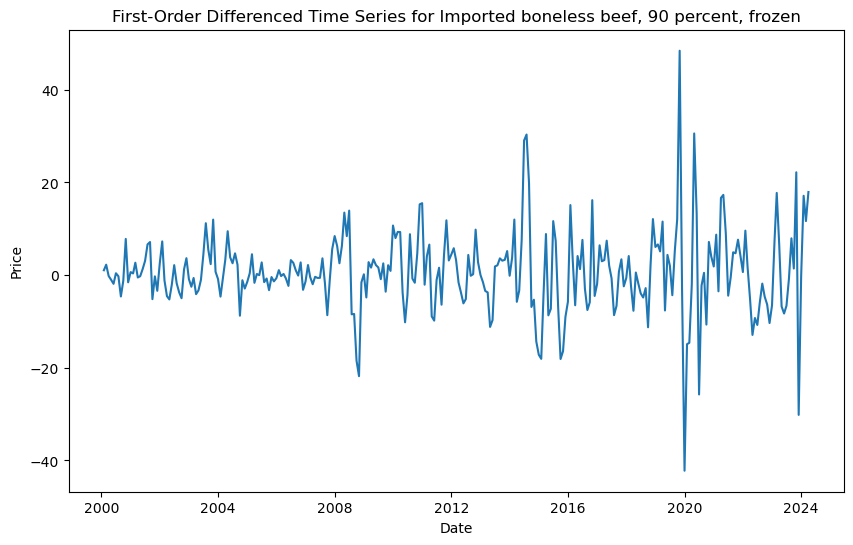

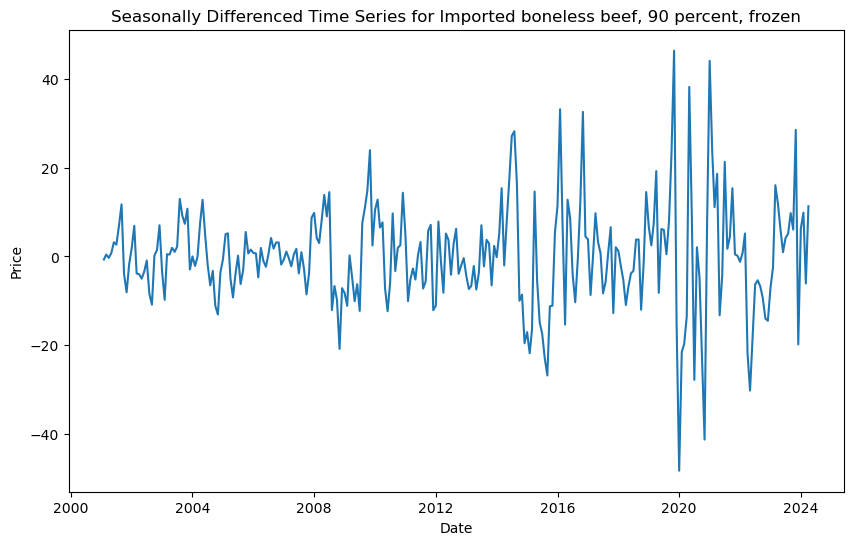

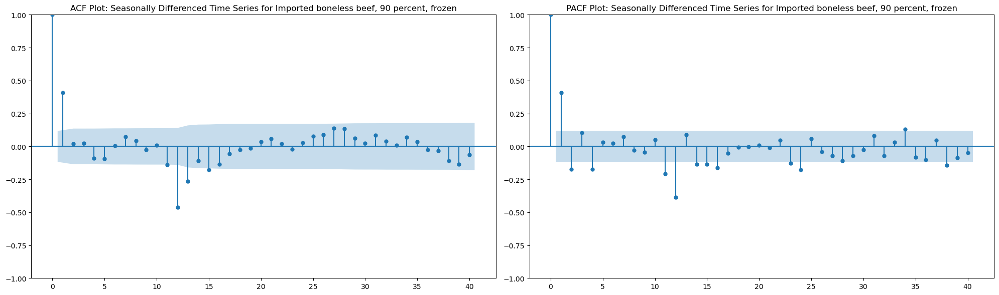

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Imported_boneless_beef_90_percent_frozen.png

Analyzing subtype: Pork cutout composite

Original Series - ADF Test for Pork cutout composite:
ADF Statistic: -1.8338128508259237
p-value: 0.36380841375334017
Critical Values: {'1%': -3.4537536300652, '5%': -2.8718443180148836, '10%': -2.572260641818822}
The series is likely non-stationary

Original Series - KPSS Test for Pork cutout composite:
KPSS Statistic: 1.4869339363405076
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary

Differenced Series - ADF Test for Pork cutout composite:
ADF Statistic: -8.998314945670478
p-value: 6.601696067784447e-15
Critical Values: {'1%': -3.4537536300652, '5%': -2.8718443180148836, '10%': -2.572260641818822}
The series is likely stationary

Differenced Series - KPSS Test for Pork cutout composite:
KPSS Statistic: 0.02417295687162041
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 

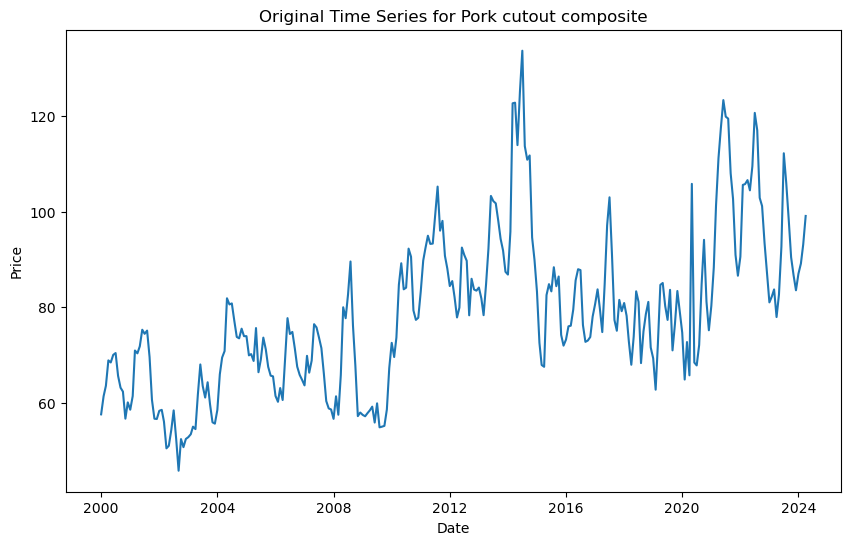

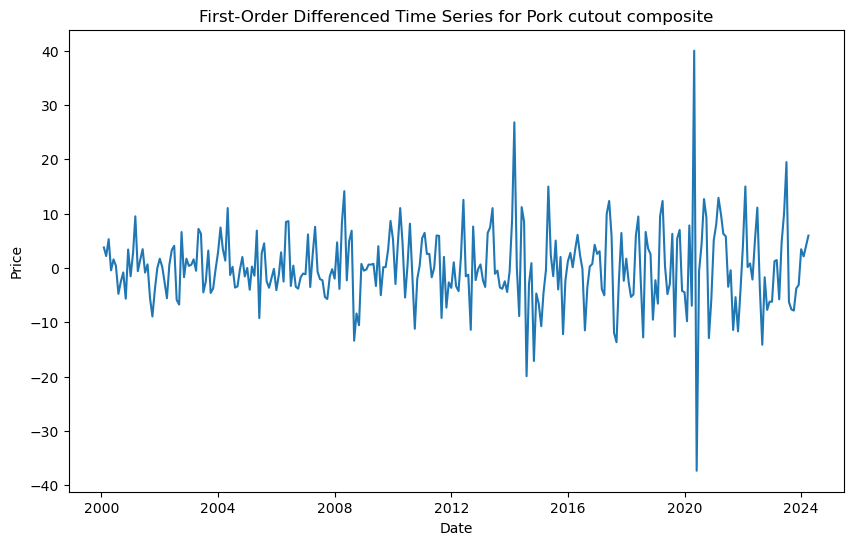

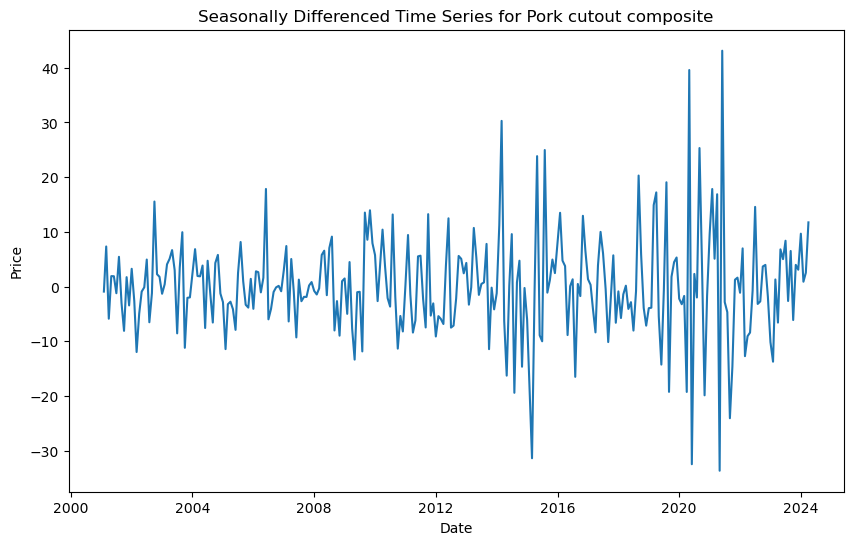

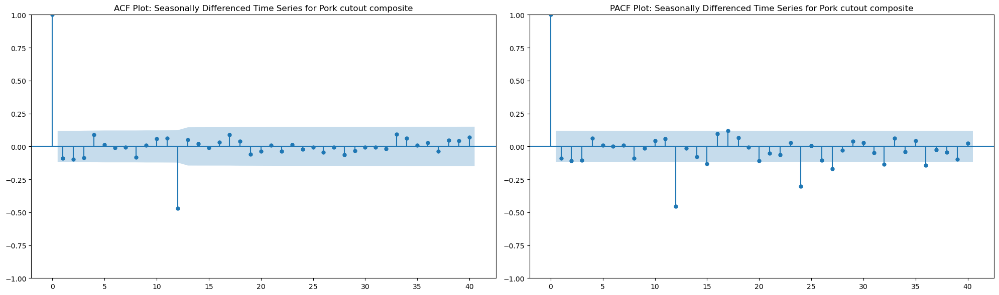

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Pork_cutout_composite.png

Analyzing subtype: Loins, 1/4", trimmed vacuum-packed

Original Series - ADF Test for Loins, 1/4", trimmed vacuum-packed:
ADF Statistic: -2.613303105770854
p-value: 0.09027883850511526
Critical Values: {'1%': -3.4540076534999957, '5%': -2.8719557347997178, '10%': -2.5723200648758366}
The series is likely non-stationary

Original Series - KPSS Test for Loins, 1/4", trimmed vacuum-packed:
KPSS Statistic: 0.2593647084710997
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely stationary

Differenced Series - ADF Test for Loins, 1/4", trimmed vacuum-packed:
ADF Statistic: -7.02121034346408
p-value: 6.53612803190265e-10
Critical Values: {'1%': -3.4540076534999957, '5%': -2.8719557347997178, '10%': -2.5723200648758366}
The series is likely stationary

Differenced Series - KPSS Test for Loins, 1/4", trimmed vacuum-packed:
KPSS Statistic: 0.03950144794909262
p-val

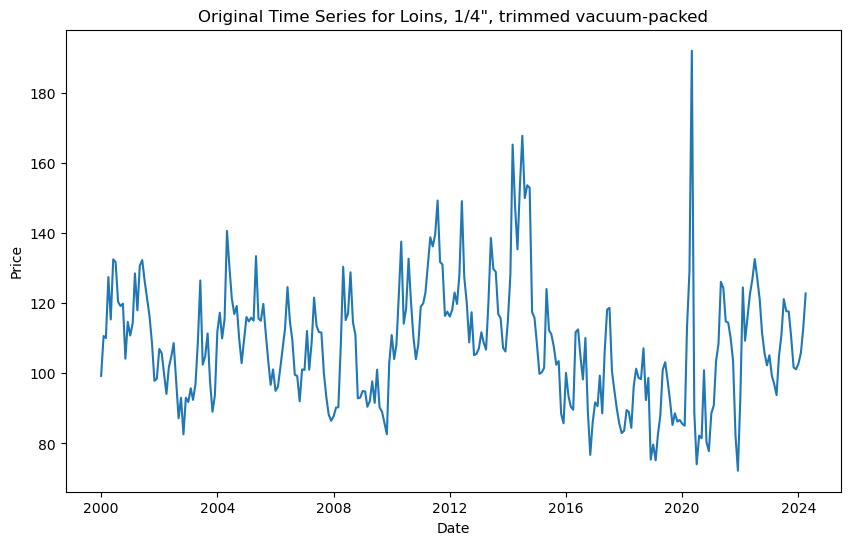

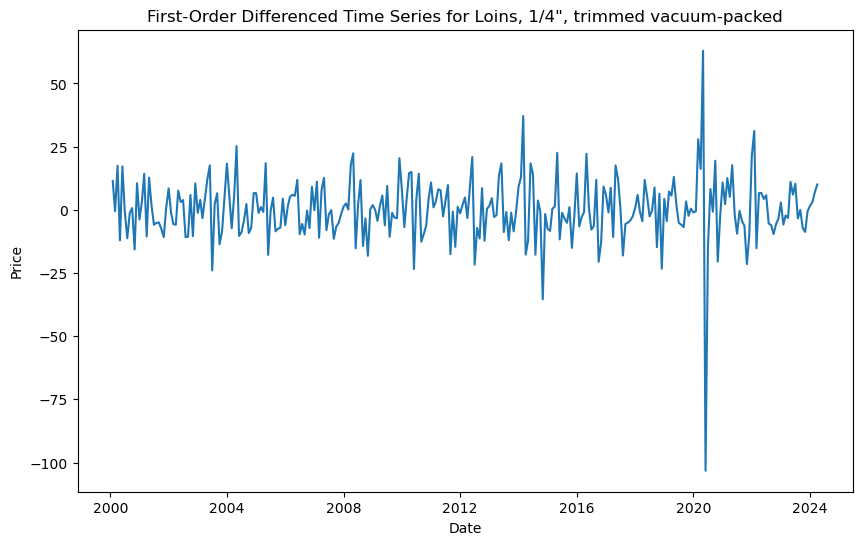

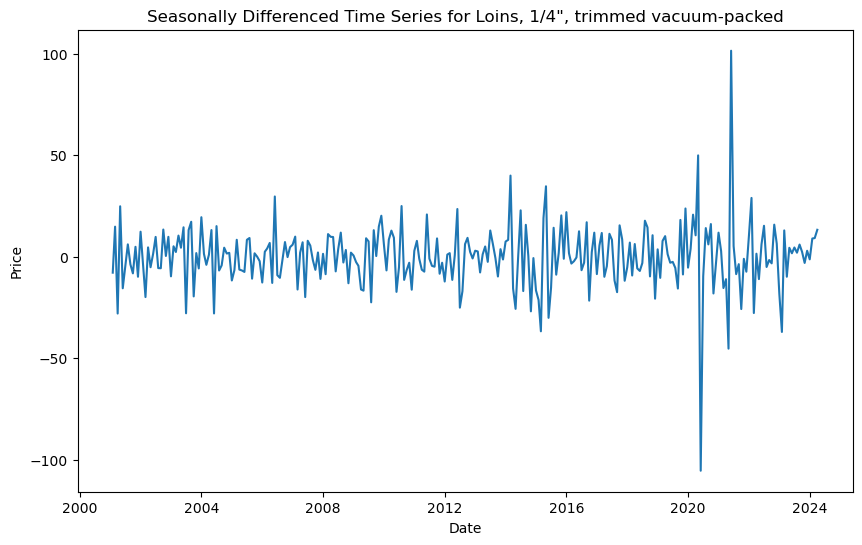

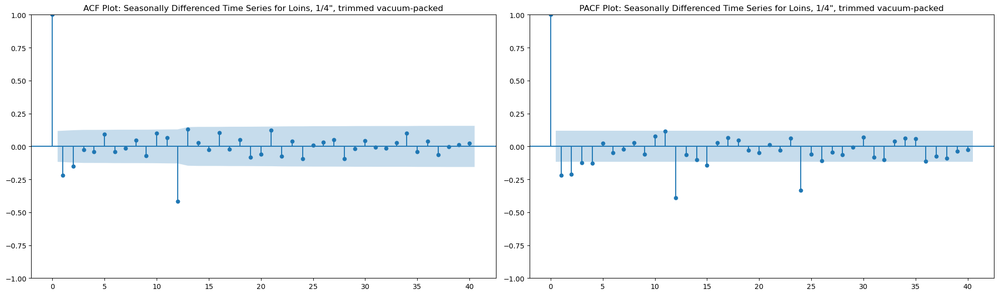

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Loins_1_4_trimmed_vacuum-packed.png

Analyzing subtype: Drumsticks

Original Series - ADF Test for Drumsticks:
ADF Statistic: -2.2619652407663753
p-value: 0.1845284135340124
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely non-stationary

Original Series - KPSS Test for Drumsticks:
KPSS Statistic: 1.7848676617547328
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary

Differenced Series - ADF Test for Drumsticks:
ADF Statistic: -11.736899833765
p-value: 1.30123068612892e-21
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely stationary

Differenced Series - KPSS Test for Drumsticks:
KPSS Statistic: 0.04580301863710624
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely statio

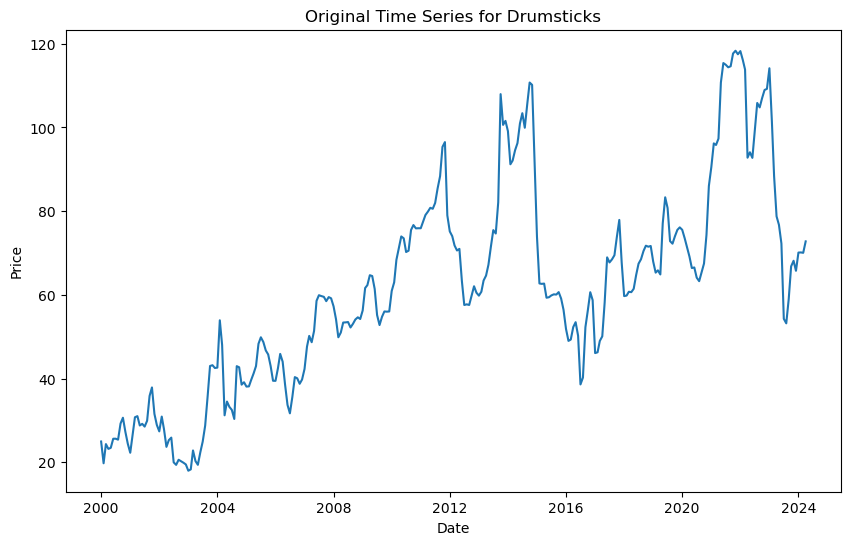

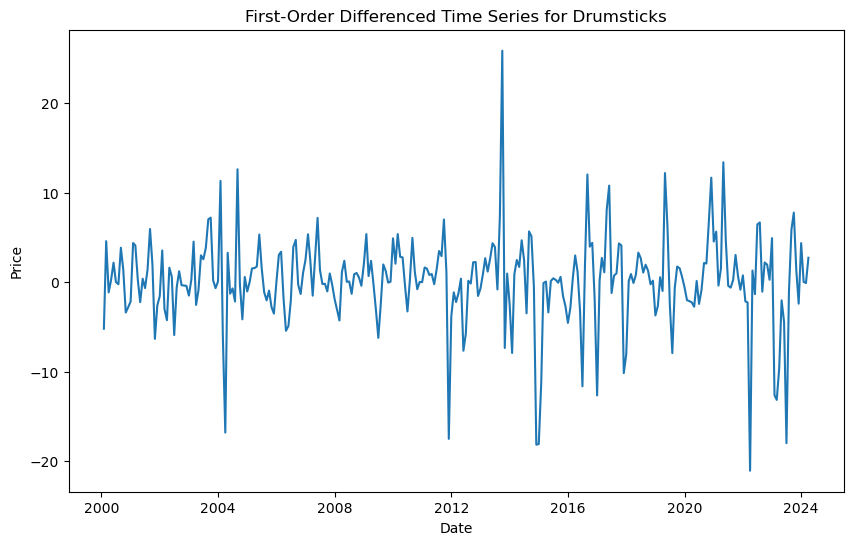

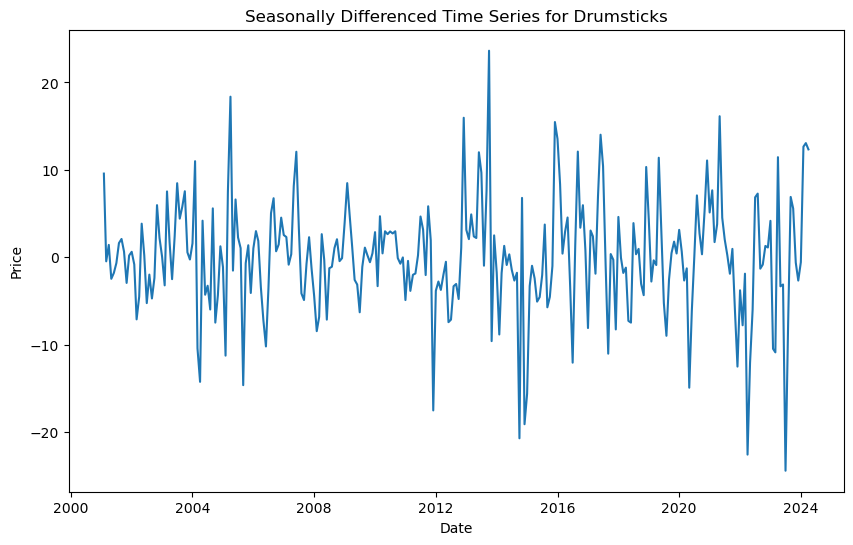

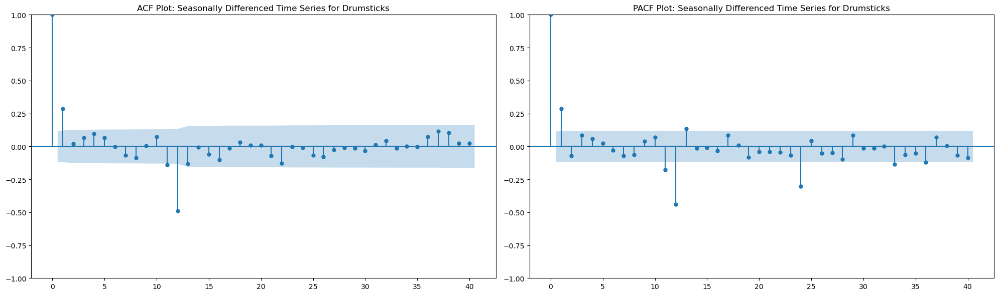

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Drumsticks.png

Analyzing subtype: Wings, full cut

Original Series - ADF Test for Wings, full cut:
ADF Statistic: -2.0047835975331685
p-value: 0.2844796053026153
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely non-stationary

Original Series - KPSS Test for Wings, full cut:
KPSS Statistic: 1.4806018060926955
p-value: 0.01
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is likely non-stationary

Differenced Series - ADF Test for Wings, full cut:
ADF Statistic: -12.836244889905517
p-value: 5.7325545004216324e-24
Critical Values: {'1%': -3.4531816058796143, '5%': -2.871593390724642, '10%': -2.5721268156511536}
The series is likely stationary

Differenced Series - KPSS Test for Wings, full cut:
KPSS Statistic: 0.03852808721700129
p-value: 0.1
Critical Values: {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739}
The series is like

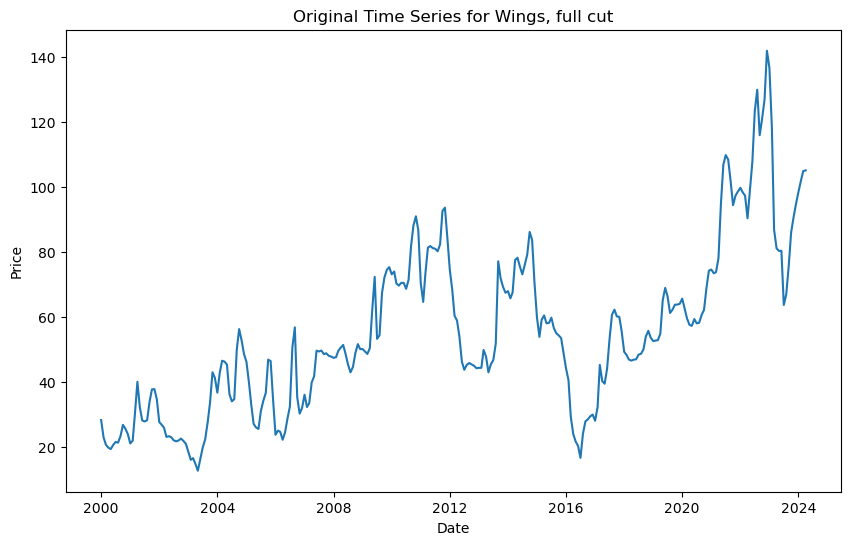

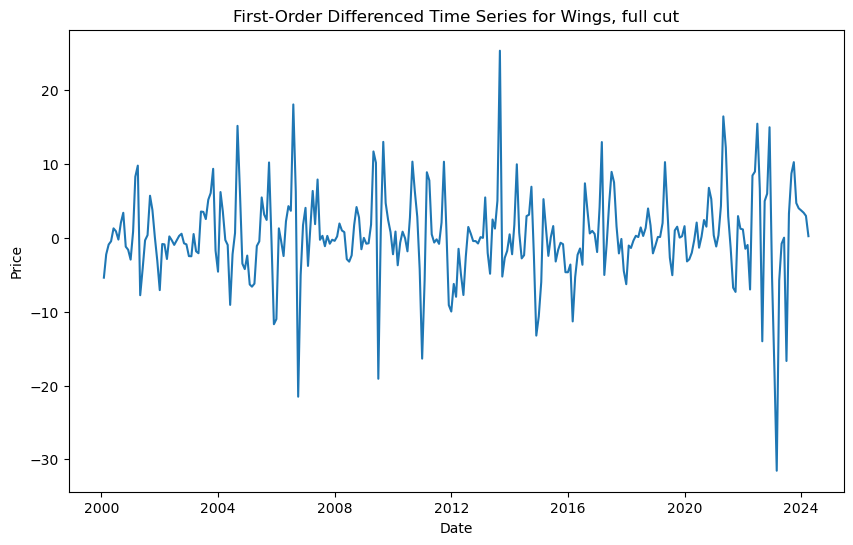

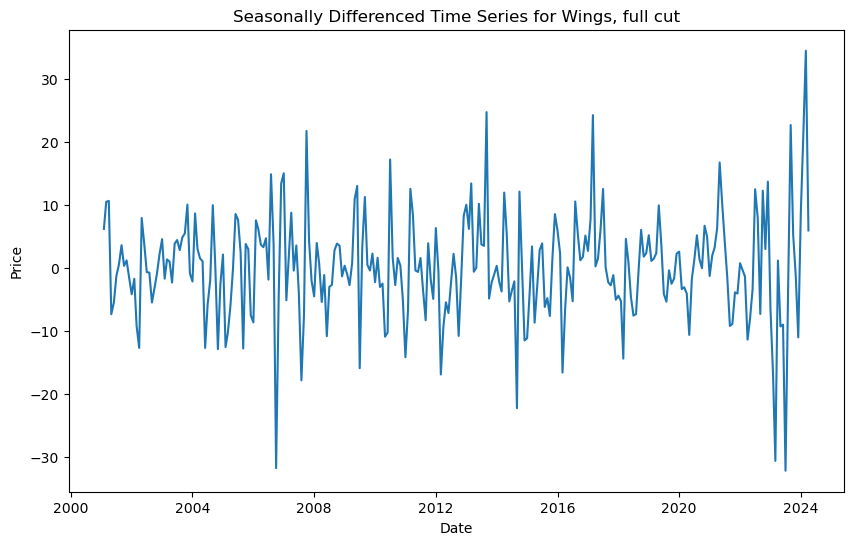

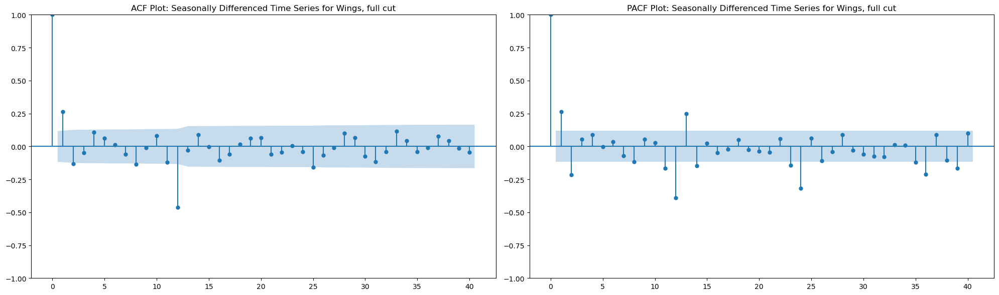

Saved: ACF_PACF_Seasonally Differenced_Time_Series_Wings_full_cut.png


In [138]:
# 6. Analyze each meat subtype step by step
for stype in selected_subtypes:
    print(f'\nAnalyzing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_data = meat_data[meat_data['Meat  Sub-Type'] == stype]['Price Dollars/cwt/doz']
    
    # Drop missing values
    subtype_data = subtype_data.dropna()
    
    # Step 1: Plot and save original time series
    plot_and_save_series(subtype_data, stype)
    
    # Step 2: Perform ADF and KPSS tests on the original series
    perform_stationarity_tests(subtype_data, stype, "Original Series")
    
    # Step 3: Apply first-order differencing and save the differenced series
    differenced_series = difference(subtype_data)
    plot_and_save_differenced_series(differenced_series, stype, "First-Order")
    
    # Step 4: Perform ADF and KPSS tests on the differenced series
    perform_stationarity_tests(differenced_series, stype, "Differenced Series")
    
    # Step 5: Apply seasonal differencing and save the seasonally differenced series
    season_period = 12  # Example: for monthly data with yearly seasonality
    seasonal_differenced_series = difference(differenced_series, period=season_period)
    plot_and_save_differenced_series(seasonal_differenced_series, stype, "Seasonally")
    
    # Step 6: Perform ADF and KPSS tests on the seasonally differenced series
    perform_stationarity_tests(seasonal_differenced_series, stype, "Seasonally Differenced Series")
    
    # Step 7: Plot and save ACF and PACF for the seasonally differenced series
    plot_and_save_acf_pacf(seasonal_differenced_series, stype, "Seasonally Differenced")
    
    # Step 8: Decompose the series and save the decomposition plot
    decompose_and_save(subtype_data, stype, period=season_period)


## SARIMA MODEL

Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
P: 1
Q: 0
Seasonal m: 36
Best R² Score: 0.8370445409379934
Best RMSE: 0.01967628708275423
Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
P: 0
Q: 0
Seasonal m: 46
Best R² Score: 0.6316706159817996
Best RMSE: 0.049510737427698195
Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
P: 1
Q: 0
Seasonal m: 10
Best R² Score: 0.8062436429721768
Best RMSE: 0.026804639413934576
Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
P: 1
Q: 1
Seasonal m: 48
Best R² Score: 0.977081531488216
Best RMSE: 0.01003865979388824
Drumsticks
Meat Type: Drumsticks
Best parameters for 5-month prediction:
P: 1
Q: 1
Seasonal m: 35
Best R² Score: 0.7888612821994214
Best RM

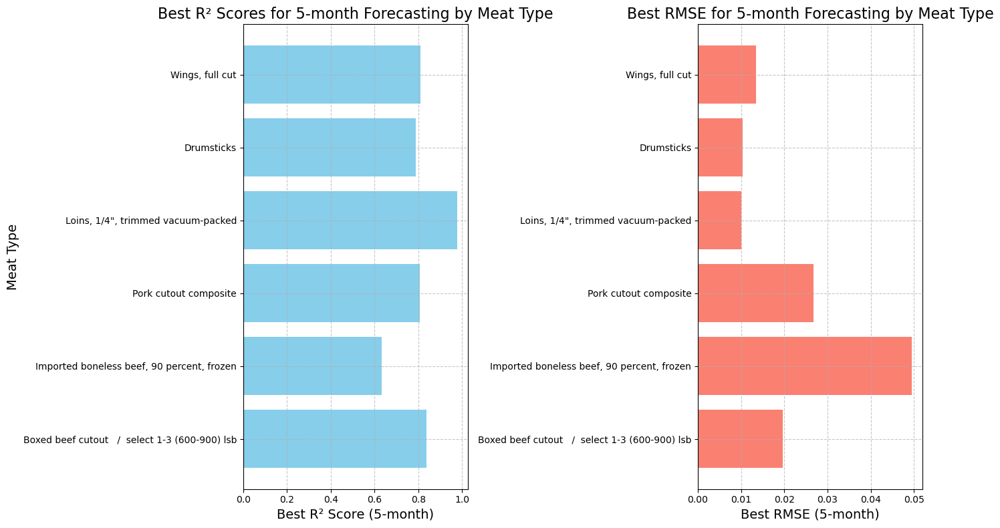

In [74]:
#SARIMA MODEL 5 MONTHS FORCASTING
a = []
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    scaler_price = MinMaxScaler()
    meat_data_price = scaler_price.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    y_train = meat_data_price[:-5]
    y_test = meat_data_price[-5:]

    r2_scr_final = 0
    rmse_final = float('inf')  

    for i in range(0, 2):
        for j in range(0, 2):
            for k in range(2, 52):
                
                model = SARIMAX(y_train, order=(i, 1, j), seasonal_order=(i, 1, j, k))
                model_fit = model.fit(disp=False)
    
                pred = model_fit.forecast(steps=5)
    
                r2_scr = r2_score(y_test, pred)
                rmse = np.sqrt(mean_squared_error(y_test, pred))
        
                if (r2_scr > r2_scr_final):
                    r2_scr_final = r2_scr
                    rmse_final = rmse
                    pval = i
                    qval = j
                    sval = k

    # Store the best parameters, R² score, and RMSE
    results.append({
        'Meat Type': stype,
        'Best P': pval,
        'Best Q': qval,
        'Best Seasonal m': sval,
        'Best R² Score': r2_scr_final,
        'Best RMSE': rmse_final
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("P:", pval)
    print("Q:", qval)
    print("Seasonal m:", sval)
    print("Best R² Score:", r2_scr_final)
    print("Best RMSE:", rmse_final)

# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

### Plotting Sarima Model for each Sub -Type

R² score: 0.8370


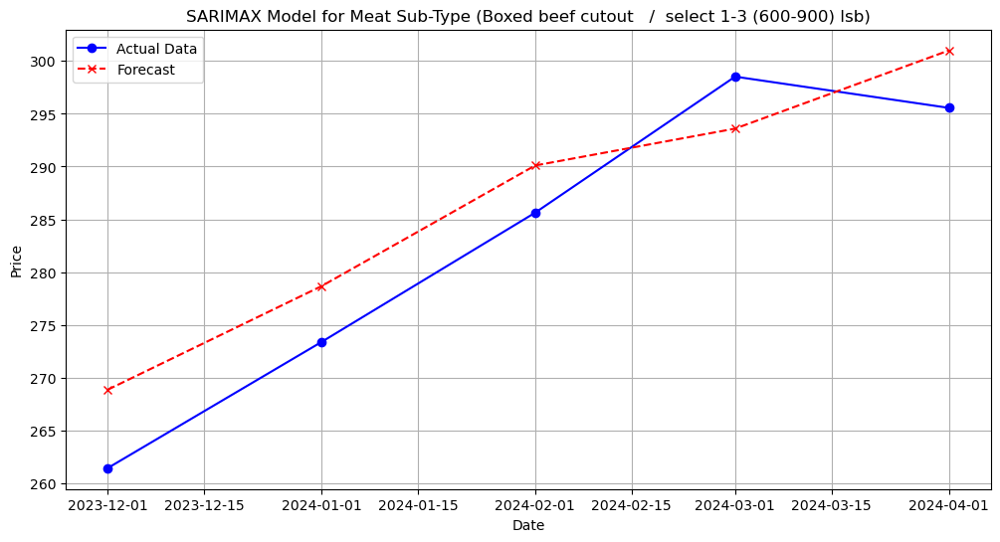

In [175]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Boxed beef cutout   /  select 1-3 (600-900) lsb']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 0), seasonal_order=(1, 1, 0, 36))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Boxed beef cutout   /  select 1-3 (600-900) lsb)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.6317


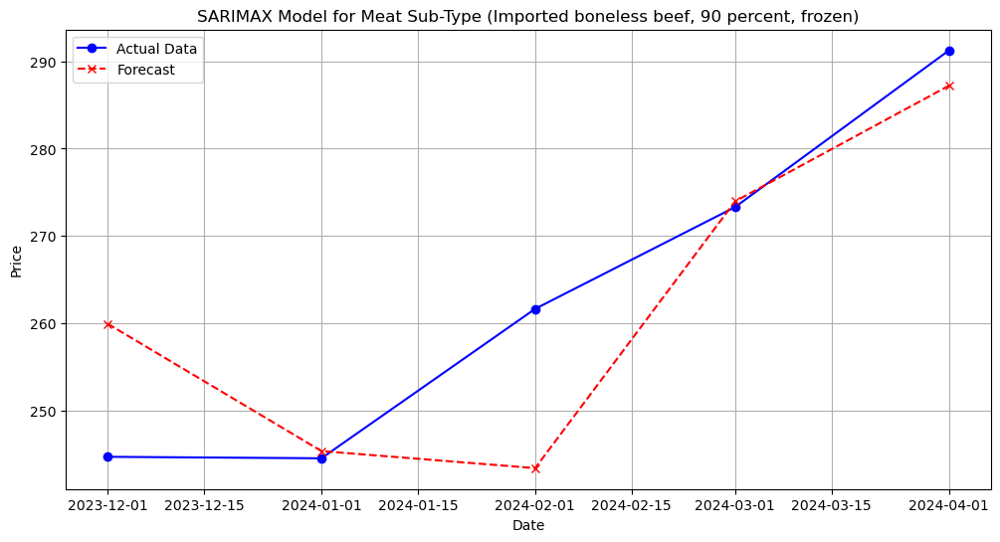

In [33]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Imported boneless beef, 90 percent, frozen']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(0, 1, 0), seasonal_order=(0, 1, 0, 46))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Imported boneless beef, 90 percent, frozen)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.8062


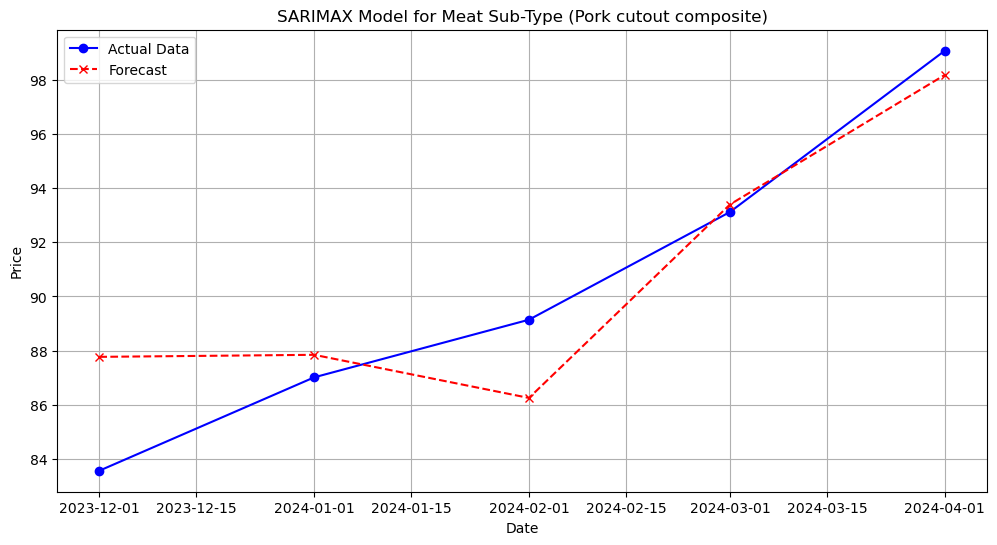

In [37]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Pork cutout composite']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 0), seasonal_order=(1, 1, 0, 10))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Pork cutout composite)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.9770


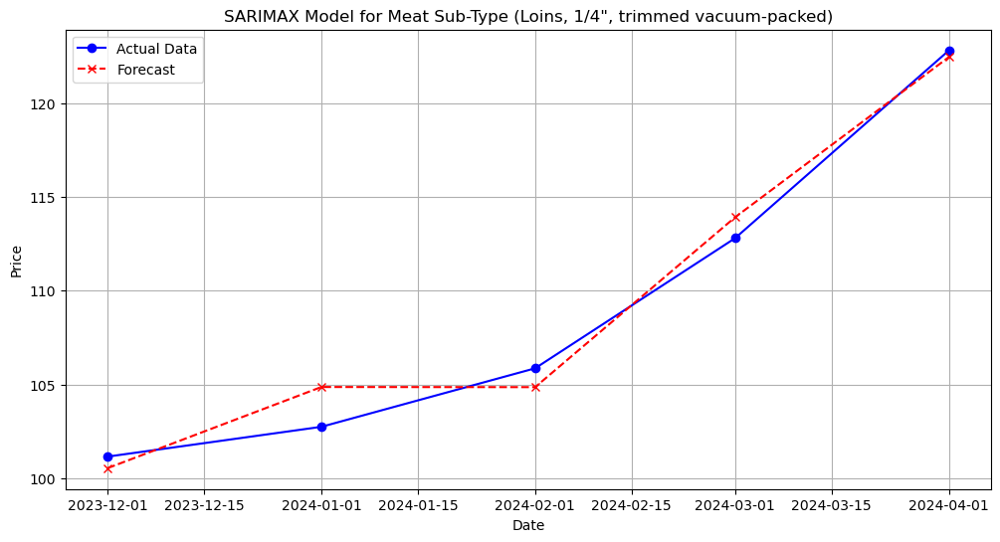

In [38]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Loins, 1/4", trimmed vacuum-packed']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 48))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Loins, 1/4", trimmed vacuum-packed)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.4685


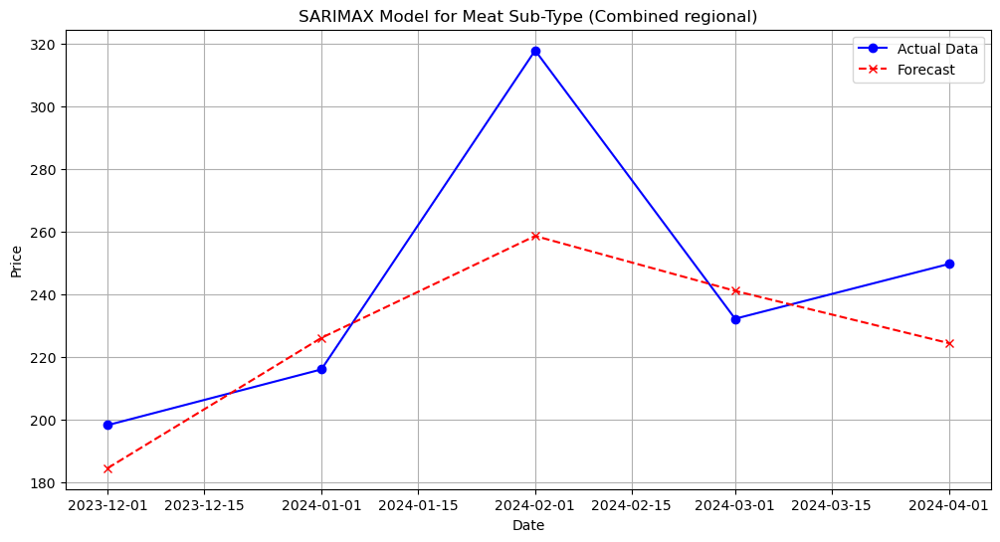

In [43]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Combined regional']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 0), seasonal_order=(1, 1, 0, 23))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Combined regional)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.5448


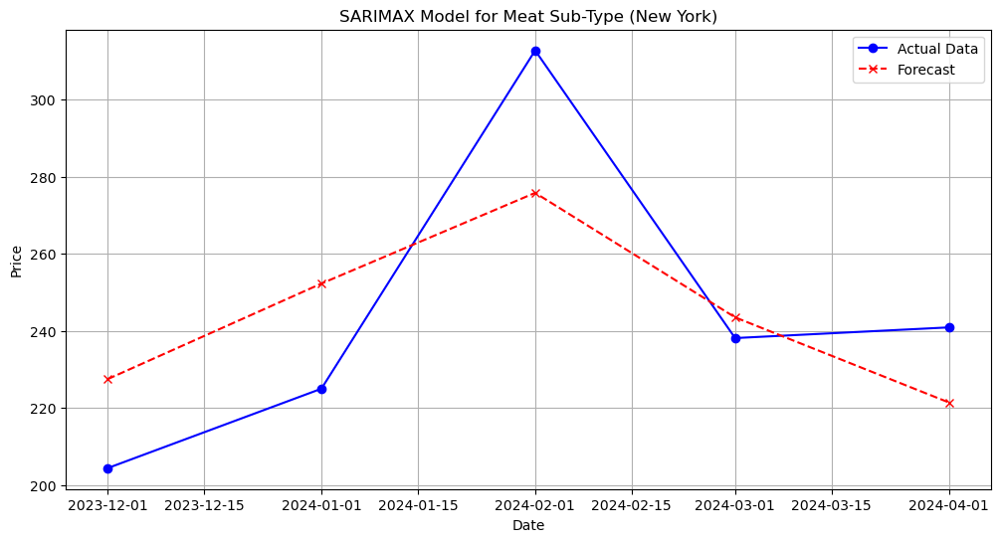

In [44]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='New York']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 0), seasonal_order=(1, 1, 0, 14))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (New York)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.7880


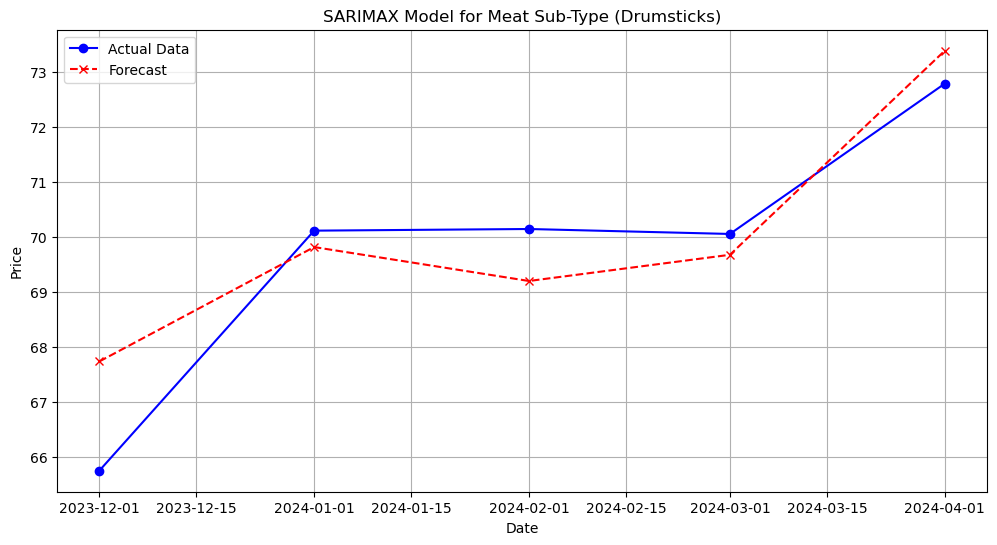

In [49]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Drumsticks']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 35))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Drumsticks)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

R² score: 0.8084


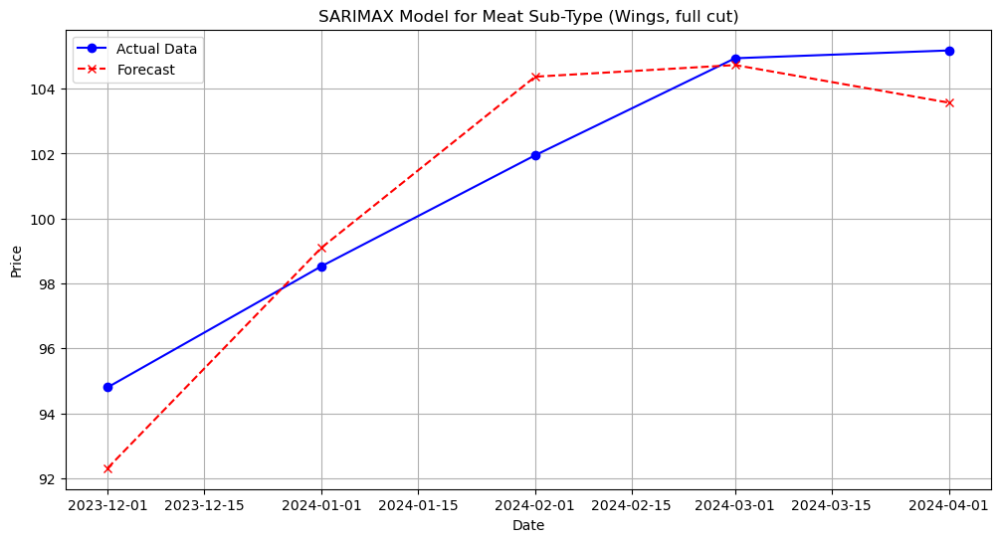

In [50]:
#Checking plot for each meat sub type
subtype_price_data = meat_data[meat_data['Meat  Sub-Type']=='Wings, full cut']

meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]

# split train and test data
y_train = meat_data_price[:-5]
y_test = meat_data_price[-5:]

# Fit the SARIMAX model
model = SARIMAX(y_train, order=(0, 1, 0), seasonal_order=(0, 1, 0, 38))
model_fit = model.fit(disp=False)

# Forecast
pred = model_fit.forecast(steps=5)

# Calculate R² score
r2 = r2_score(y_test, pred)
print(f'R² score: {r2:.4f}')

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(y_test.index, y_test, label='Actual Data', marker='o', color='blue')
plt.plot(y_test.index, pred, label='Forecast', linestyle='--', marker='x', color='red')
plt.title('SARIMAX Model for Meat Sub-Type (Wings, full cut)')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Incorportion External Feature

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
P: 1
Q: 0
Seasonal m: 34
Best R² Score: 0.8942240803509203
Best RMSE: 0.01585265829004928
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
P: 0
Q: 0
Seasonal m: 46
Best R² Score: 0.6871867869234813
Best RMSE: 0.045627193468407254
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
P: 1
Q: 0
Seasonal m: 9
Best R² Score: 0.9136338322708464
Best RMSE: 0.017895911105127976
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
P: 0
Q: 1
Seasonal m: 19
Best R² Score: 0.9264304583989764
Best RMSE: 0.017985891317898288
Meat Type: Drumsticks
Best parameters for 5-month prediction:
P: 0
Q: 1
Seasonal m: 35
Best R² Score: 0.766419033335412
Best RMSE: 0.01088845592153309
Meat Type: Wings, full cut
Best parameters for 5-month prediction:
P: 1
Q: 1
Seasonal m: 38
Best R² Score: 0.892039905919249
Best RMSE:

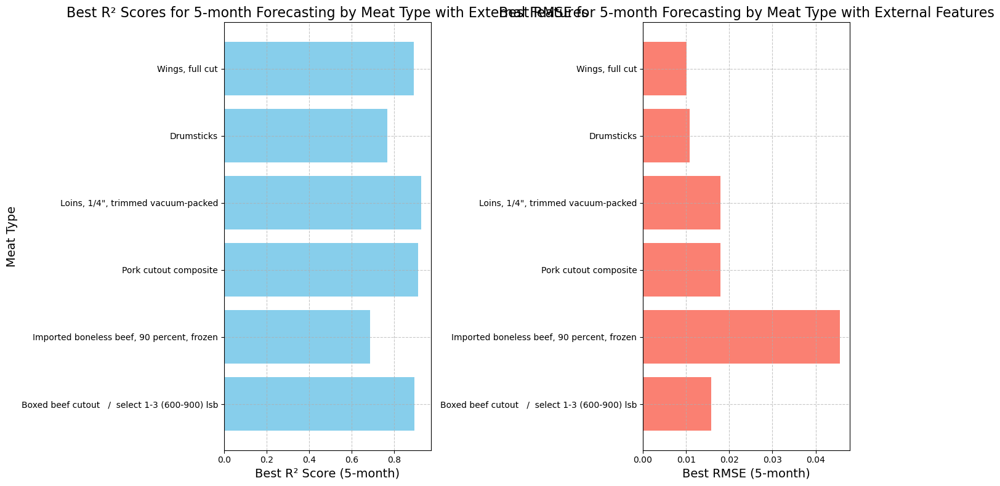

In [86]:
# Using External Feature for 5 Months
warnings.filterwarnings('ignore')

# List of selected subtypes
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
     'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    scaler_price = MinMaxScaler()
    meat_data_price = scaler_price.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    y_train = meat_data_price[:-5]
    y_test = meat_data_price[-5:]
    
    # Adding and scaling external features
    data = meat_data_External_Feature[["Meat  Sub-Type", "TAVG", "CPI", "Sorghum Price"]]
    subtype = data[data['Meat  Sub-Type'] == stype]
    external_features = subtype[["TAVG", "CPI", "Sorghum Price"]]
    
    # Scale the external features
    scaler_features = MinMaxScaler()
    external_features_scaled = scaler_features.fit_transform(external_features)
    
    exog_train = external_features_scaled[:-5]
    exog_test = external_features_scaled[-5:]

    r2_scr_final = 0
    rmse_final = float('inf')

    for i in range(0, 2):
        for j in range(0, 2):
            for k in range(2, 52): 
                
                model = SARIMAX(y_train, exog=exog_train, order=(i, 1, j), seasonal_order=(i, 1, j, k))
                model_fit = model.fit(disp=False)
                
                pred = model_fit.forecast(steps=5, exog=exog_test)
                
                r2_scr = r2_score(y_test, pred)
                rmse = np.sqrt(mean_squared_error(y_test, pred))
        
                if (r2_scr > r2_scr_final):
                    r2_scr_final = r2_scr
                    rmse_final = rmse
                    pval = i
                    qval = j
                    sval = k

    # Store the best parameters, R² score, and RMSE
    results.append({
        'Meat Type': stype,
        'Best P': pval,
        'Best Q': qval,
        'Best Seasonal m': sval,
        'Best R² Score': r2_scr_final,
        'Best RMSE': rmse_final
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("P:", pval)
    print("Q:", qval)
    print("Seasonal m:", sval)
    print("Best R² Score:", r2_scr_final)
    print("Best RMSE:", rmse_final)

# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Processing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb
R² score: 0.8942


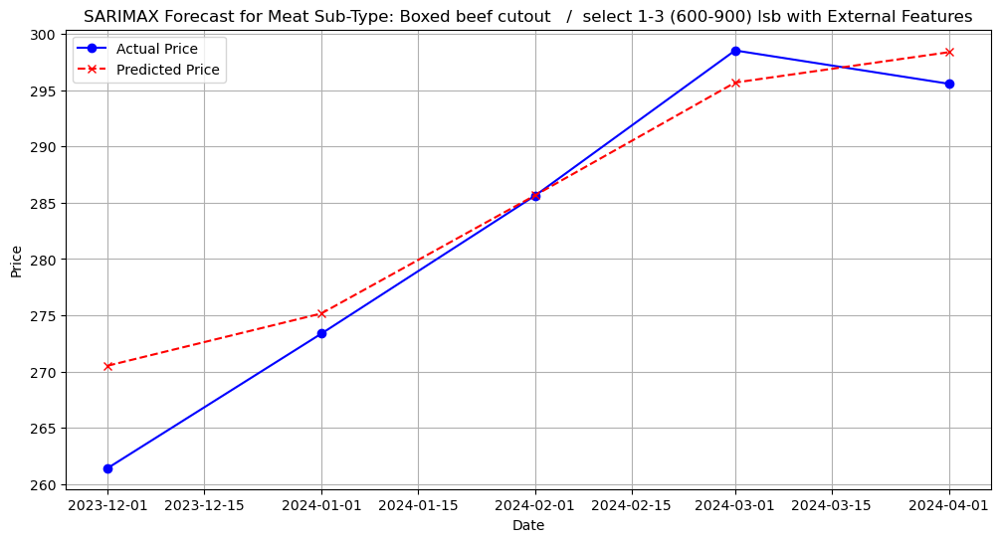

Processing subtype: Imported boneless beef, 90 percent, frozen
R² score: 0.6872


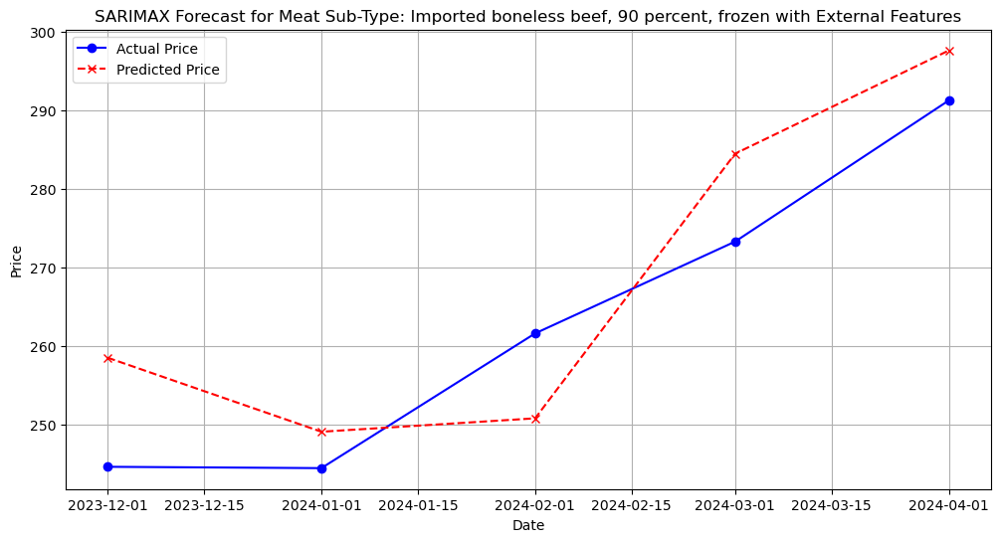

Processing subtype: Pork cutout composite
R² score: 0.9136


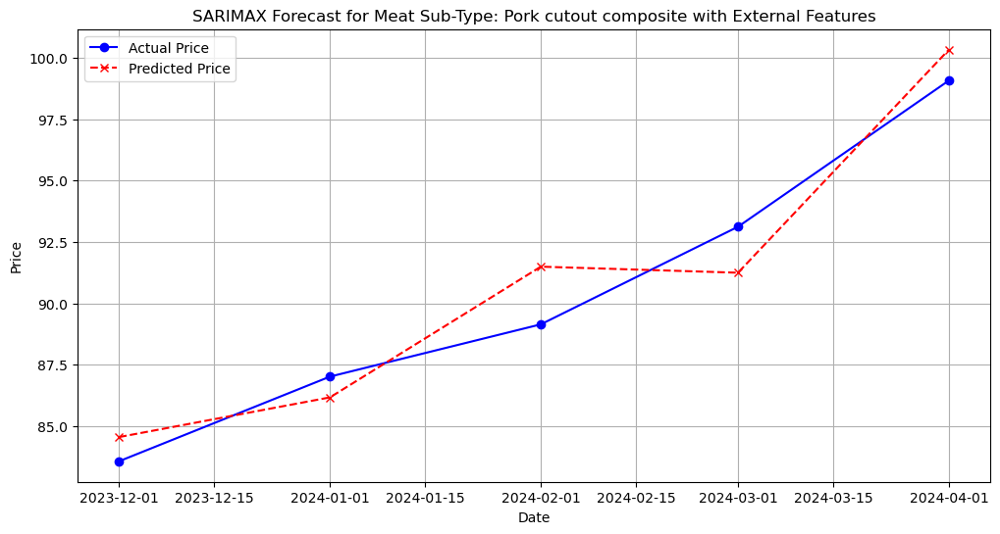

Processing subtype: Loins, 1/4", trimmed vacuum-packed
R² score: 0.9264


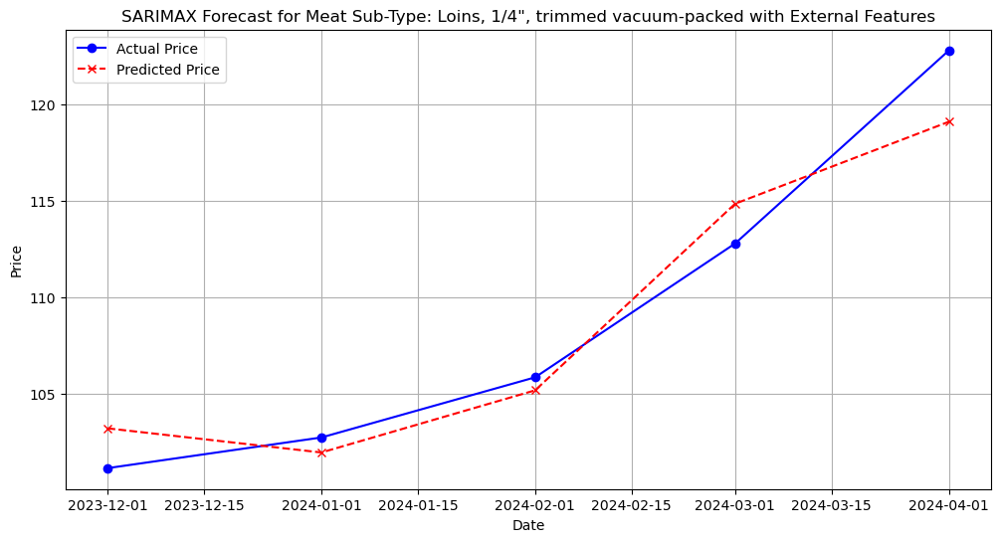

Processing subtype: Drumsticks
R² score: 0.7664


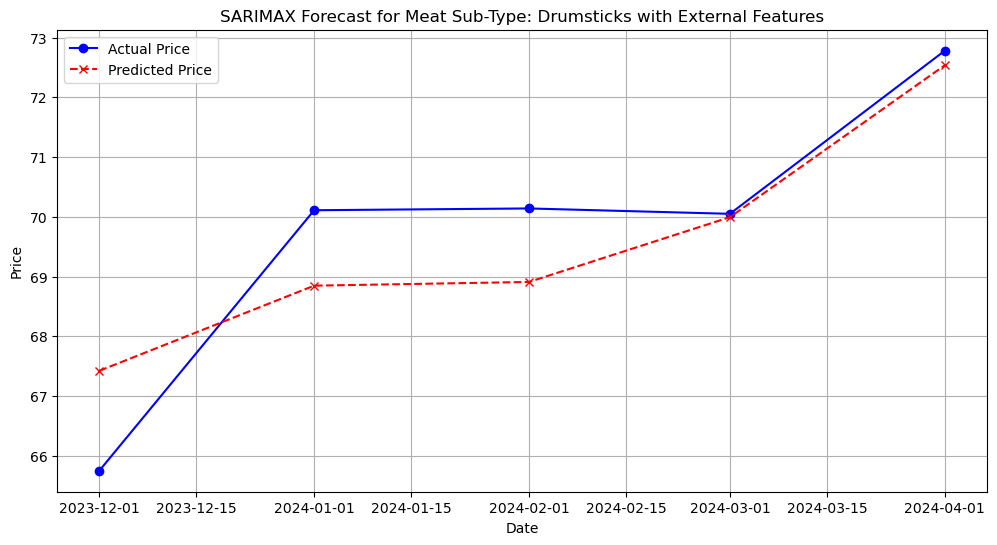

Processing subtype: Wings, full cut
R² score: 0.8920


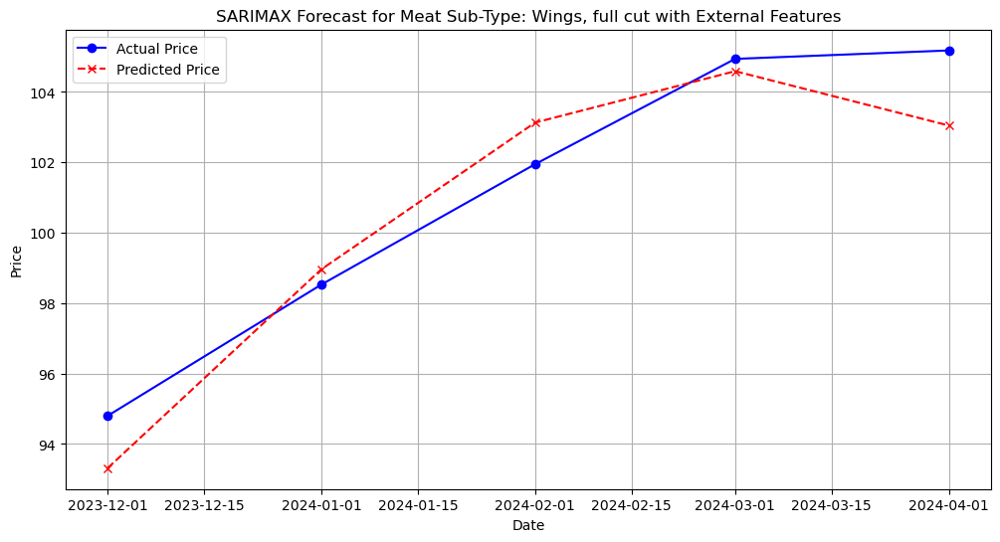

In [99]:
# Plot based on the best parameters for each meat sub type

best_params = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': (1, 0, 34),
    'Imported boneless beef, 90 percent, frozen': (0, 0, 46),
    'Pork cutout composite': (1, 0, 9),
    'Loins, 1/4", trimmed vacuum-packed': (0, 1, 19),
    'Drumsticks': (0, 1, 35),
    'Wings, full cut': (1, 1, 38)
}

# Iterate over each subtype
for stype in best_params.keys():
    print(f'Processing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    scaler_price = MinMaxScaler()
    meat_data_price = scaler_price.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    y_train = meat_data_price[:-5]
    y_test = meat_data_price[-5:]
    
    # Adding and scaling external features
    data = meat_data_External_Feature[["Meat  Sub-Type", "TAVG", "CPI", "Sorghum Price"]]
    subtype = data[data['Meat  Sub-Type'] == stype]
    external_features = subtype[["TAVG", "CPI", "Sorghum Price"]]
    
    # Scale the external features
    scaler_features = MinMaxScaler()
    external_features_scaled = scaler_features.fit_transform(external_features)
    
    exog_train = external_features_scaled[:-5]
    exog_test = external_features_scaled[-5:]
    
    # Get best parameters
    p, q, seasonal_m = best_params[stype]
    
    # Fit the SARIMAX model with the best parameters
    best_model = SARIMAX(y_train, exog=exog_train, order=(p, 1, q), seasonal_order=(p, 1, q, seasonal_m))
    best_model_fit = best_model.fit(disp=False)
    
    # Forecast using the best model
    forecast = best_model_fit.forecast(steps=5, exog=exog_test)
    
    # Rescale forecast to original price scale
    forecast_rescaled = scaler_price.inverse_transform(forecast.reshape(-1, 1))
    y_test_rescaled = scaler_price.inverse_transform(y_test)
    
    # Calculate R² score
    r2 = r2_score(y_test_rescaled, forecast_rescaled)
    
    # Calculate RMSE
    rmse = np.sqrt(mean_squared_error(y_test_rescaled, forecast_rescaled))
    
    # Print R² score and RMSE
    print(f'R² score: {r2:.4f}')
    

    plt.figure(figsize=(12, 6))
    plt.plot(y_test_plot.index, y_test_rescaled, label='Actual Price', marker='o', color='blue')
    plt.plot(y_test_plot.index, forecast_rescaled, linestyle='--', marker='x', label='Predicted Price', color='red')
    plt.title(f'SARIMAX Forecast for Meat Sub-Type: {stype} with External Features')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.grid(True)     
    plt.show()

## Some preprocessing done before adding them into Machine Learning Models

In [ ]:
# Scaling the Meat Sub Type Dataset

In [33]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler()
meat_data_price_train=scaler.fit_transform(meat_data_price)

In [ ]:
# Creating Lag values for 5 months

In [34]:
def array_arrangement(arr_meat, months):
    
    x = []
    y = []
    t = months
    for i in range(len(arr_meat) - t):
        
       x.append(arr_meat[i:i + t])
       y.append(arr_meat[[i + t]])
    
    x = np.array(x)
    x=x.reshape(x.shape[0],x.shape[1])
    y = np.array(y)
    y=y.reshape(y.shape[0],1)
    
    return x,y

In [35]:
x,y = array_arrangement(meat_data_price_train,5)

In [11]:
# x.shape

(287, 5)

In [12]:
# y.shape

(287, 1)

In [ ]:
# Split the array meat price into train and test

In [70]:
X_train = x[:-5]
X_test = x[-5:] 
y_train = y[:-5]
y_test = y[-5:]

In [12]:
 X_train

array([[0.0203958 , 0.01315967, 0.03278137, 0.04971055, 0.05452342],
       [0.01315967, 0.03278137, 0.04971055, 0.05452342, 0.04920571],
       [0.03278137, 0.04971055, 0.05452342, 0.04920571, 0.02413166],
       ...,
       [0.64573236, 0.65838718, 0.73569602, 0.67699919, 0.67154685],
       [0.65838718, 0.73569602, 0.67699919, 0.67154685, 0.67053716],
       [0.73569602, 0.67699919, 0.67154685, 0.67053716, 0.65434841]])

In [13]:
y_train

array([[0.04920571],
       [0.02413166],
       [0.00848142],
       [0.        ],
       [0.01312601],
       [0.03153608],
       [0.05967286],
       [0.07101508],
       [0.06795234],
       [0.07034195],
       [0.06815428],
       [0.06849085],
       [0.06105277],
       [0.03449785],
       [0.03877221],
       [0.03574313],
       [0.02440092],
       [0.00764001],
       [0.01467421],
       [0.01114028],
       [0.00959208],
       [0.03991653],
       [0.02668955],
       [0.02174206],
       [0.01810716],
       [0.00403877],
       [0.0075727 ],
       [0.01060178],
       [0.0099623 ],
       [0.02601642],
       [0.04634491],
       [0.06700996],
       [0.06761578],
       [0.05947092],
       [0.08195342],
       [0.11025848],
       [0.1093161 ],
       [0.07219305],
       [0.10510905],
       [0.16141626],
       [0.22677706],
       [0.19678918],
       [0.15155493],
       [0.09608912],
       [0.06290388],
       [0.10790253],
       [0.16585891],
       [0.158

In [181]:
# meat_data.isnull().sum()

Period                   0
Meat Type                0
Meat  Sub-Type           0
Price Dollars/cwt/doz    0
Year                     0
Month                    0
YearMonth                0
PRCP                     0
SNOW                     0
TAVG                     0
DisasterCount            0
CPI                      0
Unemployment Rate        0
GDP Value                0
Corn Price               0
Sorghum Price            0
dtype: int64

### Just Created Basic Understanding Of How The Lags Values Work External Feature

In [ ]:
# selected_subtypes = [
#     'Boxed beef cutout   /  choice 1-3 (600-900) lsb',
#     # 'Boxed beef cutout   /  select 1-3 (600-900) lsb',
#     # 'Boneless beef, 90 percent, fresh',
#     # 'Imported boneless beef, 90 percent, frozen',
#     # 'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
#     # 'Bellies, 12-14 lb, skin on', 'Hams, 23-27 lb, trimmed selected',
#     # 'Trimmings, 72% combo','Combined regional', 'New York','55-65 lb, Choice',
#     # 'Hens, 8-16 lb', 'Toms, 16-24 lb',
#     # 'Breast, 4-8 lb', 'Drumsticks', 'Wings, full cut']

# for stype in selected_subtypes:    
#     print(stype)
#     subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
#     scaler= MinMaxScaler()
#     meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
#     meat_data_price = scaler.fit_transform(meat_data_price)
    
#     n_est = [2,4,5,8,10,15,20]
#     r2_scr_final = 0
    
#     for i in range(1,51):
#         x,y = array_arrangement(meat_data_price,i) 
#         X_train = x[:-5]
#         X_test = x[-5:]
#         y_train = y[:-5]
#         y_test = y[-5:]

In [182]:
# selected_subtypes = [
#     'Boxed beef cutout   /  choice 1-3 (600-900) lsb']

In [183]:
# subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == "Boxed beef cutout   /  choice 1-3 (600-900) lsb"]
# scaler= MinMaxScaler()
# meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
# meat_data_price = scaler.fit_transform(meat_data_price)

In [184]:
# x,y = array_arrangement(meat_data_price,3) 
# X_train = x[:-5]
# X_test = x[-5:]
# y_train = y[:-5]
# y_test = y[-5:]

In [185]:
# X_train

array([[0.0203958 , 0.01315967, 0.03278137],
       [0.01315967, 0.03278137, 0.04971055],
       [0.03278137, 0.04971055, 0.05452342],
       [0.04971055, 0.05452342, 0.04920571],
       [0.05452342, 0.04920571, 0.02413166],
       [0.04920571, 0.02413166, 0.00848142],
       [0.02413166, 0.00848142, 0.        ],
       [0.00848142, 0.        , 0.01312601],
       [0.        , 0.01312601, 0.03153608],
       [0.01312601, 0.03153608, 0.05967286],
       [0.03153608, 0.05967286, 0.07101508],
       [0.05967286, 0.07101508, 0.06795234],
       [0.07101508, 0.06795234, 0.07034195],
       [0.06795234, 0.07034195, 0.06815428],
       [0.07034195, 0.06815428, 0.06849085],
       [0.06815428, 0.06849085, 0.06105277],
       [0.06849085, 0.06105277, 0.03449785],
       [0.06105277, 0.03449785, 0.03877221],
       [0.03449785, 0.03877221, 0.03574313],
       [0.03877221, 0.03574313, 0.02440092],
       [0.03574313, 0.02440092, 0.00764001],
       [0.02440092, 0.00764001, 0.01467421],
       [0.

In [186]:
# data=meat_data[["Meat  Sub-Type","PRCP",	"SNOW"]]

In [187]:
# data

,Meat Sub-Type,PRCP,SNOW
0,Boxed beef cutout / choice 1-3 (600-900) lsb,0.143600,0.133333
1,Boxed beef cutout / choice 1-3 (600-900) lsb,0.278621,0.000000
2,Boxed beef cutout / choice 1-3 (600-900) lsb,0.074516,0.000000
3,Boxed beef cutout / choice 1-3 (600-900) lsb,0.074286,0.000000
4,Boxed beef cutout / choice 1-3 (600-900) lsb,0.103333,0.000000
...,...,...,...
8171,New York,0.072000,0.000000
8172,New York,0.185484,0.046429
8173,New York,0.047500,0.010345
8174,New York,0.076333,0.000000


In [188]:
# subtype = data[data['Meat  Sub-Type'] == "Boxed beef cutout   /  choice 1-3 (600-900) lsb"]

In [189]:
# subtype

,Meat Sub-Type,PRCP,SNOW
0,Boxed beef cutout / choice 1-3 (600-900) lsb,0.143600,0.133333
1,Boxed beef cutout / choice 1-3 (600-900) lsb,0.278621,0.000000
2,Boxed beef cutout / choice 1-3 (600-900) lsb,0.074516,0.000000
3,Boxed beef cutout / choice 1-3 (600-900) lsb,0.074286,0.000000
4,Boxed beef cutout / choice 1-3 (600-900) lsb,0.103333,0.000000
...,...,...,...
287,Boxed beef cutout / choice 1-3 (600-900) lsb,0.072000,0.000000
288,Boxed beef cutout / choice 1-3 (600-900) lsb,0.185484,0.046429
289,Boxed beef cutout / choice 1-3 (600-900) lsb,0.047500,0.010345
290,Boxed beef cutout / choice 1-3 (600-900) lsb,0.076333,0.000000


In [190]:
# subtype=subtype[["PRCP",	"SNOW"]]

In [191]:
# subtype=subtype[3:]

In [192]:
# subtype_train=subtype[:-5]

In [193]:
# subtype_test=subtype[-5:]

In [194]:
# scaler= MinMaxScaler()
# meat_data_price_train = scaler.fit_transform(subtype_train)
# meat_data_price_test = scaler.fit_transform(subtype_test)

In [195]:
# len(meat_data_price_1)

284

In [196]:
# array=np.concatenate((X_train,meat_data_price_1),axis=1)

In [197]:
# model = RandomForestRegressor()
# model.fit(array, y_train)

RandomForestRegressor()

In [198]:
# future_steps = 5
# # Last TIME_STEPS values from the test set to start forecasting
# X_train_last = X_train[-1]
# # Forecast future values
# future_forecast = []

# for a in range(future_steps):
#     # Predict next value based on the last sequence
#     X_train_last =np.concatenate((X_train_last,meat_data_price_test[a]),axis=0)
#     future_prediction = model.predict(X_train_last.reshape(1,-1))
#     future_forecast.append(future_prediction[0])
#     # Update the last sequence by removing the first element and adding the predicted value
#     X_train_last=X_train_last[:3]
#     X_train_last = np.roll(X_train_last, -1)
#     X_train_last[-1] = future_prediction
# r2_scr = r2_score(y_test, future_forecast)

In [199]:
# r2_scr

0.32753665814795363

In [167]:
# X_train_last = np.array(X_train[-1])
# X_train_last

array([0.67154685, 0.67053716, 0.65434841])

In [168]:
# X_train_last =np.concatenate((X_train_last,meat_data_price_test[0]),axis=0)
# X_train_last

array([0.67154685, 0.67053716, 0.65434841, 0.16179337, 0.        ])

In [169]:
# X_train_last=X_train_last[:3]
# X_train_last

array([0.67154685, 0.67053716, 0.65434841])

In [165]:
# meat_data_price_test[0]

array([0.16179337, 0.        ])

In [166]:
# np.concatenate((X_train_last,meat_data_price_test[0]),axis=0)

array([0.67154685, 0.67053716, 0.65434841, 0.16179337, 0.        ])

In [30]:
#External Feature dataset
meat_data = pd.read_csv("merged_data.csv")
meat_data

,Period,Meat Type,Meat Sub-Type,Price Dollars/cwt/doz,Year,Month,YearMonth,PRCP,SNOW,TAVG,DisasterCount,CPI,Unemployment Rate,GDP Value,Corn Price,Sorghum Price
0,2000-01-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,114.74,2000,1,2000-01,0.143600,0.133333,29.566667,137.0,168.800,4.0,13812.379328,1.91,1.60
1,2000-02-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,112.59,2000,2,2000-02,0.278621,0.000000,41.327586,183.0,169.800,4.1,13871.521334,1.98,1.71
2,2000-03-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,118.42,2000,3,2000-03,0.074516,0.000000,46.839286,11.0,171.200,4.0,13951.023825,2.03,1.80
3,2000-04-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,123.45,2000,4,2000-04,0.074286,0.000000,52.326923,28.0,171.300,3.8,14133.222640,2.03,1.81
4,2000-05-01,"Beef, Central U.S.",Boxed beef cutout / choice 1-3 (600-900) lsb,124.88,2000,5,2000-05,0.103333,0.000000,67.293103,93.0,171.500,4.0,14113.438997,2.11,1.86
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8171,2023-12-01,"Eggs, Grade A, large",New York,204.40,2023,12,2023-12,0.072000,0.000000,41.057692,14.0,306.746,3.7,22848.178577,4.80,4.87
8172,2024-01-01,"Eggs, Grade A, large",New York,225.00,2024,1,2024-01,0.185484,0.046429,30.344828,23.0,308.417,3.7,22695.431962,4.74,4.89
8173,2024-02-01,"Eggs, Grade A, large",New York,312.75,2024,2,2024-02,0.047500,0.010345,44.740000,33.0,310.326,3.9,22840.712881,4.36,4.74
8174,2024-03-01,"Eggs, Grade A, large",New York,238.14,2024,3,2024-03,0.076333,0.000000,51.240000,24.0,312.332,3.8,22777.018991,4.36,4.74


# Random Forest Model

In [59]:
#from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
model.fit(X_train, y_train)

RandomForestRegressor()

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 49
n_estimators: 20
Best R² Score (5-month): 0.5265841360834458
Best RMSE (5-month): 0.03353745452479002
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 38
n_estimators: 2
Best R² Score (5-month): 0.5358802887535367
Best RMSE (5-month): 0.055577143071325434
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 48
n_estimators: 10
Best R² Score (5-month): 0.913619151375889
Best RMSE (5-month): 0.01789743205270529
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 48
n_estimators: 4
Best R² Score (5-month): 0.9751145408921623
Best RMSE (5-month): 0.010460580078877206
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 49
n_estimators: 8
Best R² Score (5-month): 0.743795776744606
Best RMSE (5-month): 0.01140356687629465
Meat Type

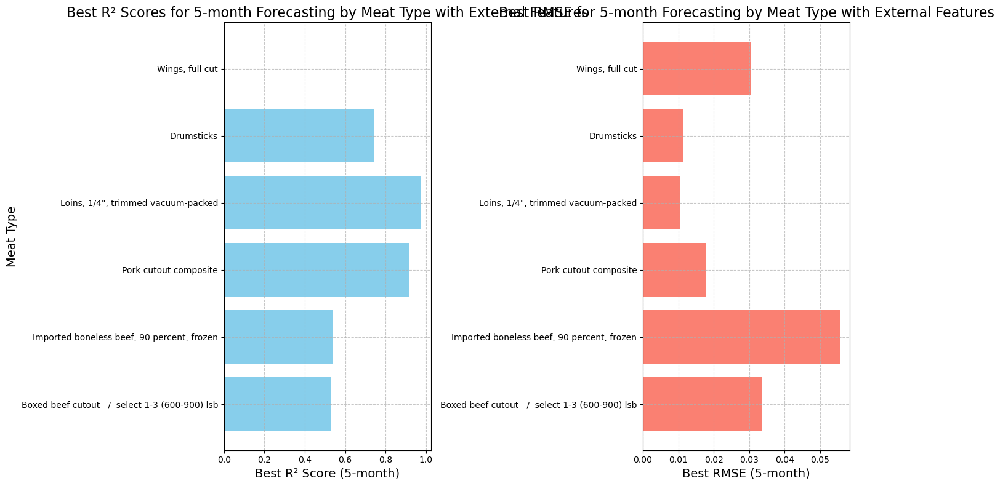

In [107]:
# Working Of Randon Forest Model for 5 Months
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
     'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

for stype in selected_subtypes:    
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    n_est = [2, 4, 5, 8, 10, 15, 20]
    r2_scr_final_5_months = 0 
    rmse_final_5_months = float('inf')
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i) 
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]
    
        for j in n_est:
            model = RandomForestRegressor(n_estimators=j, random_state=10)
            model.fit(X_train, y_train)
            
            # Forecast future values
            future_steps = 5
            X_train_last = X_train[-1]
            future_forecast = []
            
            for _ in range(future_steps):
                future_prediction = model.predict(X_train_last.reshape(1, -1))
                future_forecast.append(future_prediction[0])
                X_train_last = np.roll(X_train_last, -1)
                X_train_last[-1] = future_prediction
            
            # Evaluate performance
            r2_scr = r2_score(y_test, future_forecast)
            rmse = np.sqrt(mean_squared_error(y_test, future_forecast))
           
            if r2_scr > r2_scr_final_5_months:
                r2_scr_final_5_months = r2_scr
                rmse_final_5_months = rmse
                n_est_val_5_months = j
                lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_est_val_5_months,
        'Best R² Score': r2_scr_final_5_months,
        'Best RMSE': rmse_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("n_estimators:", n_est_val_5_months)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    print("Best RMSE (5-month):", rmse_final_5_months)

# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Boxed beef cutout   /  select 1-3 (600-900) lsb
R² Score: 0.5266
RMSE Score: 0.0335


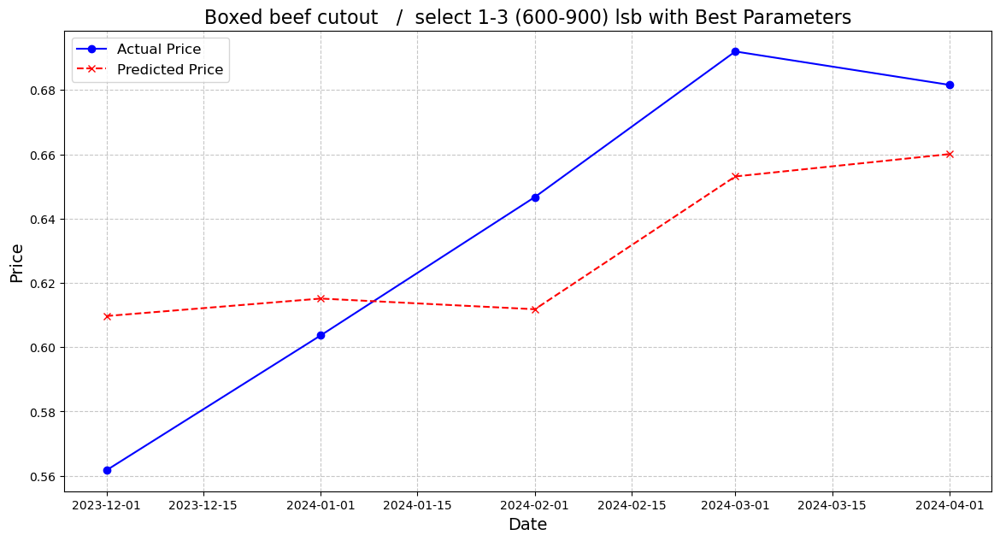

Imported boneless beef, 90 percent, frozen
R² Score: 0.5359
RMSE Score: 0.0556


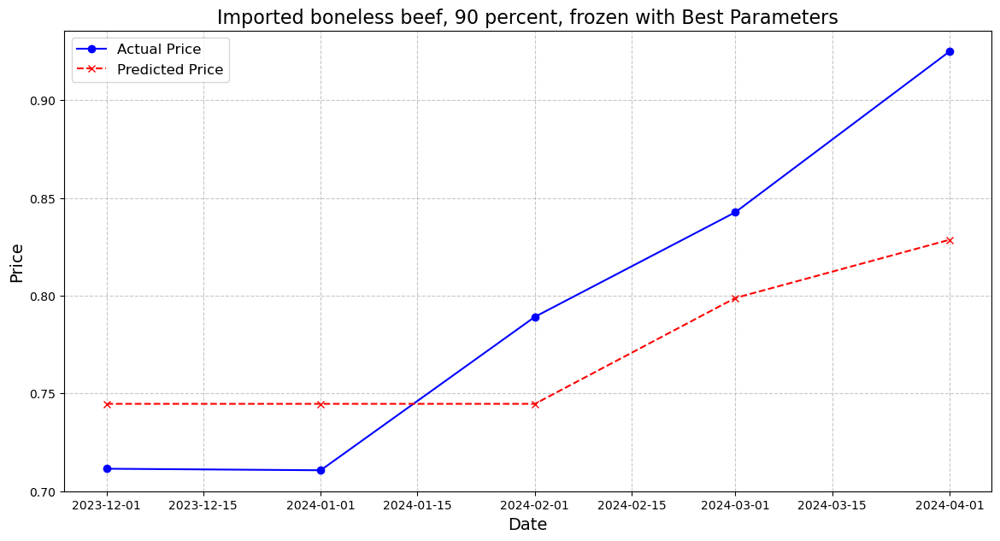

Pork cutout composite
R² Score: 0.9136
RMSE Score: 0.0179


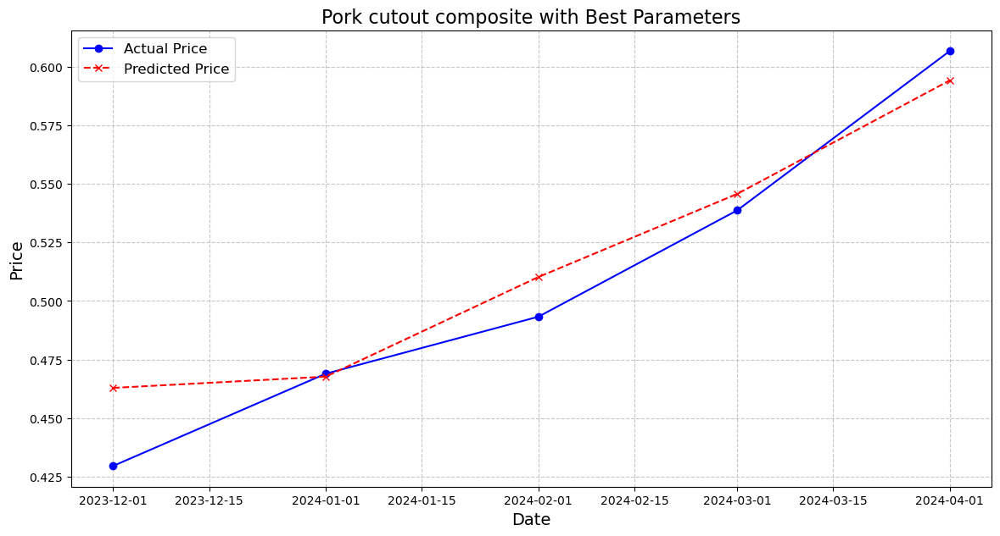

Loins, 1/4", trimmed vacuum-packed
R² Score: 0.9751
RMSE Score: 0.0105


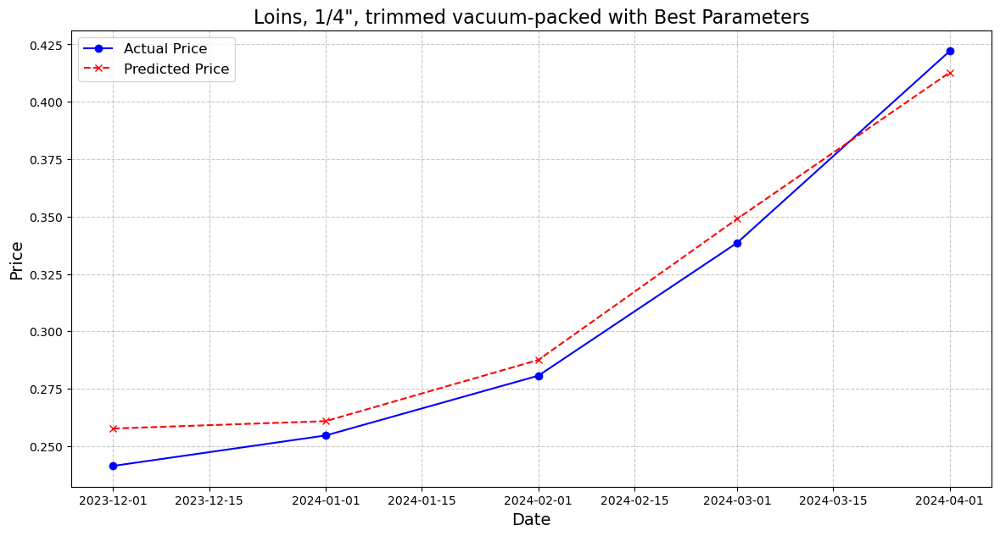

Combined regional
R² Score: 0.4258
RMSE Score: 0.0696


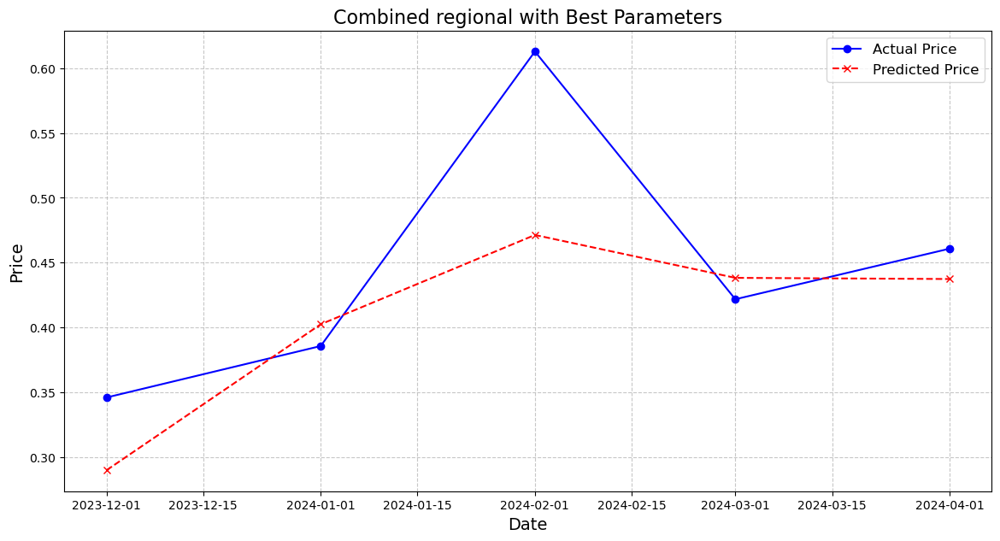

New York
R² Score: 0.5876
RMSE Score: 0.0523


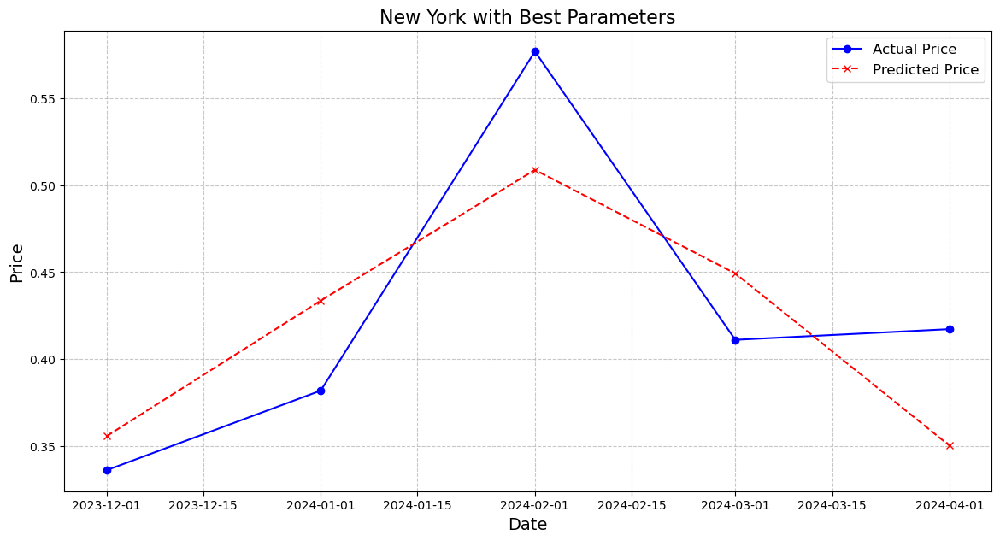

Drumsticks
R² Score: 0.7438
RMSE Score: 0.0114


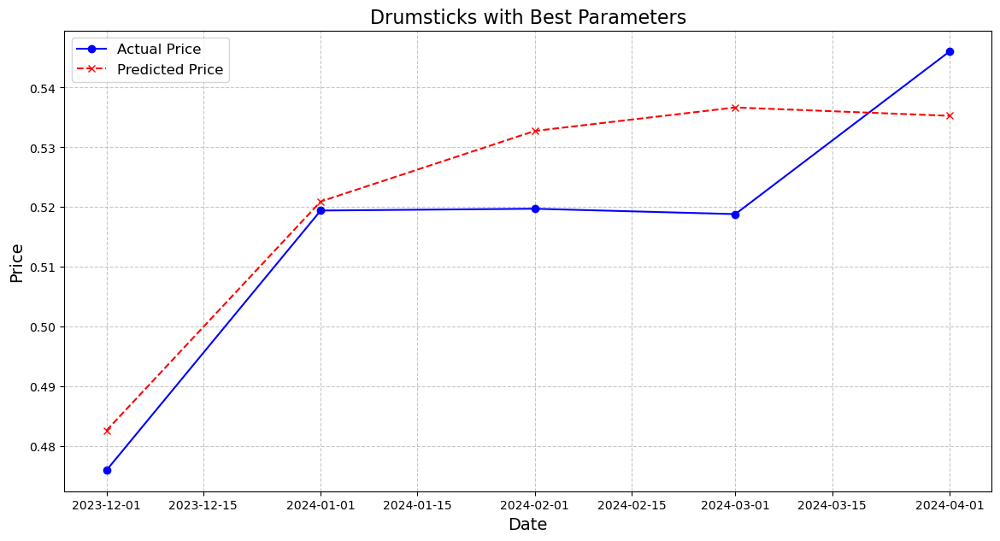

Wings, full cut
R² Score: 0.0010
RMSE Score: 0.0306


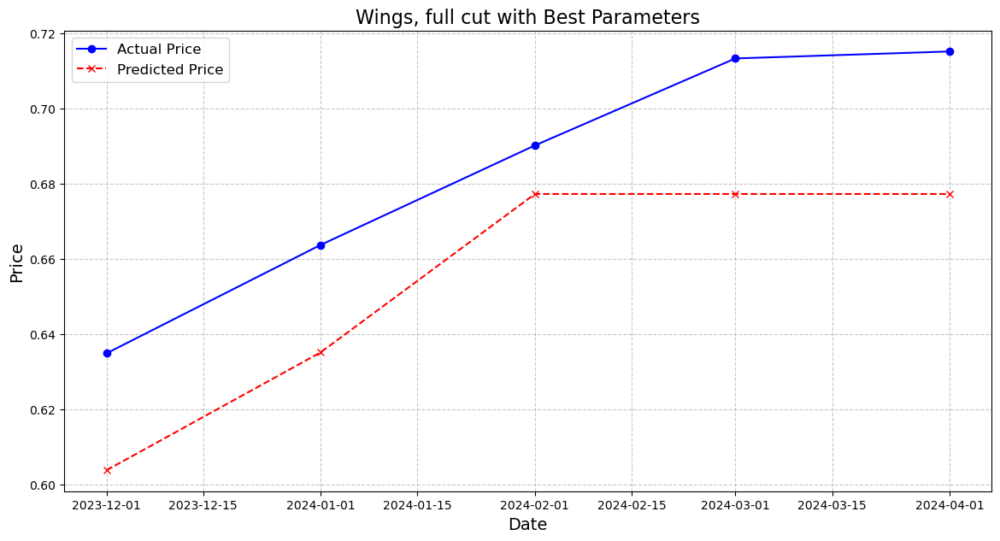

In [122]:
# Plot Random Forest For Each Meat Sub Type

# List of selected subtypes
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Combined regional', 'New York', 'Drumsticks', 'Wings, full cut'
]

# Store results for later plotting
results = []

for stype in selected_subtypes:
    print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    n_est = [2, 4, 5, 8, 10, 15, 20]
    r2_scr_final_5_months = 0
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]
    
        for j in n_est:
            model = RandomForestRegressor(n_estimators=j, random_state=10)
            model.fit(X_train, y_train)
            
            # Forecast future values
            future_steps = 5
            X_train_last = X_train[-1]
            future_forecast = []
            
            for _ in range(future_steps):
                next_pred = model.predict(X_train_last.reshape(1, -1))
                future_forecast.append(next_pred[0])
                X_train_last = np.roll(X_train_last, -1)
                X_train_last[-1] = next_pred
            
            # Evaluate performance
            r2_scr_5_months = r2_score(y_test, future_forecast)
            
            if r2_scr_5_months > r2_scr_final_5_months:
                r2_scr_final_5_months = r2_scr_5_months
                n_est_val_5_months = j
                lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_est_val_5_months,
        'Best R² Score': r2_scr_final_5_months
    })

    # Reprocess data with the best parameters
    best_lags = lags_5_months
    best_n_estimators = n_est_val_5_months
    best_subtype_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    best_meat_data_price = best_subtype_data[['Price Dollars/cwt/doz']]
    best_meat_data_price_scaled = scaler.transform(best_meat_data_price)
    x, y = array_arrangement(best_meat_data_price_scaled, best_lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    model = RandomForestRegressor(n_estimators=best_n_estimators, random_state=10)
    model.fit(X_train, y_train)
    
    future_steps = 5
    X_train_last = X_train[-1]
    future_forecast = []
    
    for _ in range(future_steps):
        future_prediction = model.predict(X_train_last.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Calculate R² and RMSE scores for verification
    r2_scr = r2_score(y_test, future_forecast)
    rmse_scr = np.sqrt(mean_squared_error(y_test, future_forecast))
    
    # Print the actual, predicted values, and scores
    # print("Actual values:", y_test)
    # print("Predicted values:", future_forecast)
    print(f"R² Score: {r2_scr:.4f}")
    print(f"RMSE Score: {rmse_scr:.4f}")
    
    # Plotting
    plt.figure(figsize=(14, 7))
    
     # Plot actual prices
    plt.plot(y_test_plot.index, y_test, label='Actual Price', marker='o', color='blue')
    
    # Plot predicted prices
    plt.plot(y_test_plot.index, future_forecast, linestyle='--', marker='x', label='Predicted Price', color='red')
    
    plt.title(f"{stype} with Best Parameters", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Price", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# External Feature Incorported 

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 17
n_estimators: 4
Best R² Score (5-month): 0.5222923799265897
Best RMSE (5-month): 0.03368912861105699
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 30
n_estimators: 4
Best R² Score (5-month): 0.5761360453564662
Best RMSE (5-month): 0.05311221998194005
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 6
n_estimators: 8
Best R² Score (5-month): 0.8869460592156713
Best RMSE (5-month): 0.02047504391113934
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 6
n_estimators: 2
Best R² Score (5-month): 0.8243571213516613
Best RMSE (5-month): 0.027790618531027857
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 7
n_estimators: 4
Best R² Score (5-month): 0.7263715656373122
Best RMSE (5-month): 0.011784961943306135
Meat Type: W

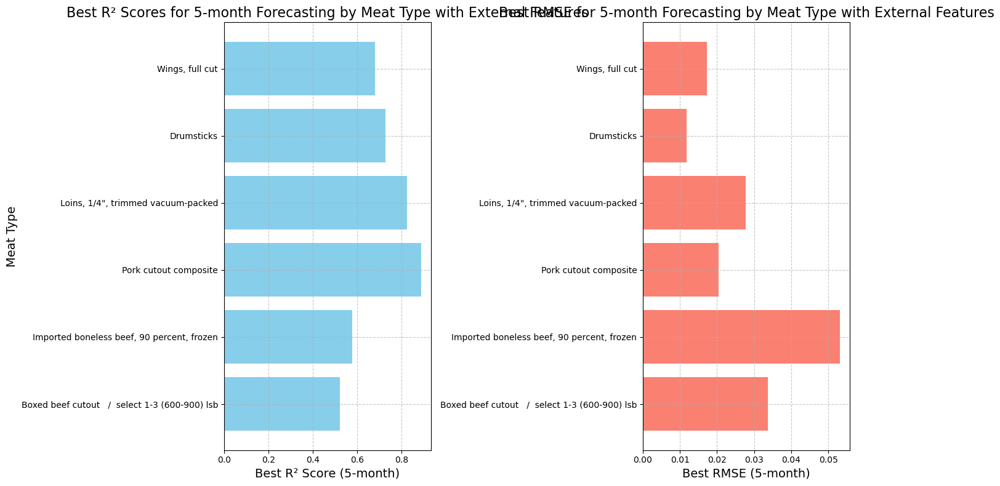

In [111]:
# Random Forest With External Features
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    n_est = [2, 4, 5, 8, 10, 15, 20, 30]
    r2_scr_final_5_months = 0
    rmse_final_5_months = float('inf')
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]

        # Adding external features
        data = meat_data[["Meat  Sub-Type", "TAVG","CPI", "Sorghum Price"]]
        subtype = data[data['Meat  Sub-Type'] == stype]
        subtype = subtype[["TAVG","CPI", "Sorghum Price"]]
        subtype = subtype[i:] 
        subtype_train = subtype[:-5]
        subtype_test = subtype[-5:]
        
        # Fit scaler only on training data
        scaler = MinMaxScaler()
        subtype_train_scaled = scaler.fit_transform(subtype_train)
        subtype_test_scaled = scaler.transform(subtype_test)
        
        # Concatenate external features with training data
        X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
        for j in n_est:
            model = RandomForestRegressor(n_estimators=j, random_state=10)
            model.fit(X_train_augmented, y_train)
            
            # Forecast future values
            future_forecast = []
            X_train_last = X_train[-1]
            
            for a in range(5):
                # Predict next value based on the last sequence
                X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
                future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
                future_forecast.append(future_prediction[0])
                
                # Update the last sequence by removing the first element and adding the predicted value
                X_train_last = X_train_last[:i]
                X_train_last = np.roll(X_train_last, -1)
                X_train_last[-1] = future_prediction
            
            r2_scr = r2_score(y_test, future_forecast)
            rmse = np.sqrt(mean_squared_error(y_test, future_forecast))
           
            if r2_scr > r2_scr_final_5_months:
                r2_scr_final_5_months = r2_scr
                rmse_final_5_months = rmse
                n_est_val_5_months = j
                lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_est_val_5_months,
        'Best R² Score': r2_scr_final_5_months,
        'Best RMSE': rmse_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("n_estimators:", n_est_val_5_months)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    print("Best RMSE (5-month):", rmse_final_5_months)

# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Processing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 17
n_estimators: 4
Best R² Score (5-month): 0.5223
Best RMSE (5-month): 9.5940


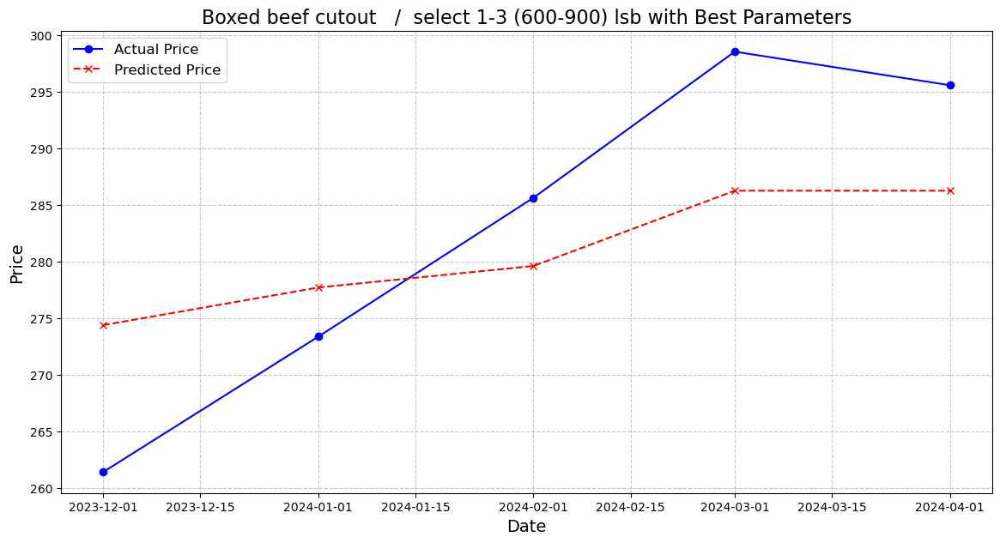

Processing subtype: Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 30
n_estimators: 4
Best R² Score (5-month): 0.5761
Best RMSE (5-month): 11.5888


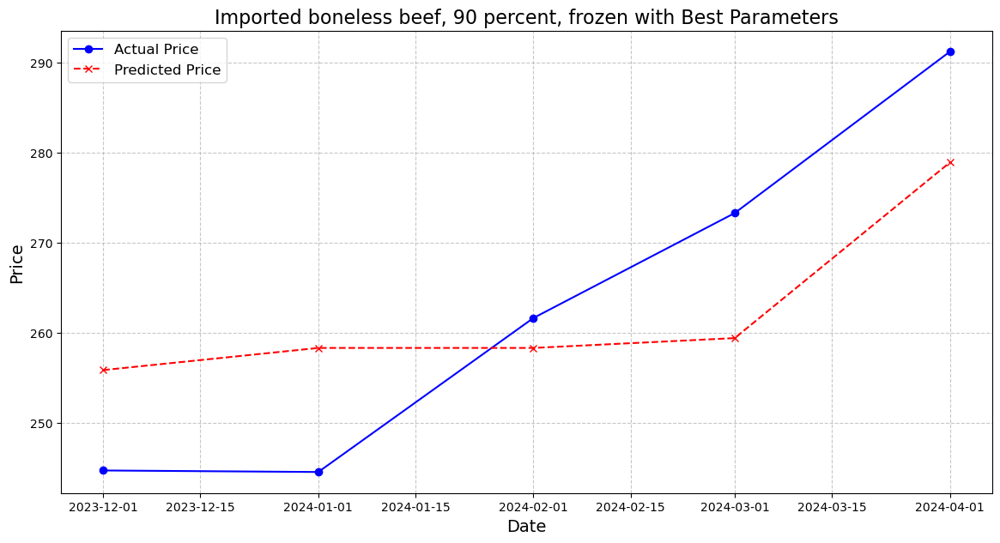

Processing subtype: Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 6
n_estimators: 8
Best R² Score (5-month): 0.8869
Best RMSE (5-month): 1.7957


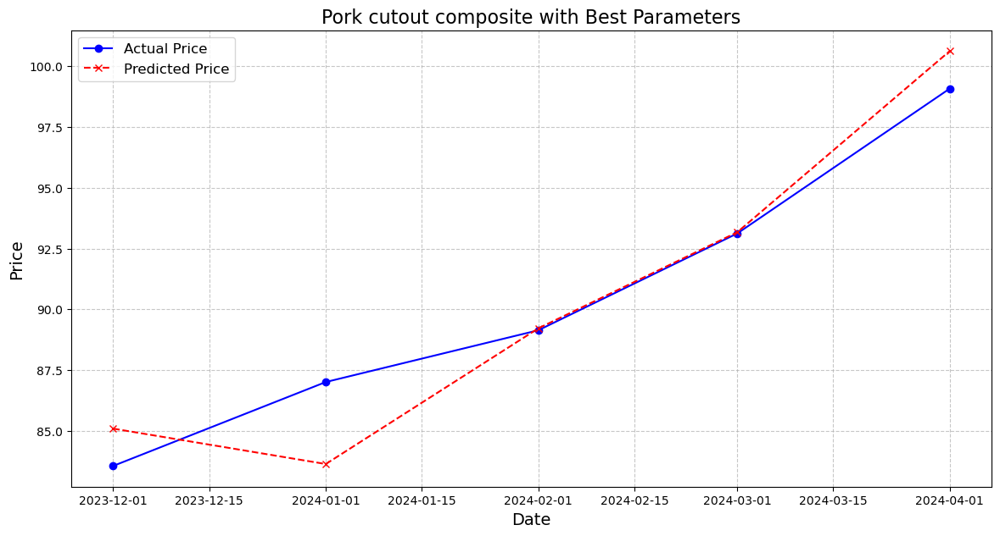

Processing subtype: Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 6
n_estimators: 2
Best R² Score (5-month): 0.8244
Best RMSE (5-month): 3.3307


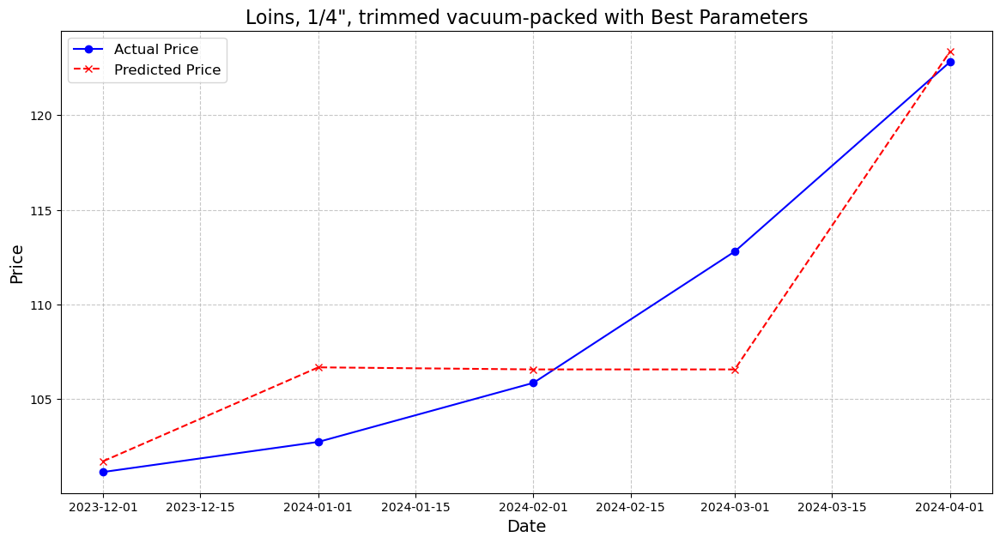

Processing subtype: Drumsticks
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 7
n_estimators: 4
Best R² Score (5-month): 0.7264
Best RMSE (5-month): 1.1825


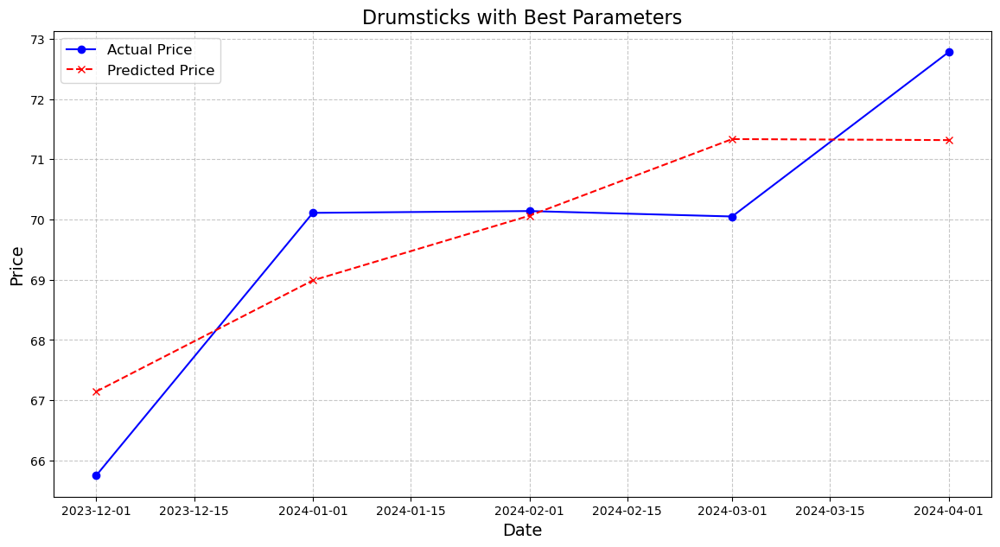

Processing subtype: Wings, full cut
Meat Type: Wings, full cut
Best parameters for 5-month prediction:
Best lags: 3
n_estimators: 5
Best R² Score (5-month): 0.6797
Best RMSE (5-month): 2.2410


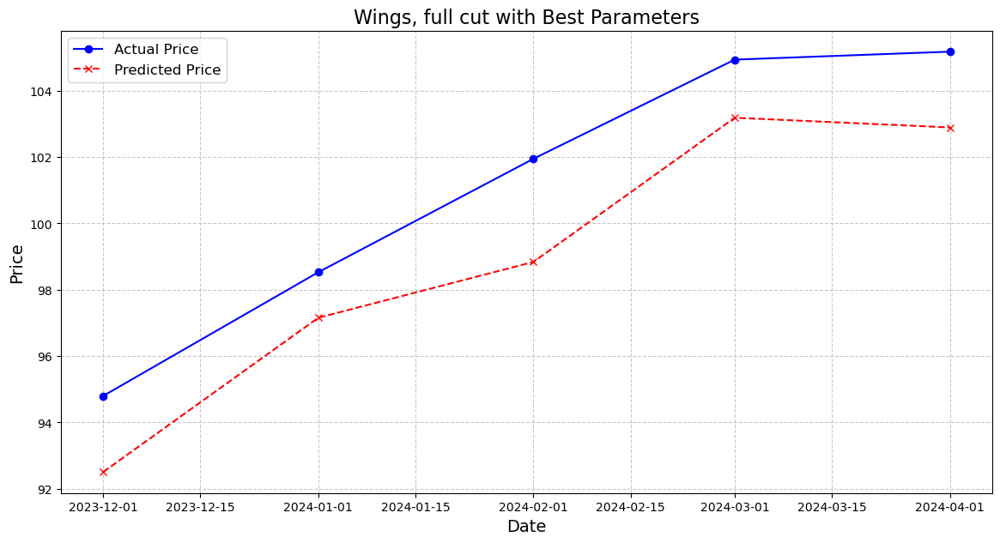

In [123]:
#Plot for best paramerts used for external feature in random forest model

warnings.filterwarnings('ignore')

# Define best parameters for each meat type
best_params = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': (17, 4),
    'Imported boneless beef, 90 percent, frozen': (30, 4),
    'Pork cutout composite': (6, 8),
    'Loins, 1/4", trimmed vacuum-packed': (6, 2),
    'Drumsticks': (7, 4),
    'Wings, full cut': (3, 5)
}

# List of selected subtypes
selected_subtypes = list(best_params.keys())

# Store results for plotting
results = []

for stype in selected_subtypes:
    print(f'Processing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    scaler_price = MinMaxScaler()
    meat_data_price = scaler_price.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    # Set parameters
    lags, n_estimators = best_params[stype]
    
    # Arrange data
    x, y = array_arrangement(meat_data_price, lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    # Adding external features (SNOW)
    data = meat_data[["Meat  Sub-Type", "TAVG", "CPI", "Sorghum Price"]]
    subtype = data[data['Meat  Sub-Type'] == stype]
    subtype = subtype[["TAVG", "CPI", "Sorghum Price"]]
    subtype = subtype[lags:] 
    subtype_train = subtype[:-5]
    subtype_test = subtype[-5:]
    
    # Use a different scaler for external features
    scaler_features = MinMaxScaler()
    subtype_train_scaled = scaler_features.fit_transform(subtype_train)
    subtype_test_scaled = scaler_features.transform(subtype_test)
    
    # Concatenate external features with training data
    X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
    # Fit the RandomForestRegressor model
    model = RandomForestRegressor(n_estimators=n_estimators, random_state=10)
    model.fit(X_train_augmented, y_train)
    
    # Forecast future values
    future_forecast = []
    X_train_last = X_train[-1]
    
    for a in range(5):
        # Predict next value based on the last sequence
        X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
        future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        
        # Update the last sequence by removing the first element and adding the predicted value
        X_train_last = X_train_last[:lags]
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Rescale forecast and actual values to original scale for the target variable
    forecast_rescaled = scaler_price.inverse_transform(np.array(future_forecast).reshape(-1, 1))
    y_test_rescaled = scaler_price.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate R² and RMSE
    r2_scr = r2_score(y_test_rescaled, forecast_rescaled)
    rmse_scr = np.sqrt(mean_squared_error(y_test_rescaled, forecast_rescaled))
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags,
        'Best n_estimators': n_estimators,
        'Best R² Score': r2_scr,
        'Best RMSE': rmse_scr
    })
    
    print(f"Meat Type: {stype}")
    print(f"Best parameters for 5-month prediction:")
    print(f"Best lags: {lags}")
    print(f"n_estimators: {n_estimators}")
    print(f"Best R² Score (5-month): {r2_scr:.4f}")
    print(f"Best RMSE (5-month): {rmse_scr:.4f}")
    
    # Plotting
    plt.figure(figsize=(14, 7))
    
    # Plot actual prices
    plt.plot(y_test_plot.index, y_test_rescaled, label='Actual Price', marker='o', color='blue')
    
    # Plot predicted prices
    plt.plot(y_test_plot.index, forecast_rescaled, linestyle='--', marker='x', label='Predicted Price', color='red')
    
    # Add R² and RMSE to the plot
    plt.title(f"{stype} with Best Parameters", fontsize=16)
    plt.xlabel("Date", fontsize=14)
    plt.ylabel("Price", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 42
n_estimators: 5
Best R² Score (5-month): 0.20353064586775993
Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 30
n_estimators: 4
Best R² Score (5-month): 0.5638146272988858
Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 28
n_estimators: 4
Best R² Score (5-month): 0.8097865245888484
Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 46
n_estimators: 2
Best R² Score (5-month): 0.7235329855096841
Combined regional
Meat Type: Combined regional
Best parameters for 5-month prediction:
Best lags: 50
n_estimators: 4
Best R² Score (5-month): 0.5869808701658069
New York
Meat Type: New York
Best paramete

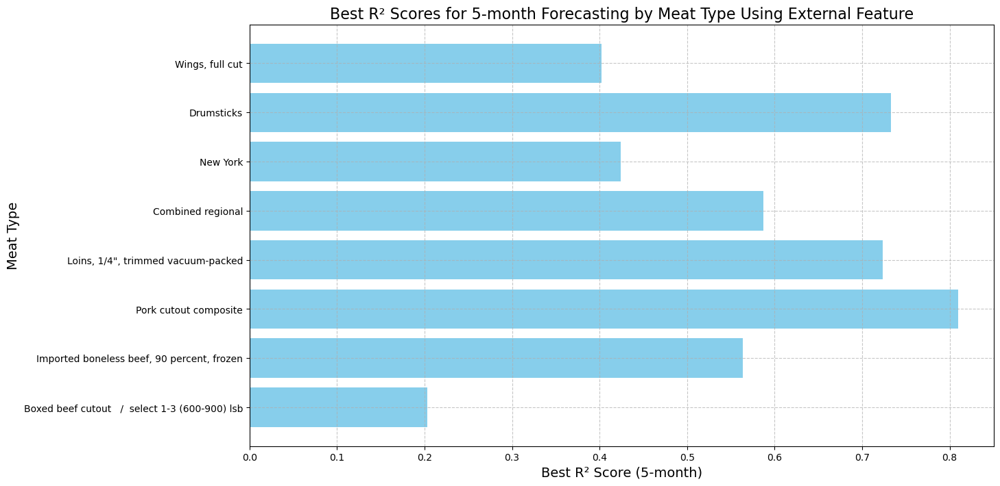

In [245]:
# Tried For All External Features

# List of selected subtypes
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Combined regional', 'New York', 'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

for stype in selected_subtypes:
    print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    n_est = [2, 4, 5, 8, 10, 15, 20, 30]
    r2_scr_final_5_months = 0
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]

        # Adding external features
        data = meat_data[["Meat  Sub-Type", "PRCP", 	"SNOW", 	"TAVG", 	"DisasterCount", 	"CPI",	"Unemployment Rate", 	"GDP Value","Corn Price", "Sorghum Price"]]
        subtype = data[data['Meat  Sub-Type'] == stype]
        subtype = subtype[["PRCP", 	"SNOW", 	"TAVG", 	"DisasterCount", 	"CPI",	"Unemployment Rate", 	"GDP Value","Corn Price", "Sorghum Price"]]
        subtype = subtype[i:] 
        subtype_train = subtype[:-5]
        subtype_test = subtype[-5:]
        
        # Fit scaler only on training data
        scaler = MinMaxScaler()
        subtype_train_scaled = scaler.fit_transform(subtype_train)
        subtype_test_scaled = scaler.transform(subtype_test)
        
        # Concatenate external features with training data
        X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
        for j in n_est:
            model = RandomForestRegressor(n_estimators=j, random_state=10)
            model.fit(X_train_augmented, y_train)
            
            # Forecast future values
            future_forecast = []
            X_train_last = X_train[-1]
            
            for a in range(5):
                # Predict next value based on the last sequence
                X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
                future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
                future_forecast.append(future_prediction[0])
                
                # Update the last sequence by removing the first element and adding the predicted value
                X_train_last = X_train_last[:i]
                X_train_last = np.roll(X_train_last, -1)
                X_train_last[-1] = future_prediction
            
            r2_scr = r2_score(y_test, future_forecast)
            
            if r2_scr > r2_scr_final_5_months:
                r2_scr_final_5_months = r2_scr
                n_est_val_5_months = j
                lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_est_val_5_months,
        'Best R² Score': r2_scr_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("n_estimators:", n_est_val_5_months)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    
# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]

plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type Using External Feature", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


# Gradient Boosting Model

In [15]:
# from sklearn.ensemble import GradientBoostingRegressor
reg = GradientBoostingRegressor(random_state=0)
reg.fit(X_train, y_train)

D:\Bharath_Anconda\Lib\site-packages\sklearn\ensemble\_gb.py:437: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


GradientBoostingRegressor(random_state=0)

### Gradient Boosting Model Forcasting For 5 Months

In [ ]:
# Selected sub-meat types list
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',  
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 'Wings, full cut'
]

# Loop through each meat type and perform analysis
for stype in selected_subtypes:
    print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler= MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price) 

    # Parameters for Gradient Boosting
    n_est = [2,4,5,8,10,15,20]
    max_depth=[5,10,15,20 ,25,30,35,40]
    learning_rate=[0.001,0.1,0.5,0.6,0.7,0.8,0.9]
    r2_scr_final = 0
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]
        
        for j in n_est:
            for k in max_depth:
                for l in learning_rate:
                    model = GradientBoostingRegressor(n_estimators=j, max_depth=k, learning_rate=l, random_state=10)
                    model.fit(X_train, y_train)
                    # Number of future time steps to forecast
                    future_steps = 5
                    X_train_last = X_train[-1]
                    future_forecast = []
                    
                    for _ in range(future_steps):
                        next_pred = model.predict(X_train_last.reshape(1, -1))
                        future_forecast.append(next_pred[0])
                        X_train_last = np.roll(X_train_last, -1)
                        X_train_last[-1] = next_pred
                    
                    r2_scr = r2_score(y_test, future_forecast)
                    print(i)
                    
                    if (r2_scr > r2_scr_final):
                        r2_scr_final = r2_scr
                        n_est_val = j
                        lags = i
                        max_depth_val = k
                        learning_rate_val = l
                        print("lags:", i)
                        print("n_est: ", j)
                        print("max_depth: ", k)
                        print("learning_rate: ", l)
                        print(r2_scr_final)
    print("Meat Type:", stype)
    print("lags:", lags)
    print("n :", n_est_val)
    print("max_depth:",max_depth_val)
    print("learning_rate:",learning_rate_val)
    print("R2_score:", r2_scr_final)

Boxed beef cutout   /  choice 1-3 (600-900) lsb
1
1
1
1
1
1
1
1
1
1
1
1
1
lags: 1
n_est:  2
max_depth:  10
learning_rate:  0.8
0.04351333009397684
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2

### Continued

In [25]:
# Selected sub-meat types list
selected_subtypes = [
    'Hens, 8-16 lb', 'Toms, 16-24 lb',
    'Breast, 4-8 lb', 'Drumsticks', 'Wings, full cut'
]

# Loop through each meat type and perform analysis
for stype in selected_subtypes:
    print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler= MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price) 

    # Parameters for Gradient Boosting
    n_est = [2,4,5,8,10,15,20]
    max_depth=[5,10,15,20 ,25,30,35,40]
    learning_rate=[0.001,0.1,0.5,0.6,0.7,0.8,0.9]
    r2_scr_final = 0
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]
        
        for j in n_est:
            for k in max_depth:
                for l in learning_rate:
                    model = GradientBoostingRegressor(n_estimators=j, max_depth=k, learning_rate=l, random_state=10)
                    model.fit(X_train, y_train)
                    # Number of future time steps to forecast
                    future_steps = 5
                    X_train_last = X_train[-1]
                    future_forecast = []
                    
                    for _ in range(future_steps):
                        next_pred = model.predict(X_train_last.reshape(1, -1))
                        future_forecast.append(next_pred[0])
                        X_train_last = np.roll(X_train_last, -1)
                        X_train_last[-1] = next_pred
                    
                    r2_scr = r2_score(y_test, future_forecast)
                    print(i)
                    
                    if (r2_scr > r2_scr_final):
                        r2_scr_final = r2_scr
                        n_est_val = j
                        lags = i
                        max_depth_val = k
                        learning_rate_val = l
                        print("lags:", i)
                        print("n_est: ", j)
                        print("max_depth: ", k)
                        print("learning_rate: ", l)
                        print(r2_scr_final)
    print("Meat Type:", stype)
    print("lags:", lags)
    print("n :", n_est_val)
    print("max_depth:",max_depth_val)
    print("learning_rate:",learning_rate_val)
    print("R2_score:", r2_scr_final)

Hens, 8-16 lb
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
1
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2



KeyboardInterrupt



### Plotting the graph for each meat sub type

Processing Boxed beef cutout   /  select 1-3 (600-900) lsb
R² Score: 0.6067
RMSE Score: 0.0306


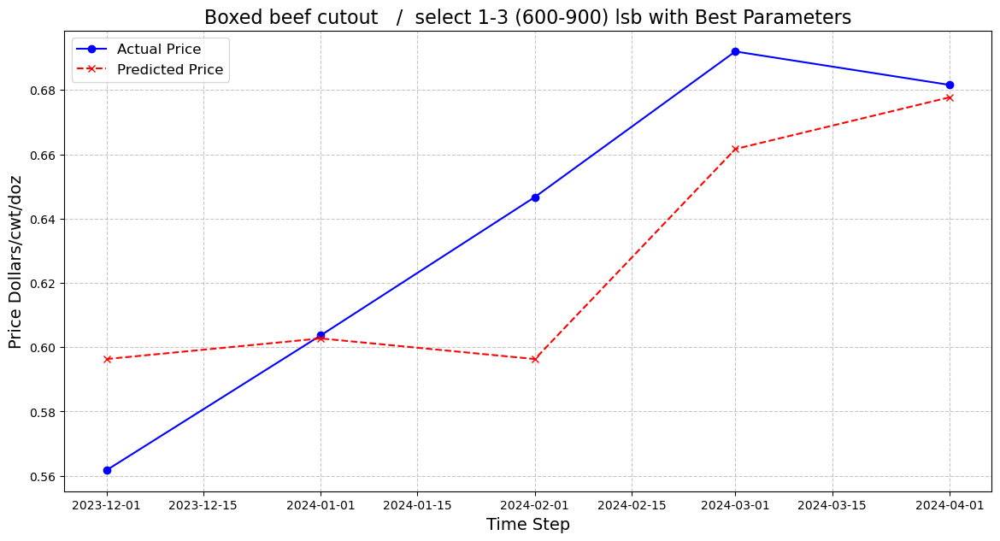

Processing Imported boneless beef, 90 percent, frozen
R² Score: 0.1576
RMSE Score: 0.0749


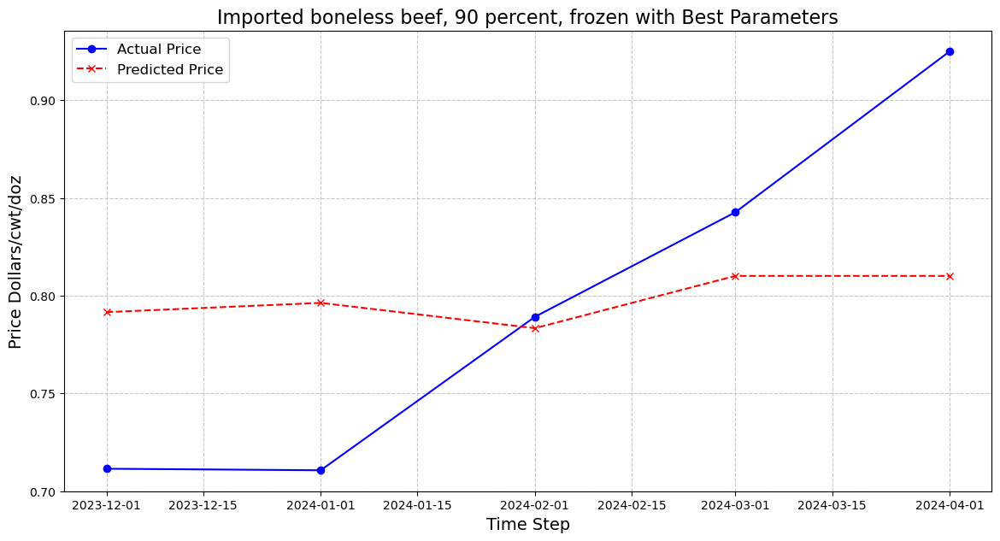

Processing Pork cutout composite
R² Score: 0.9477
RMSE Score: 0.0139


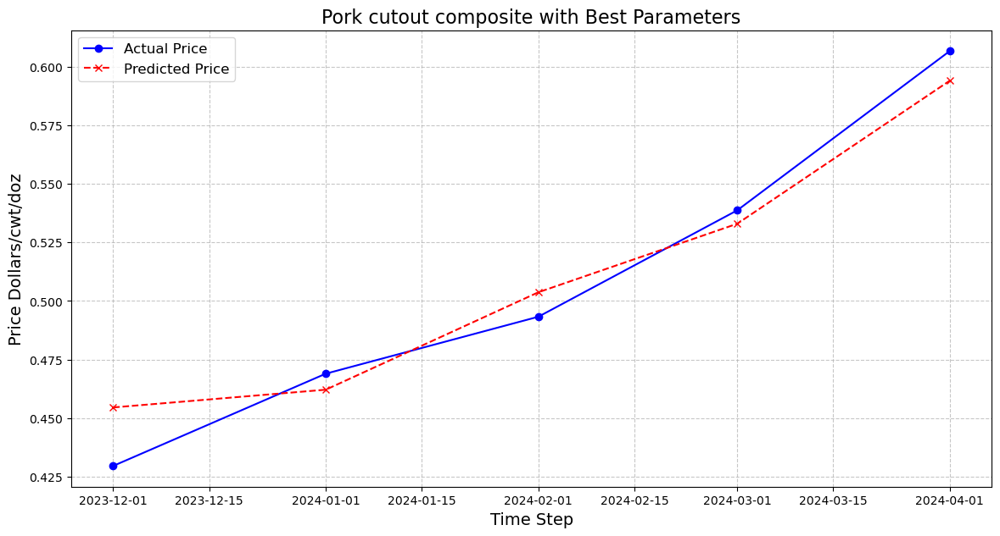

Processing Loins, 1/4", trimmed vacuum-packed
R² Score: 0.9881
RMSE Score: 0.0072


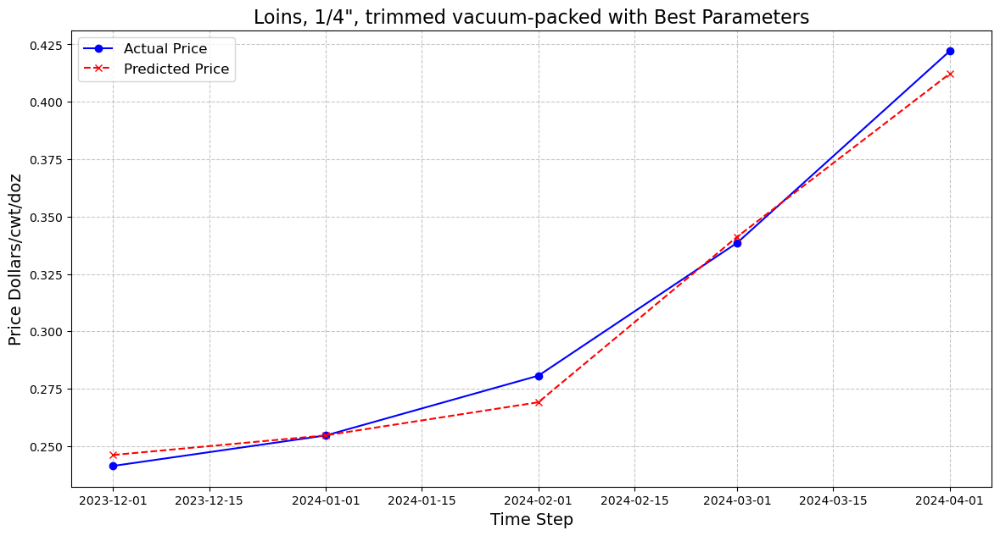

Processing Combined regional
R² Score: 0.9436
RMSE Score: 0.0218


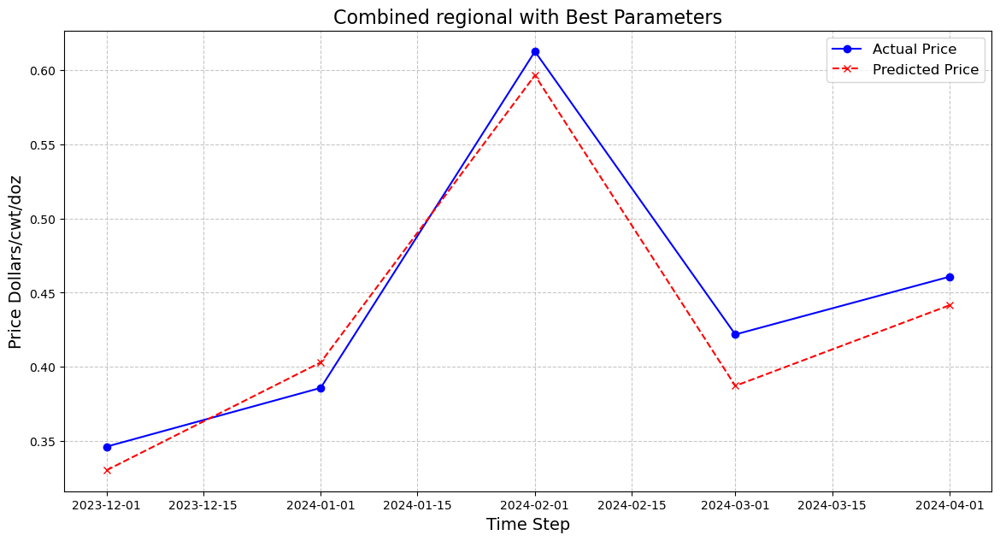

Processing New York
R² Score: 0.7433
RMSE Score: 0.0412


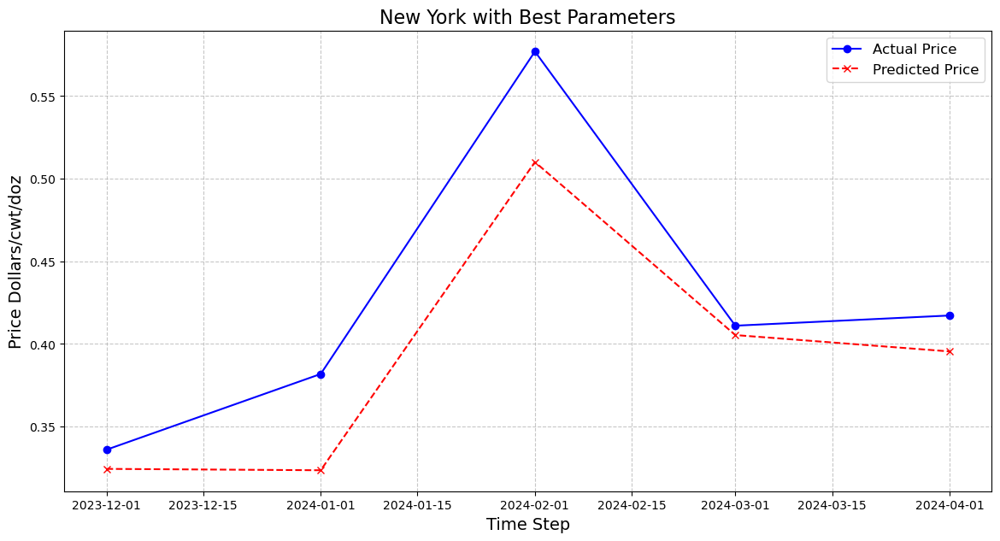

Processing Drumsticks
R² Score: 0.8530
RMSE Score: 0.0086


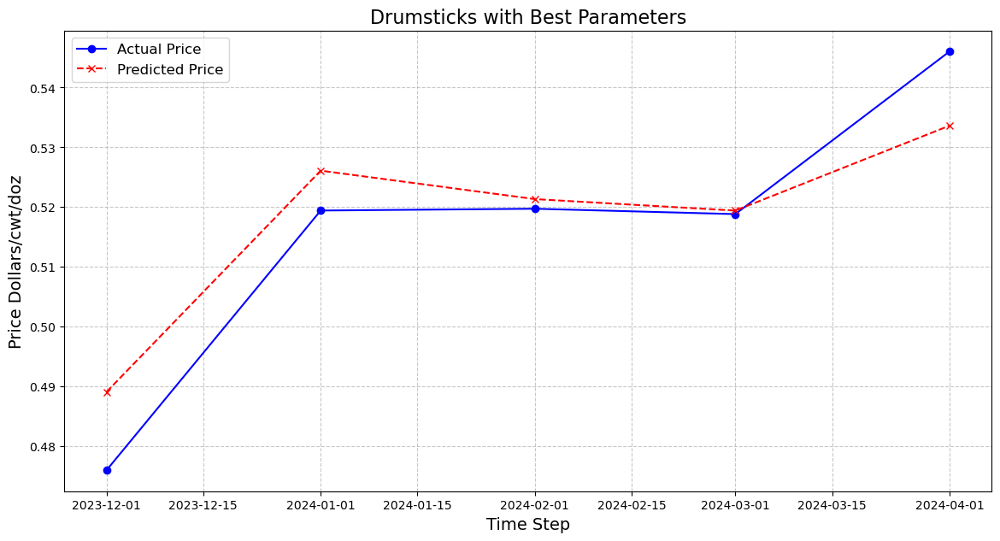

Processing Wings, full cut
R² Score: -55.8667
RMSE Score: 0.2310


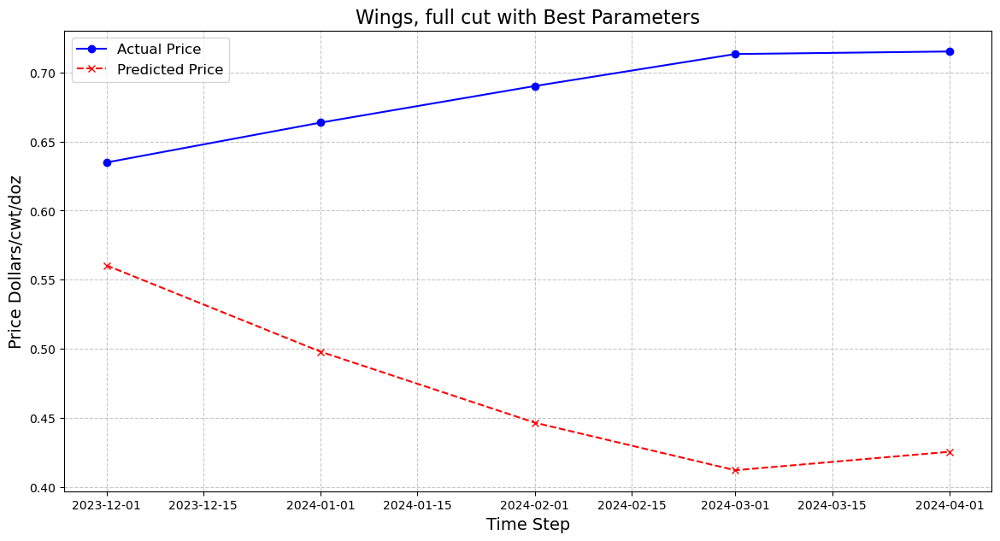

In [23]:
# Example best parameters for Gradient Boosting
warnings.filterwarnings('ignore')
best_parameters_gb = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': {'lags': 32, 'n': 10, 'max_depth': 5, 'learning_rate': 0.7},
    'Imported boneless beef, 90 percent, frozen': {'lags': 42, 'n': 2, 'max_depth': 10, 'learning_rate': 0.6},
    'Pork cutout composite': {'lags': 13, 'n': 20, 'max_depth': 10, 'learning_rate': 0.1},
    'Loins, 1/4", trimmed vacuum-packed': {'lags': 19, 'n': 10, 'max_depth': 10, 'learning_rate': 0.7},
    'Drumsticks': {'lags': 13, 'n': 2, 'max_depth': 10, 'learning_rate': 0.6},
    'Wings, full cut': {'lags': 13, 'n': 2, 'max_depth': 10, 'learning_rate': 0.6}
}

for stype, params in best_parameters_gb.items():
    print(f"Processing {stype}")
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price_scaled = scaler.fit_transform(meat_data_price)
    
    
    best_lags = params['lags']
    best_n = params['n']
    best_max_depth = params['max_depth']
    best_learning_rate = params['learning_rate']
    
    x, y = array_arrangement(meat_data_price_scaled, best_lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    # Train the Gradient Boosting model with the best parameters
    model = GradientBoostingRegressor(n_estimators=best_n, max_depth=best_max_depth, learning_rate=best_learning_rate, random_state=10)
    model.fit(X_train, y_train)
    
    # Forecast future values
    future_steps = 5
    X_train_last = X_train[-1]
    future_forecast = []
    
    for _ in range(future_steps):
        future_prediction = model.predict(X_train_last.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Calculate R² and RMSE scores
    r2_scr = r2_score(y_test, future_forecast)
    rmse_scr = np.sqrt(mean_squared_error(y_test, future_forecast))
    
    print(f"R² Score: {r2_scr:.4f}")
    print(f"RMSE Score: {rmse_scr:.4f}")
    
    # Plotting
    plt.figure(figsize=(14, 7))
    plt.plot(y_test_plot.index, y_test, label='Actual Price', marker='o', color='blue')
    plt.plot(y_test_plot.index, future_forecast, linestyle='--', marker='x', label='Predicted Price', color='red')
    plt.title(f"{stype} with Best Parameters", fontsize=16)
    plt.xlabel("Time Step", fontsize=14)
    plt.ylabel("Price Dollars/cwt/doz", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


# Incorporting External Features

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 5
n_estimators: 20
max_depth: 5
learning_rate: 0.9
Best R² Score (5-month): 0.6226476681332742
Best RMSE (5-month): 0.02994209696322987
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 1
n_estimators: 4
max_depth: 20
learning_rate: 0.7
Best R² Score (5-month): 0.722337915739284
Best RMSE (5-month): 0.04298723397363957
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 14
n_estimators: 10
max_depth: 5
learning_rate: 0.9
Best R² Score (5-month): 0.95561427499936
Best RMSE (5-month): 0.0128293203059131
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 2
n_estimators: 8
max_depth: 10
learning_rate: 0.7
Best R² Score (5-month): 0.929370367537785
Best RMSE (5-month): 0.0176228608859774
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Bes

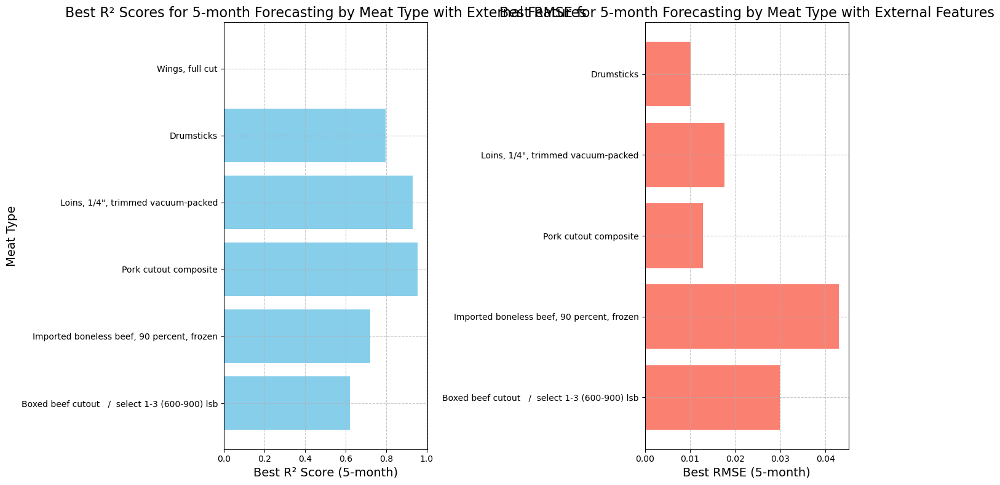

In [114]:

# List of selected subtypes
selected_subtypes = [
     'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

# Parameters for Gradient Boosting

n_estimators_values = [2, 4, 5, 8, 10, 15, 20]
max_depth_values = [5, 10, 15, 20, 25, 30, 35, 40]
learning_rate_values = [0.001, 0.1, 0.5, 0.6, 0.7, 0.8, 0.9]

for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    r2_scr_final_5_months = 0
    rmse_final_5_months = float('inf')
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]

        # Adding external features (TAVG, GDP Value, etc.)
        data = meat_data[["Meat  Sub-Type", "TAVG","CPI", "Sorghum Price"]]
        subtype = data[data['Meat  Sub-Type'] == stype]
        subtype = subtype[["TAVG","CPI", "Sorghum Price"]]
        subtype = subtype[i:]
        subtype_train = subtype[:-5]
        subtype_test = subtype[-5:]
        
        # Fit scaler only on training data
        scaler = MinMaxScaler()
        subtype_train_scaled = scaler.fit_transform(subtype_train)
        subtype_test_scaled = scaler.transform(subtype_test)
        
        # Concatenate external features with training data
        X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
        for n_estimators in n_estimators_values:
            for max_depth in max_depth_values:
                for learning_rate in learning_rate_values:
                    model = GradientBoostingRegressor(n_estimators=n_estimators, 
                                                      max_depth=max_depth, 
                                                      learning_rate=learning_rate, 
                                                      random_state=10)
                    model.fit(X_train_augmented, y_train)
                    
                    # Forecast future values
                    future_forecast = []
                    X_train_last = X_train[-1]
                    
                    for a in range(5):
                        # Predict next value based on the last sequence
                        X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
                        future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
                        future_forecast.append(future_prediction[0])
                        
                        # Update the last sequence by removing the first element and adding the predicted value
                        X_train_last = X_train_last[:i]
                        X_train_last = np.roll(X_train_last, -1)
                        X_train_last[-1] = future_prediction
                    
                    r2_scr = r2_score(y_test, future_forecast)
                    rmse = np.sqrt(mean_squared_error(y_test, future_forecast))
                    
                    if r2_scr > r2_scr_final_5_months:
                        r2_scr_final_5_months = r2_scr
                        rmse_final_5_months = rmse
                        n_estimators_val = n_estimators
                        max_depth_val = max_depth
                        learning_rate_val = learning_rate
                        lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_estimators_val,
        'Best max_depth': max_depth_val,
        'Best learning_rate': learning_rate_val,
        'Best R² Score': r2_scr_final_5_months,
        'Best RMSE': rmse_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("n_estimators:", n_estimators_val)
    print("max_depth:", max_depth_val)
    print("learning_rate:", learning_rate_val)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    print("Best RMSE (5-month):", rmse_final_5_months)
    
# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Processing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 5
n_estimators: 20
max_depth: 5
learning_rate: 0.9
Best R² Score (5-month): 0.6226
Best RMSE (5-month): 8.5269
Best MAE (5-month): 6.8054


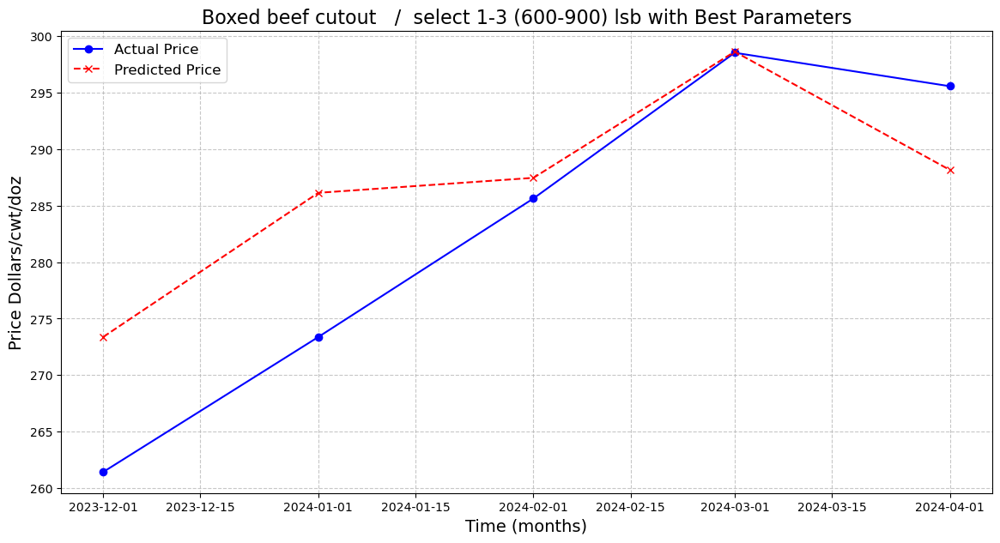

Processing subtype: Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 1
n_estimators: 4
max_depth: 20
learning_rate: 0.7
Best R² Score (5-month): 0.7223
Best RMSE (5-month): 9.3796
Best MAE (5-month): 9.1783


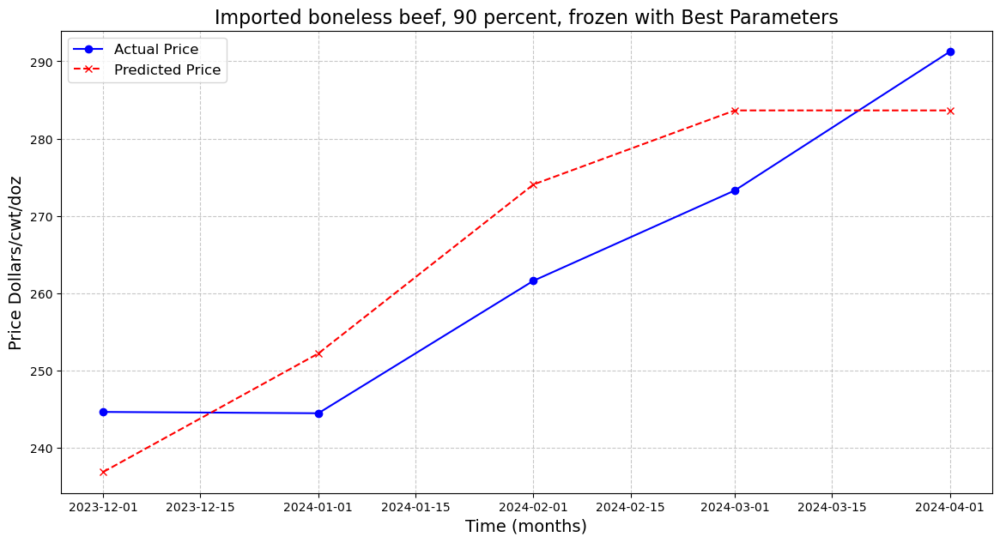

Processing subtype: Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 14
n_estimators: 10
max_depth: 5
learning_rate: 0.9
Best R² Score (5-month): 0.9556
Best RMSE (5-month): 1.1251
Best MAE (5-month): 0.9751


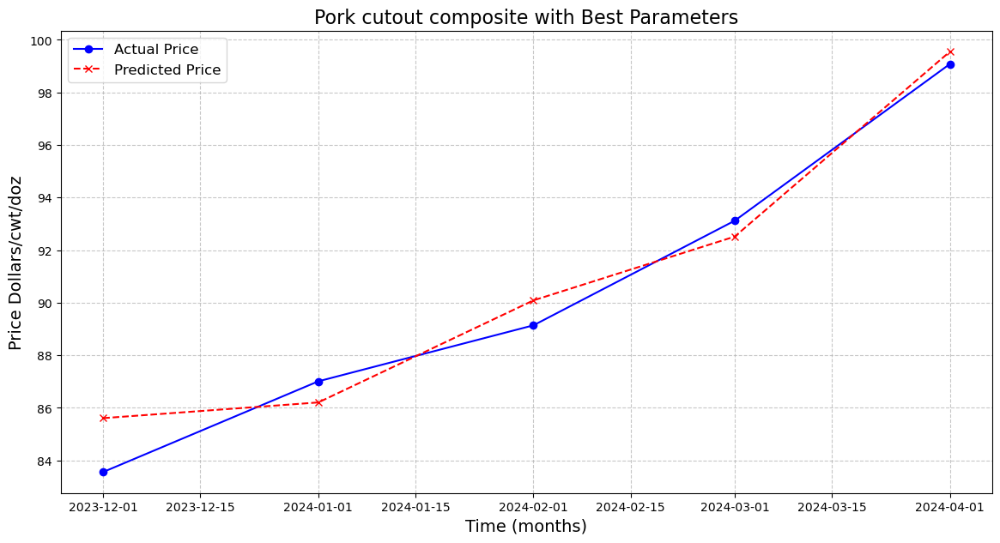

Processing subtype: Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 2
n_estimators: 8
max_depth: 10
learning_rate: 0.7
Best R² Score (5-month): 0.9294
Best RMSE (5-month): 2.1121
Best MAE (5-month): 1.9059


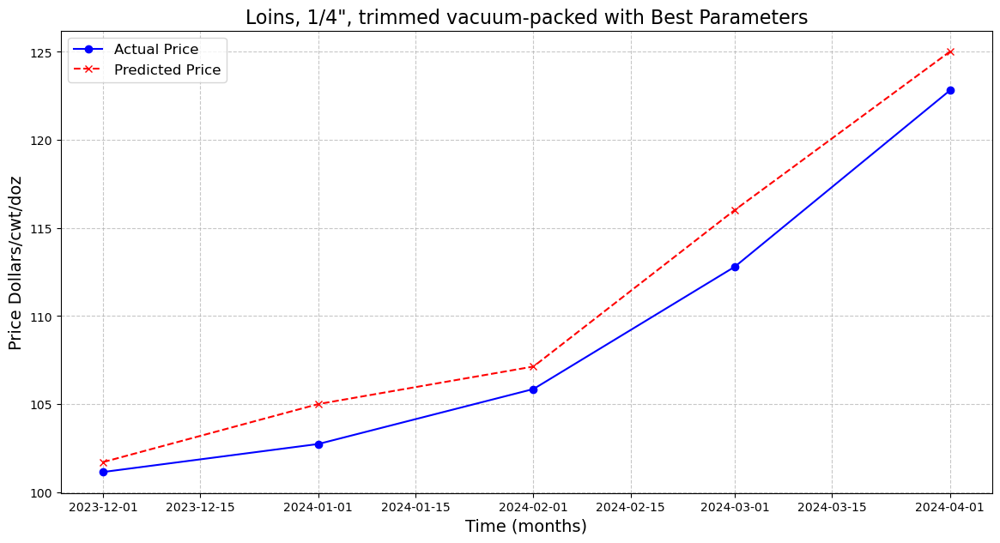

Processing subtype: Drumsticks
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 4
n_estimators: 2
max_depth: 10
learning_rate: 0.6
Best R² Score (5-month): 0.7982
Best RMSE (5-month): 1.0155
Best MAE (5-month): 0.9380


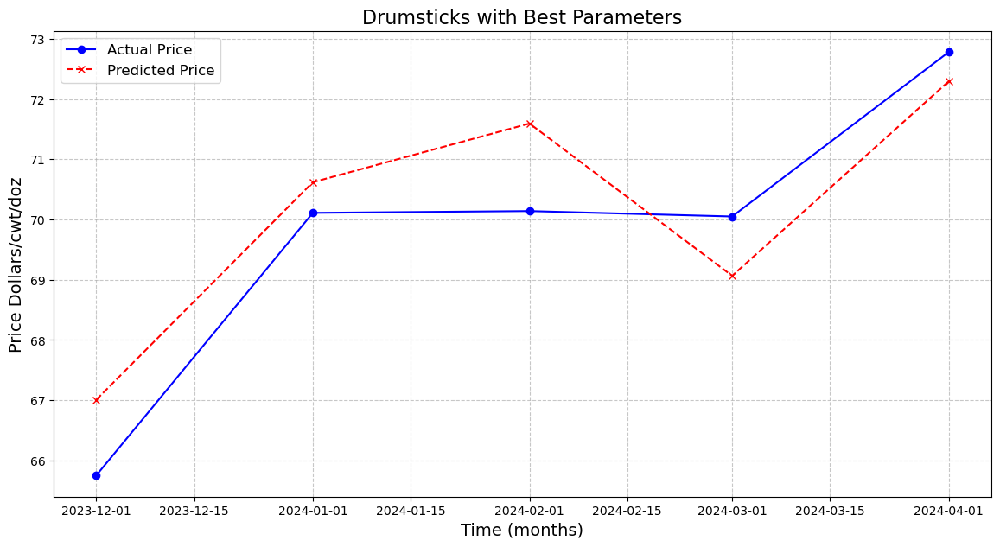

Processing subtype: Wings, full cut
Meat Type: Wings, full cut
Best parameters for 5-month prediction:
Best lags: 4
n_estimators: 2
max_depth: 10
learning_rate: 0.6
Best R² Score (5-month): -66.2932
Best RMSE (5-month): 32.4847
Best MAE (5-month): 31.4429


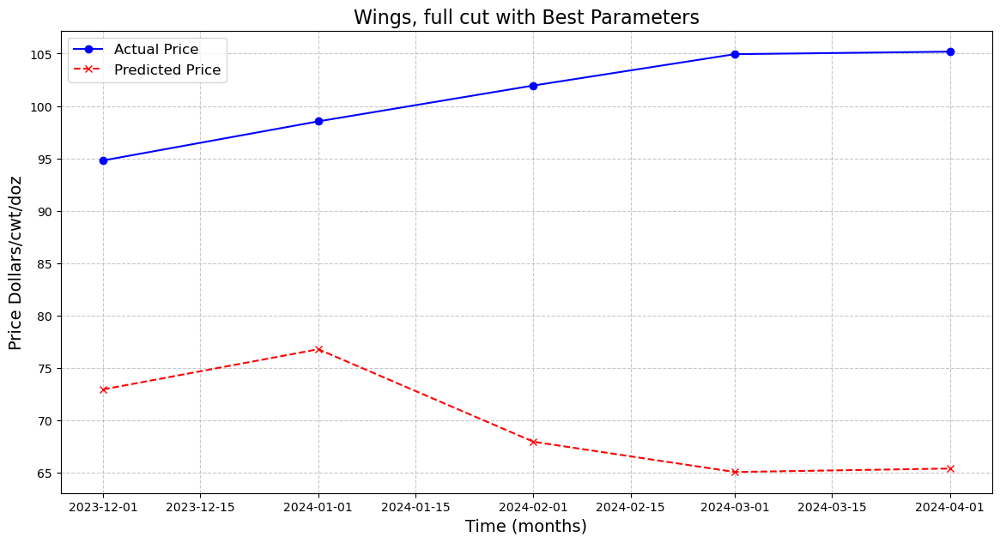

In [118]:
# Best Parameters plot using external feature for all meat sub types

# Define best parameters for each meat type
best_params = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': (5, 20, 5, 0.9),
    'Imported boneless beef, 90 percent, frozen': (1, 4, 20, 0.7),
    'Pork cutout composite': (14, 10, 5, 0.9),
    'Loins, 1/4", trimmed vacuum-packed': (2, 8, 10, 0.7),
    'Drumsticks': (4, 2, 10, 0.6),
    'Wings, full cut': (4, 2, 10, 0.6)
}

# List of selected subtypes
selected_subtypes = list(best_params.keys())

# Store results for plotting
results = []

for stype in selected_subtypes:
    print(f'Processing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    price_scaler = MinMaxScaler()
    meat_data_price = price_scaler.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    # Set parameters
    lags, n_estimators, max_depth, learning_rate = best_params[stype]
    
    # Arrange data
    x, y = array_arrangement(meat_data_price, lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    # Adding external features (TAVG and GDP Value)
    data = meat_data[["Meat  Sub-Type", "TAVG","CPI", "Sorghum Price"]]
    subtype = data[data['Meat  Sub-Type'] == stype]
    subtype = subtype[["TAVG","CPI", "Sorghum Price"]]
    subtype = subtype[lags:] 
    subtype_train = subtype[:-5]
    subtype_test = subtype[-5:]
    
    # Scale external features separately
    external_scaler = MinMaxScaler()
    subtype_train_scaled = external_scaler.fit_transform(subtype_train)
    subtype_test_scaled = external_scaler.transform(subtype_test)
    
    # Concatenate external features with training data
    X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
    # Fit the Gradient Boosting model
    model = GradientBoostingRegressor(n_estimators=n_estimators, 
                                      max_depth=max_depth,
                                      learning_rate=learning_rate,
                                      random_state=10)
    model.fit(X_train_augmented, y_train)
    
    # Forecast future values
    future_forecast = []
    X_train_last = X_train_augmented[-1, :lags]  # Only take the lagged features
    
    for a in range(5):
        # Predict next value based on the last sequence
        X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
        future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        
        # Update the last sequence by removing the first element and adding the predicted value
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Rescale forecast and actual values to original scale
    forecast_rescaled = price_scaler.inverse_transform(np.array(future_forecast).reshape(-1, 1))
    y_test_rescaled = price_scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate R², RMSE, and MAE
    r2_scr = r2_score(y_test_rescaled, forecast_rescaled)
    rmse_scr = np.sqrt(mean_squared_error(y_test_rescaled, forecast_rescaled))
    mae_scr = mean_absolute_error(y_test_rescaled, forecast_rescaled)
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags,
        'Best n_estimators': n_estimators,
        'Best Max Depth': max_depth,
        'Best Learning Rate': learning_rate,
        'Best R² Score': r2_scr,
        'Best RMSE': rmse_scr,
        'Best MAE': mae_scr
    })
    
    print(f"Meat Type: {stype}")
    print(f"Best parameters for 5-month prediction:")
    print(f"Best lags: {lags}")
    print(f"n_estimators: {n_estimators}")
    print(f"max_depth: {max_depth}")
    print(f"learning_rate: {learning_rate}")
    print(f"Best R² Score (5-month): {r2_scr:.4f}")
    print(f"Best RMSE (5-month): {rmse_scr:.4f}")
    print(f"Best MAE (5-month): {mae_scr:.4f}")
    
    # Plotting
    plt.figure(figsize=(14, 7))    
    # Plot actual prices
    plt.plot(y_test_plot.index, y_test_rescaled, label='Actual Price', marker='o', color='blue')
    
    # Plot predicted prices
    plt.plot(y_test_plot.index, forecast_rescaled, linestyle='--', marker='x', label='Predicted Price', color='red')
    
    # Add R², RMSE, and MAE to the plot
    plt.title(f"{stype} with Best Parameters", fontsize=16)
    plt.xlabel("Time (months)", fontsize=14)
    plt.ylabel("Price Dollars/cwt/doz", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)   
    plt.show()

Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 22
n_estimators: 20
max_depth: 10
learning_rate: 0.5
Best R² Score (5-month): 0.07870526733057648
Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 7
n_estimators: 20
max_depth: 5
learning_rate: 0.5
Best R² Score (5-month): 0.6932367415054204
Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 33
n_estimators: 8
max_depth: 5
learning_rate: 0.7
Best R² Score (5-month): 0.8877362045060544
Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 22
n_estimators: 2
max_depth: 15
learning_rate: 0.6
Best R² Score (5-month): 0.9349634971351772
Combined regional
Meat Type: Combined regional
Best parameters for 5-mon

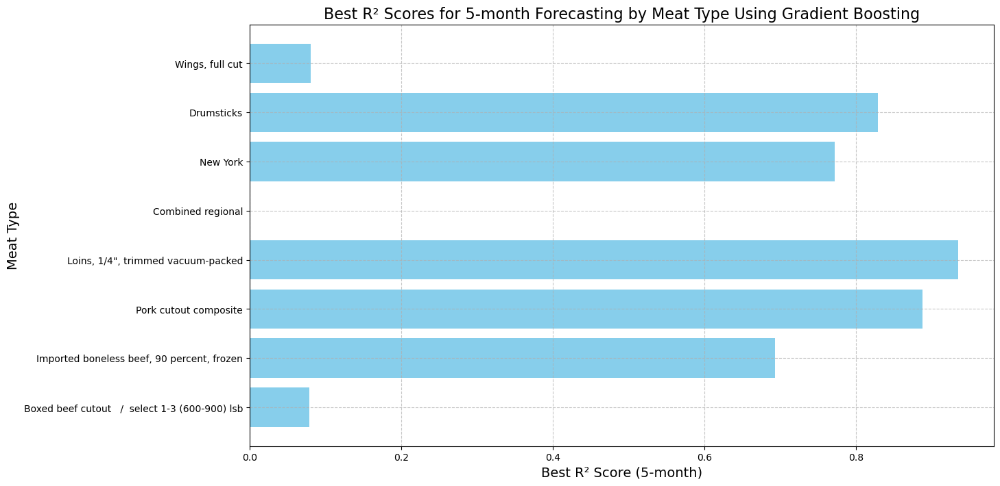

In [72]:
# Tried for ALL external Features

# List of selected subtypes
selected_subtypes = [
     'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Combined regional', 'New York', 'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

# Parameters for Gradient Boosting

n_estimators_values = [2, 4, 5, 8, 10, 15, 20]
max_depth_values = [5, 10, 15, 20, 25, 30, 35, 40]
learning_rate_values = [0.001, 0.1, 0.5, 0.6, 0.7, 0.8, 0.9]

for stype in selected_subtypes:
    print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    r2_scr_final_5_months = 0
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]

        # Adding external features (TAVG, GDP Value, etc.)
        data = meat_data[["Meat  Sub-Type", "PRCP", 	"SNOW", 	"TAVG", 	"DisasterCount", 	"CPI",	"Unemployment Rate", 	"GDP Value","Corn Price", "Sorghum Price"]]
        subtype = data[data['Meat  Sub-Type'] == stype]
        subtype = subtype[["PRCP", 	"SNOW", 	"TAVG", 	"DisasterCount", 	"CPI",	"Unemployment Rate", 	"GDP Value","Corn Price", "Sorghum Price"]]
        subtype = subtype[i:]
        subtype_train = subtype[:-5]
        subtype_test = subtype[-5:]
        
        # Fit scaler only on training data
        scaler = MinMaxScaler()
        subtype_train_scaled = scaler.fit_transform(subtype_train)
        subtype_test_scaled = scaler.transform(subtype_test)
        
        # Concatenate external features with training data
        X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
        for n_estimators in n_estimators_values:
            for max_depth in max_depth_values:
                for learning_rate in learning_rate_values:
                    model = GradientBoostingRegressor(n_estimators=n_estimators, 
                                                      max_depth=max_depth, 
                                                      learning_rate=learning_rate, 
                                                      random_state=10)
                    model.fit(X_train_augmented, y_train)
                    
                    # Forecast future values
                    future_forecast = []
                    X_train_last = X_train[-1]
                    
                    for a in range(5):
                        # Predict next value based on the last sequence
                        X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
                        future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
                        future_forecast.append(future_prediction[0])
                        
                        # Update the last sequence by removing the first element and adding the predicted value
                        X_train_last = X_train_last[:i]
                        X_train_last = np.roll(X_train_last, -1)
                        X_train_last[-1] = future_prediction
                    
                    r2_scr = r2_score(y_test, future_forecast)
                    
                    if r2_scr > r2_scr_final_5_months:
                        r2_scr_final_5_months = r2_scr
                        n_estimators_val = n_estimators
                        max_depth_val = max_depth
                        learning_rate_val = learning_rate
                        lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best n_estimators': n_estimators_val,
        'Best max_depth': max_depth_val,
        'Best learning_rate': learning_rate_val,
        'Best R² Score': r2_scr_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("n_estimators:", n_estimators_val)
    print("max_depth:", max_depth_val)
    print("learning_rate:", learning_rate_val)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    
# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]

plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type Using Gradient Boosting", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


# SVR MODEL

In [85]:
from sklearn.svm import SVR
reg_svr = SVR()
reg_svr.fit(X_train, y_train)

SVR()

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 24
C: 200
Epsilon: 0.0001
Best R² Score (5-month): 0.8896160939397197
Best RMSE (5-month): 0.016194277330560766
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 6
C: 1000
Epsilon: 0.005
Best R² Score (5-month): 0.8416405193057304
Best RMSE (5-month): 0.03246409091968036
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 5
C: 200
Epsilon: 0.005
Best R² Score (5-month): 0.9328387202540221
Best RMSE (5-month): 0.015781252573023423
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 10
C: 100
Epsilon: 0.0001
Best R² Score (5-month): 0.975956681222211
Best RMSE (5-month): 0.010282060313433176
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 13
C: 0.5
Epsilon: 0.1
Best R² Score (5-month): 0.8208279618227936
Best RMSE (5-month): 

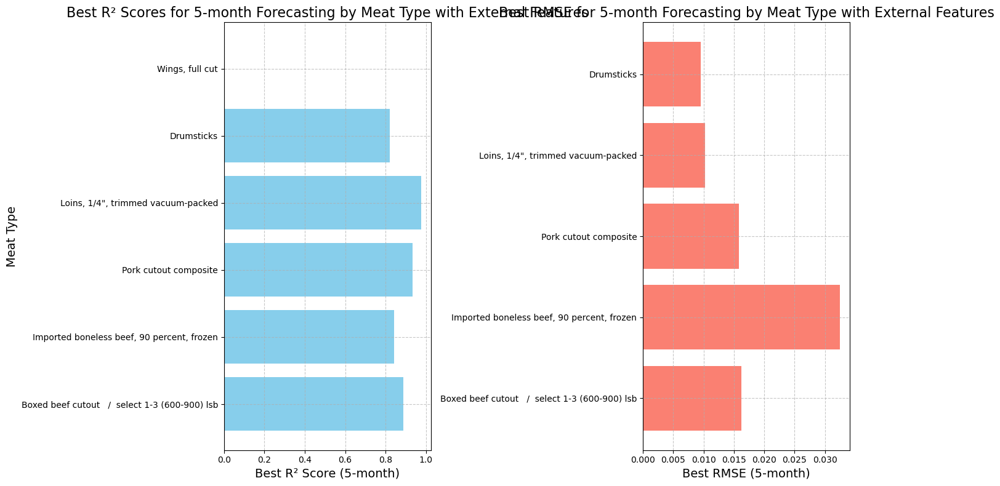

In [28]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVR
from sklearn.metrics import r2_score
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# List of selected subtypes
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Drumsticks', 'Wings, full cut'
]

# Parameters for SVR
# C_values = [0.1, 0.5, 1, 2, 5, 10, 0.2, 0.7, 3, 7, 20, 50, 100]
# epsilon_values = [0.001, 0.01, 0.1, 0.2, 0.5, 1, 2, 5, 0.005, 0.05, 0.15, 0.25, 0.75, 1.5, 3]
C_values = [0.01, 0.1, 0.5, 1, 5, 10, 50, 100, 200, 500, 1000]
epsilon_values = [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0]

# Store results for plotting
results = []

# Loop through each meat type and perform analysis
for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    r2_scr_final_5_months = 0  
    rmse_final_5_months = float('inf')
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]
    
        for C in C_values:
            for epsilon in epsilon_values:
                model = SVR(C=C, epsilon=epsilon)
                model.fit(X_train, y_train)
                
                # Forecast future values
                future_steps = 5
                X_train_last = X_train[-1]
                future_forecast = []
                
                for _ in range(future_steps):
                    future_prediction = model.predict(X_train_last.reshape(1, -1))
                    future_forecast.append(future_prediction[0])
                    X_train_last = np.roll(X_train_last, -1)
                    X_train_last[-1] = future_prediction
                
                # Evaluate performance
                r2_scr = r2_score(y_test, future_forecast)
                rmse = np.sqrt(mean_squared_error(y_test, future_forecast))
                if r2_scr > r2_scr_final_5_months:
                    r2_scr_final_5_months = r2_scr
                    rmse_final_5_months = rmse
                    C_val_5_months = C
                    epsilon_val_5_months = epsilon
                    lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best C': C_val_5_months,
        'Best Epsilon': epsilon_val_5_months,
        'Best R² Score': r2_scr_final_5_months,
        'Best RMSE': rmse_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("C:", C_val_5_months)
    print("Epsilon:", epsilon_val_5_months)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    print("Best RMSE (5-month):", rmse_final_5_months)

# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Processing Boxed beef cutout   /  select 1-3 (600-900) lsb
R² Score: 0.8896
RMSE Score: 0.0162


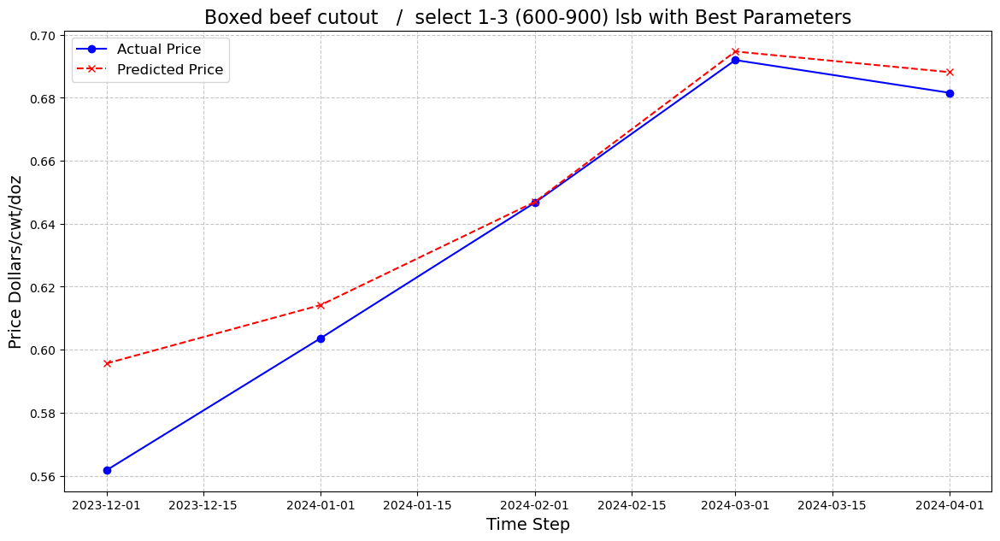

Processing Imported boneless beef, 90 percent, frozen
R² Score: 0.8416
RMSE Score: 0.0325


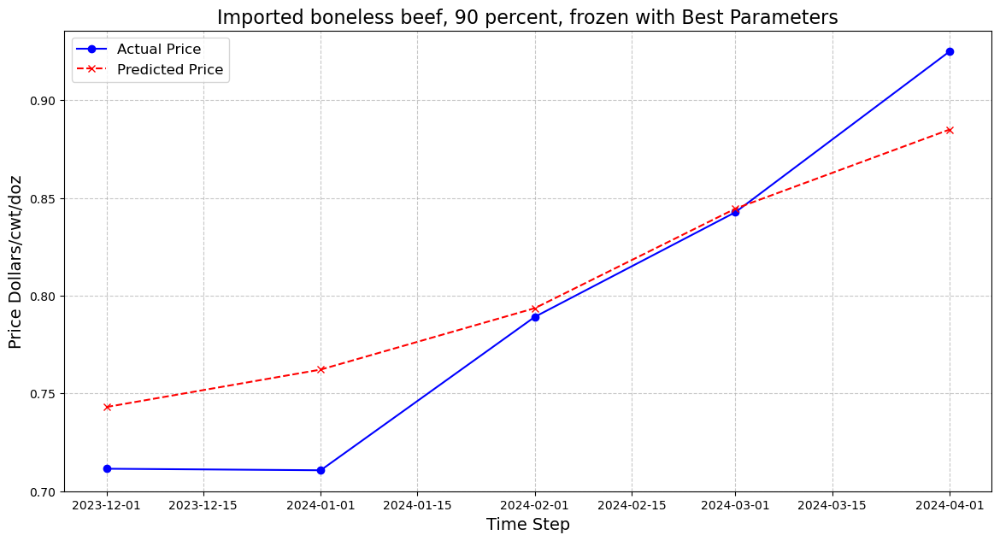

Processing Pork cutout composite
R² Score: 0.9328
RMSE Score: 0.0158


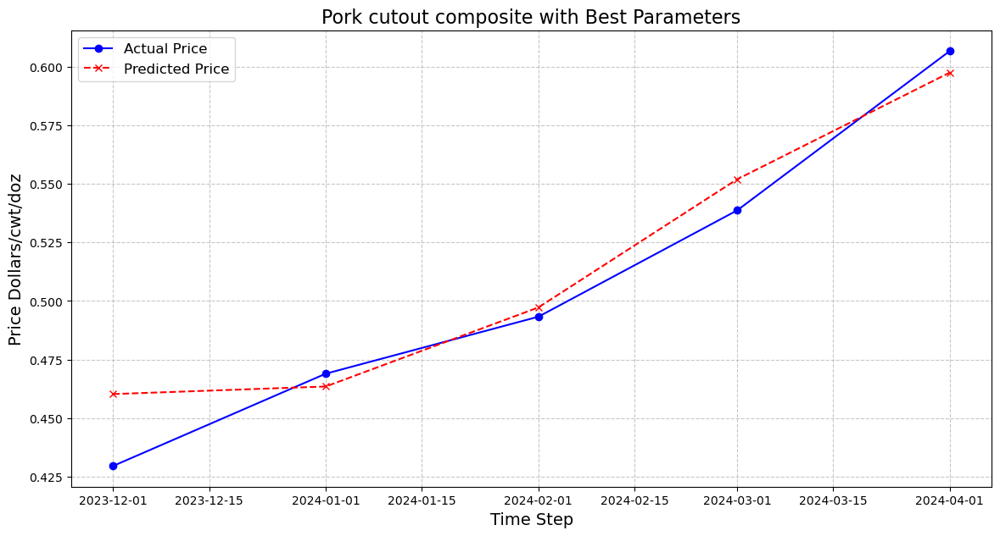

Processing Loins, 1/4", trimmed vacuum-packed
R² Score: 0.9760
RMSE Score: 0.0103


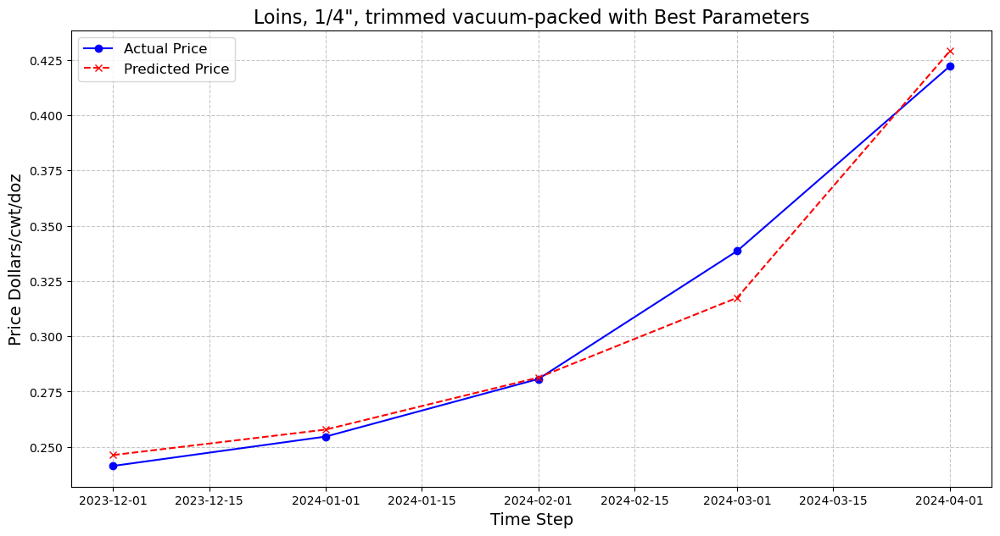

Processing Drumsticks
R² Score: 0.8208
RMSE Score: 0.0095


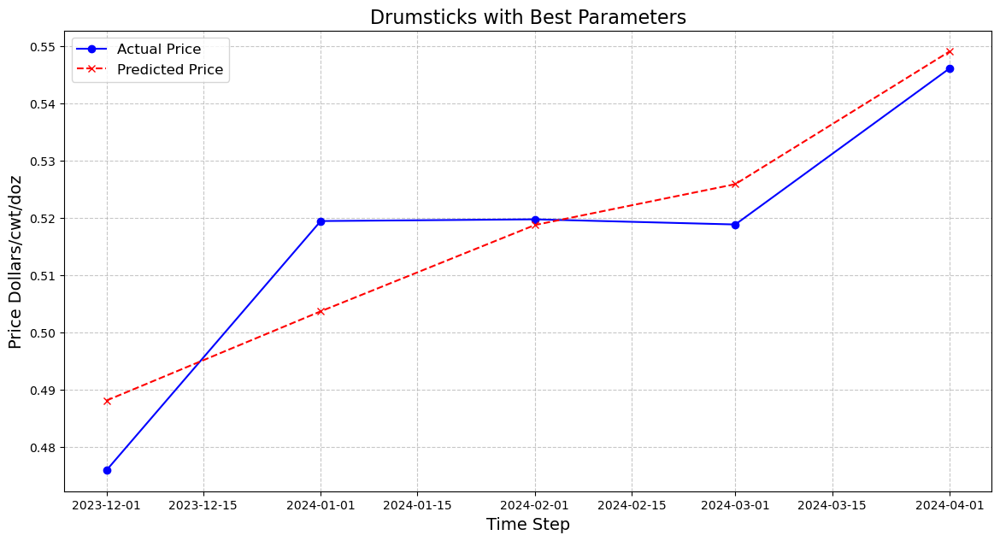

Processing Wings, full cut
R² Score: -42.0335
RMSE Score: 0.2010


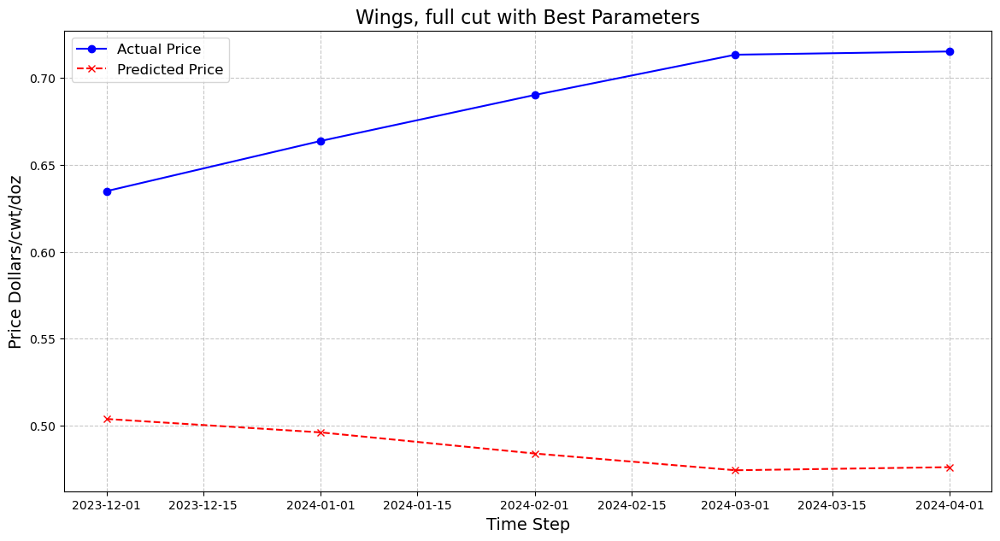

In [34]:
 # Best parameters plots for each meat type
best_parameters = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': {'lags': 24, 'C': 200, 'epsilon': 0.0001},
    'Imported boneless beef, 90 percent, frozen': {'lags': 6, 'C': 1000, 'epsilon': 0.005},
    'Pork cutout composite': {'lags': 5, 'C': 200, 'epsilon': 0.005},
    'Loins, 1/4", trimmed vacuum-packed': {'lags': 10, 'C': 100, 'epsilon': 0.0001},
    'Drumsticks': {'lags': 13, 'C': 0.5, 'epsilon': 0.1},
    'Wings, full cut': {'lags': 13, 'C': 0.5, 'epsilon': 0.1}
}

# Plotting for each meat type with best parameters
for stype, params in best_parameters.items():
    print(f"Processing {stype}")
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price_scaled = scaler.fit_transform(meat_data_price)
    
    best_lags = params['lags']
    best_C = params['C']
    best_epsilon = params['epsilon']
    
    x, y = array_arrangement(meat_data_price_scaled, best_lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    # Train the SVR model with the best parameters
    model = SVR(C=best_C, epsilon=best_epsilon)
    model.fit(X_train, y_train)
    
    # Forecast future values
    future_steps = 5
    X_train_last = X_train[-1]
    future_forecast = []
    
    for _ in range(future_steps):
        future_prediction = model.predict(X_train_last.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Calculate R² and RMSE scores
    r2_scr = r2_score(y_test, future_forecast)
    rmse_scr = np.sqrt(mean_squared_error(y_test, future_forecast))
    
    # Print actual, predicted values, and scores
    # print("Actual values:", y_test)
    # print("Predicted values:", future_forecast)
    print(f"R² Score: {r2_scr:.4f}")
    print(f"RMSE Score: {rmse_scr:.4f}")
    
    # Plotting
    plt.figure(figsize=(14, 7))
    plt.plot(y_test_plot.index, y_test, label='Actual Price', marker='o', color='blue')
    plt.plot(y_test_plot.index, future_forecast, linestyle='--', marker='x', label='Predicted Price', color='red')
    plt.title(f"{stype} with Best Parameters", fontsize=16)
    plt.xlabel("Time Step", fontsize=14)
    plt.ylabel("Price Dollars/cwt/doz", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()


# Incorporting External Features

Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 11
C: 500
Epsilon: 0.0001
Best R² Score (5-month): 0.6041606548282441
Best RMSE (5-month): 0.030666779683508148
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 1
C: 10
Epsilon: 0.05
Best R² Score (5-month): 0.7058804827006351
Best RMSE (5-month): 0.04424285393019698
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 4
C: 1
Epsilon: 0.05
Best R² Score (5-month): 0.8918396936972919
Best RMSE (5-month): 0.020027002100963066
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 8
C: 50
Epsilon: 0.0001
Best R² Score (5-month): 0.8059677021820048
Best RMSE (5-month): 0.029209219557585885
Meat Type: Combined regional
Best parameters for 5-month prediction:
Best lags: 8
C: 50
Epsilon: 0.0001
Best R² Score (5-month): 0
Best RMSE (5-month): inf
Meat Type: N

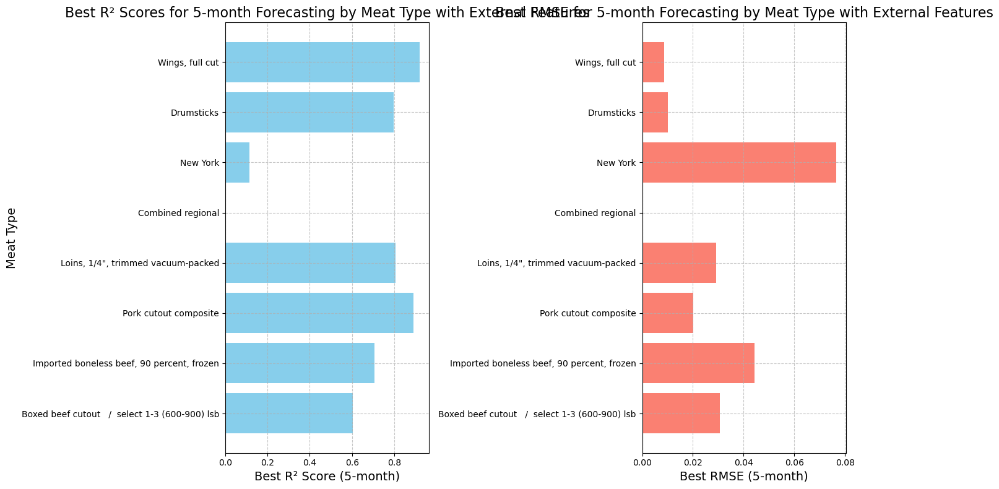

In [52]:
# List of selected subtypes using external features
selected_subtypes = [
    'Boxed beef cutout   /  select 1-3 (600-900) lsb',
    'Imported boneless beef, 90 percent, frozen',
    'Pork cutout composite', 'Loins, 1/4", trimmed vacuum-packed',
    'Combined regional', 'New York', 'Drumsticks', 'Wings, full cut'
]

# Store results for plotting
results = []

# Parameters for SVR
# C_values = [0.1, 0.5, 1, 2, 5, 10, 0.2, 0.7, 3, 7, 20, 50, 100]
# epsilon_values = [0.001, 0.01, 0.1, 0.2, 0.5, 1, 2, 5, 0.005, 0.05, 0.15, 0.25, 0.75, 1.5, 3]
C_values = [0.01, 0.1, 0.5, 1, 5, 10, 50, 100, 200, 500, 1000]
epsilon_values = [0.0001, 0.001, 0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 1.0, 1.5, 2.0, 3.0]

for stype in selected_subtypes:
    #print(stype)
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    scaler = MinMaxScaler()
    meat_data_price = subtype_price_data[['Price Dollars/cwt/doz']]
    meat_data_price = scaler.fit_transform(meat_data_price)
    
    r2_scr_final_5_months = 0
    rmse_final_5_months = float('inf')
    
    for i in range(1, 51):
        x, y = array_arrangement(meat_data_price, i)
        X_train = x[:-5]
        X_test = x[-5:]
        y_train = y[:-5]
        y_test = y[-5:]

        # Adding external features (Corn Price, Sorghum Price, etc.)
        data = meat_data[["Meat  Sub-Type", "TAVG","CPI", "Sorghum Price"]]
        subtype = data[data['Meat  Sub-Type'] == stype]
        subtype = subtype[[	"TAVG","CPI", "Sorghum Price"]]
        subtype = subtype[i:]
        subtype_train = subtype[:-5]
        subtype_test = subtype[-5:]
        
        # Fit scaler only on training data
        scaler = MinMaxScaler()
        subtype_train_scaled = scaler.fit_transform(subtype_train)
        subtype_test_scaled = scaler.transform(subtype_test)
        
        # Concatenate external features with training data
        X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
        for C in C_values:
            for epsilon in epsilon_values:
                model = SVR(C=C, epsilon=epsilon)
                model.fit(X_train_augmented, y_train)
                
                # Forecast future values
                future_forecast = []
                X_train_last = X_train[-1]
                
                for a in range(5):
                    # Predict next value based on the last sequence
                    X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
                    future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
                    future_forecast.append(future_prediction[0])
                    
                    # Update the last sequence by removing the first element and adding the predicted value
                    X_train_last = X_train_last[:i]
                    X_train_last = np.roll(X_train_last, -1)
                    X_train_last[-1] = future_prediction
                
                r2_scr = r2_score(y_test, future_forecast)
                rmse = np.sqrt(mean_squared_error(y_test, future_forecast))
                if r2_scr > r2_scr_final_5_months:
                    r2_scr_final_5_months = r2_scr
                    rmse_final_5_months = rmse
                    C_val_5_months = C
                    epsilon_val_5_months = epsilon
                    lags_5_months = i
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags_5_months,
        'Best C': C_val_5_months,
        'Best Epsilon': epsilon_val_5_months,
        'Best R² Score': r2_scr_final_5_months,
        'Best RMSE': rmse_final_5_months
    })

    print("Meat Type:", stype)
    print("Best parameters for 5-month prediction:")
    print("Best lags:", lags_5_months)
    print("C:", C_val_5_months)
    print("Epsilon:", epsilon_val_5_months)
    print("Best R² Score (5-month):", r2_scr_final_5_months)
    print("Best RMSE (5-month):", rmse_final_5_months)
    
# Plot the results for all meat types
plt.figure(figsize=(14, 8))
meat_types = [result['Meat Type'] for result in results]
r2_scores = [result['Best R² Score'] for result in results]
rmses = [result['Best RMSE'] for result in results]

# Plot R² scores
plt.subplot(1, 2, 1)
plt.barh(meat_types, r2_scores, color='skyblue')
plt.xlabel("Best R² Score (5-month)", fontsize=14)
plt.ylabel("Meat Type", fontsize=14)
plt.title("Best R² Scores for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

# Plot RMSE scores
plt.subplot(1, 2, 2)
plt.barh(meat_types, rmses, color='salmon')
plt.xlabel("Best RMSE (5-month)", fontsize=14)
plt.title("Best RMSE for 5-month Forecasting by Meat Type with External Features", fontsize=16)
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

Processing subtype: Boxed beef cutout   /  select 1-3 (600-900) lsb
Meat Type: Boxed beef cutout   /  select 1-3 (600-900) lsb
Best parameters for 5-month prediction:
Best lags: 11
C: 500
Epsilon: 0.0001
Best R² Score (5-month): 0.6042
Best RMSE (5-month): 8.7333


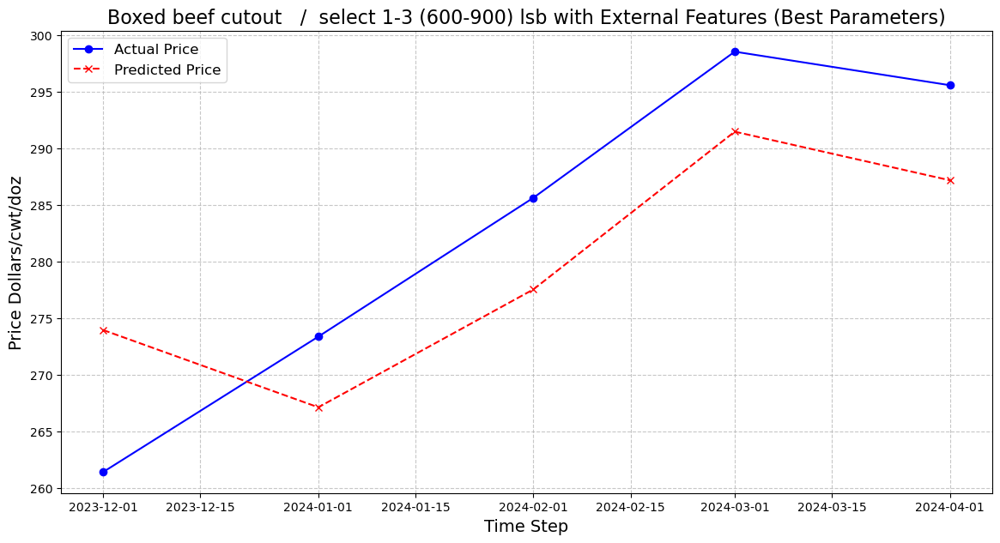

Processing subtype: Imported boneless beef, 90 percent, frozen
Meat Type: Imported boneless beef, 90 percent, frozen
Best parameters for 5-month prediction:
Best lags: 1
C: 10
Epsilon: 0.05
Best R² Score (5-month): 0.7059
Best RMSE (5-month): 9.6536


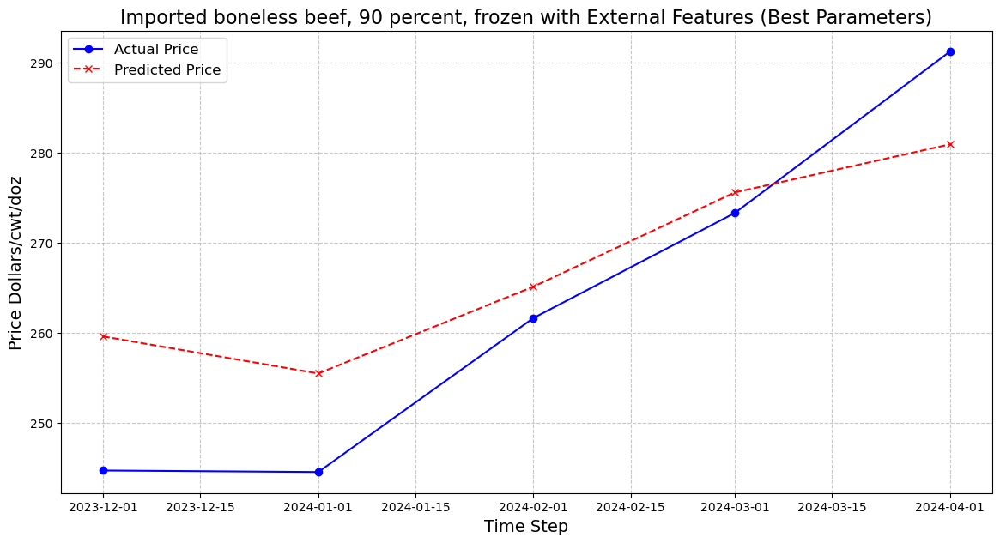

Processing subtype: Pork cutout composite
Meat Type: Pork cutout composite
Best parameters for 5-month prediction:
Best lags: 4
C: 1
Epsilon: 0.05
Best R² Score (5-month): 0.8918
Best RMSE (5-month): 1.7564


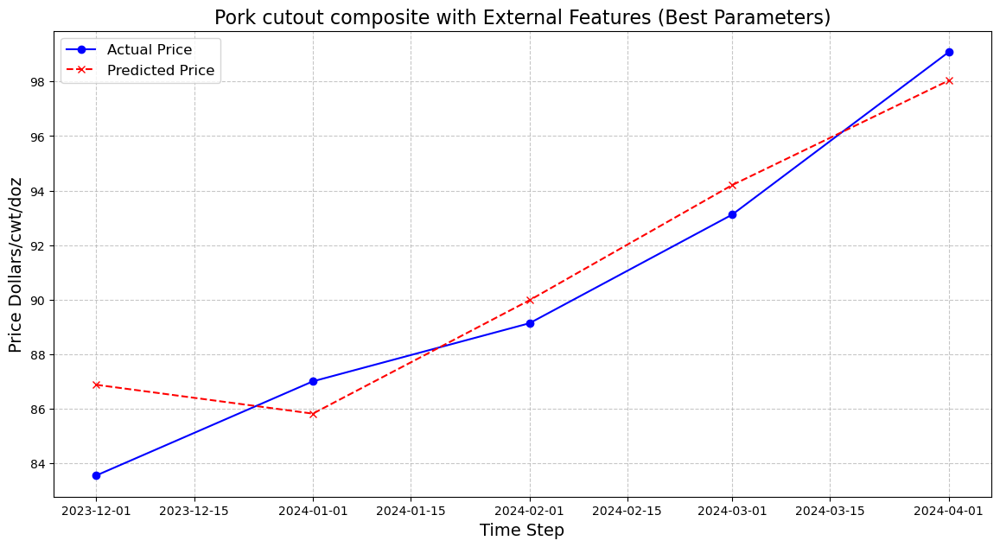

Processing subtype: Loins, 1/4", trimmed vacuum-packed
Meat Type: Loins, 1/4", trimmed vacuum-packed
Best parameters for 5-month prediction:
Best lags: 8
C: 50
Epsilon: 0.0001
Best R² Score (5-month): 0.8060
Best RMSE (5-month): 3.5007


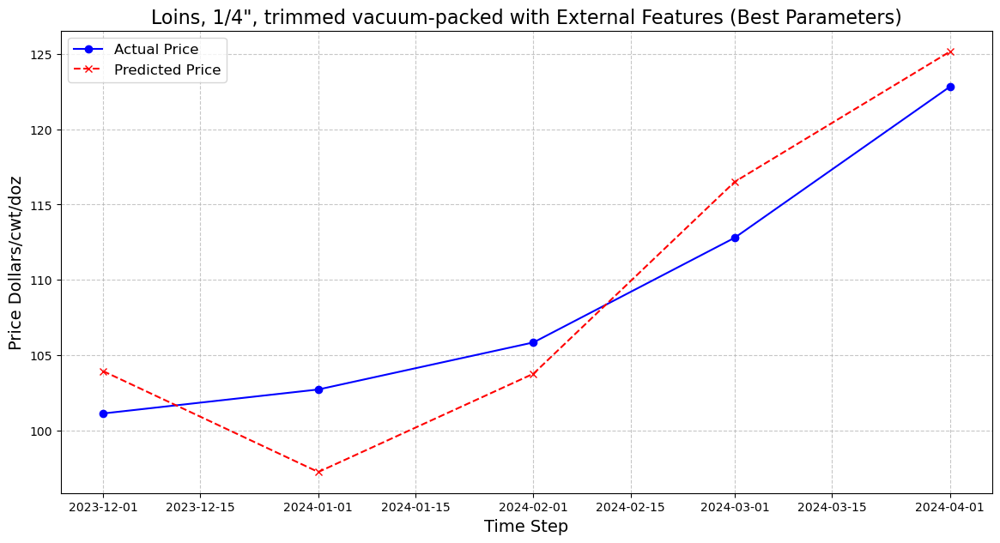

Processing subtype: Drumsticks
Meat Type: Drumsticks
Best parameters for 5-month prediction:
Best lags: 14
C: 0.5
Epsilon: 0.1
Best R² Score (5-month): 0.7971
Best RMSE (5-month): 1.0183


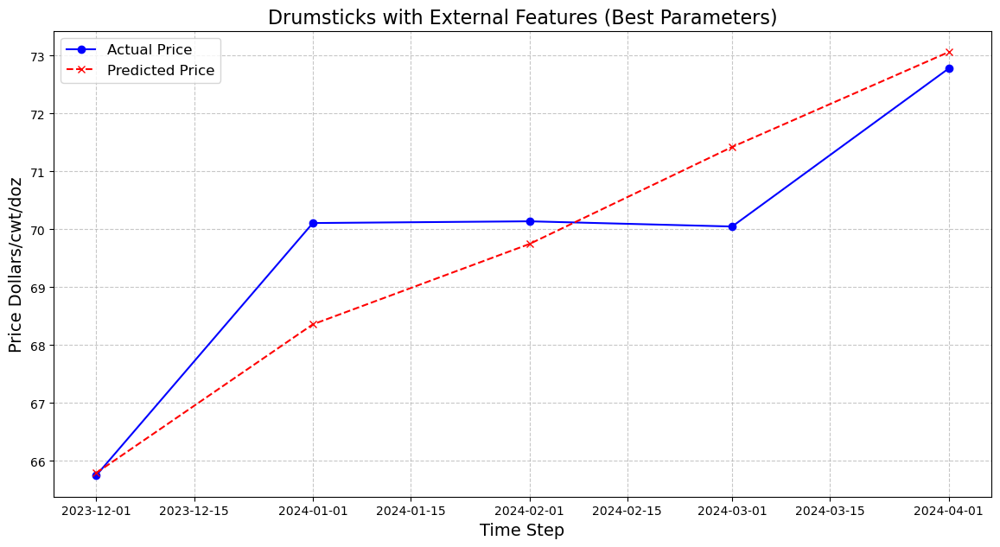

Processing subtype: Wings, full cut
Meat Type: Wings, full cut
Best parameters for 5-month prediction:
Best lags: 2
C: 5
Epsilon: 0.0001
Best R² Score (5-month): 0.9187
Best RMSE (5-month): 1.1291


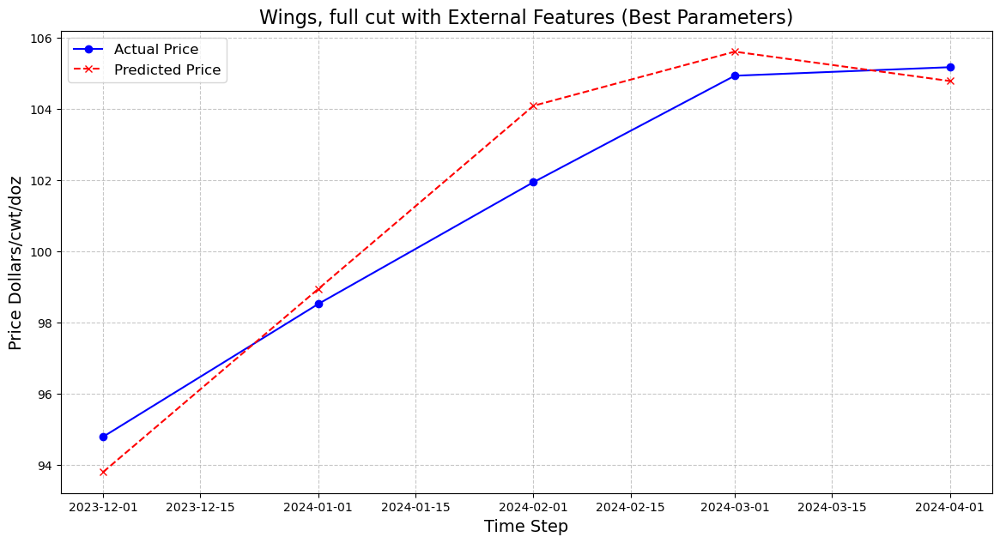

In [47]:
# Best parameters using external feature plot for each meat sub types
best_params = {
    'Boxed beef cutout   /  select 1-3 (600-900) lsb': {'lags': 11, 'C': 500, 'epsilon': 0.0001},
    'Imported boneless beef, 90 percent, frozen': {'lags': 1, 'C': 10, 'epsilon': 0.05},
    'Pork cutout composite': {'lags': 4, 'C': 1, 'epsilon': 0.05},
    'Loins, 1/4", trimmed vacuum-packed': {'lags': 8, 'C': 50, 'epsilon': 0.0001},
    'Drumsticks': {'lags': 14, 'C': 0.5, 'epsilon': 0.1},
    'Wings, full cut': {'lags': 2, 'C': 5, 'epsilon': 0.0001}
}

selected_subtypes = list(best_params.keys())

# Store results for plotting
results = []

for stype in selected_subtypes:
    print(f'Processing subtype: {stype}')
    
    # Filter data for the current subtype
    subtype_price_data = meat_data[meat_data['Meat  Sub-Type'] == stype]
    
    # Scale the target variable
    price_scaler = MinMaxScaler()
    meat_data_price = price_scaler.fit_transform(subtype_price_data[['Price Dollars/cwt/doz']])
    
    # Set parameters
    lags, C, epsilon = best_params[stype].values()
    
    # Arrange data
    x, y = array_arrangement(meat_data_price, lags)
    X_train = x[:-5]
    X_test = x[-5:]
    y_train = y[:-5]
    y_test = y[-5:]
    
    # Adding external features (TAVG and GDP Value)
    data = meat_data[["Meat  Sub-Type", "TAVG","CPI", "Sorghum Price"]]
    subtype = data[data['Meat  Sub-Type'] == stype]
    subtype = subtype[["TAVG","CPI", "Sorghum Price"]]
    subtype = subtype[lags:] 
    subtype_train = subtype[:-5]
    subtype_test = subtype[-5:]
    
    # Scale external features separately
    external_scaler = MinMaxScaler()
    subtype_train_scaled = external_scaler.fit_transform(subtype_train)
    subtype_test_scaled = external_scaler.transform(subtype_test)
    
    # Concatenate external features with training data
    X_train_augmented = np.concatenate((X_train, subtype_train_scaled), axis=1)
    
    # Fit the SVR model
    model = SVR(C=C, epsilon=epsilon)
    model.fit(X_train_augmented, y_train)
    
    # Forecast future values
    future_forecast = []
    X_train_last = X_train_augmented[-1, :lags]  # Only take the lagged features
    
    for a in range(5):
        # Predict next value based on the last sequence
        X_train_last_augmented = np.concatenate((X_train_last, subtype_test_scaled[a]), axis=0)
        future_prediction = model.predict(X_train_last_augmented.reshape(1, -1))
        future_forecast.append(future_prediction[0])
        
        # Update the last sequence by removing the first element and adding the predicted value
        X_train_last = np.roll(X_train_last, -1)
        X_train_last[-1] = future_prediction
    
    # Rescale forecast and actual values to original scale
    forecast_rescaled = price_scaler.inverse_transform(np.array(future_forecast).reshape(-1, 1))
    y_test_rescaled = price_scaler.inverse_transform(y_test.reshape(-1, 1))
    
    # Calculate R² and RMSE
    r2_scr = r2_score(y_test_rescaled, forecast_rescaled)
    rmse_scr = np.sqrt(mean_squared_error(y_test_rescaled, forecast_rescaled))
    
    results.append({
        'Meat Type': stype,
        'Best Lags': lags,
        'Best C': C,
        'Best Epsilon': epsilon,
        'Best R² Score': r2_scr,
        'Best RMSE': rmse_scr
    })
    
    print(f"Meat Type: {stype}")
    print(f"Best parameters for 5-month prediction:")
    print(f"Best lags: {lags}")
    print(f"C: {C}")
    print(f"Epsilon: {epsilon}")
    print(f"Best R² Score (5-month): {r2_scr:.4f}")
    print(f"Best RMSE (5-month): {rmse_scr:.4f}")
    
    # Corrected Plotting
    plt.figure(figsize=(14, 7))    
    # Plot actual prices
    plt.plot(y_test_plot.index, y_test_rescaled, label='Actual Price', marker='o', color='blue')
    
    # Plot predicted prices
    plt.plot(y_test_plot.index, forecast_rescaled, linestyle='--', marker='x', label='Predicted Price', color='red')
    
    # Add R² and RMSE to the plot
    plt.title(f"{stype} with External Features (Best Parameters)", fontsize=16)
    plt.xlabel("Time Step", fontsize=14)
    plt.ylabel("Price Dollars/cwt/doz", fontsize=14)
    plt.legend(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)   
    plt.show()
